In [1]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.2/519.2 kB 25.4 MB/s eta 0:00:00


In [2]:
!lscpu |grep 'Model name'
!nvidia-smi

Model name:                      Intel(R) Xeon(R) CPU @ 2.00GHz
Thu Jun 15 08:11:49 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                        

In [3]:
#https://drive.google.com/file/d/1KfI1pXX4tPba5M8C8MDhzTmVn6mOOi-z/view?usp=sharin

!gdown --id 1KfI1pXX4tPba5M8C8MDhzTmVn6mOOi-z
!unzip './dataset.zip'

Streaming output truncated to the last 5000 lines.
  inflating: dataset_images/Tomato_diseased_20785.jpg  
  inflating: dataset_images/Soybean_healthy_43431.jpg  
  inflating: dataset_images/Tomato_diseased_23088.jpg  
  inflating: dataset_images/Grape_diseased_54552.jpg  
  inflating: dataset_images/Tomato_diseased_18709.jpg  
  inflating: dataset_images/Tomato_diseased_18793.jpg  
  inflating: dataset_images/Tomato_diseased_22501.jpg  
  inflating: dataset_images/Soybean_healthy_42188.jpg  
  inflating: dataset_images/Grape_diseased_11720.jpg  
  inflating: dataset_images/Tomato_diseased_26620.jpg  
  inflating: dataset_images/Apple_diseased_52835.jpg  
  inflating: dataset_images/Cherry_healthy_25205.jpg  
  inflating: dataset_images/Tomato_diseased_19053.jpg  
  inflating: dataset_images/Apple_diseased_52582.jpg  
  inflating: dataset_images/Peach_diseased_50333.jpg  
  inflating: dataset_images/Corn_diseased_30928.jpg  
  inflating: dataset_images/Tomato_diseased_18630.jpg  
  inf

In [4]:
import sys
import os

import time
import pandas as pd
import matplotlib.pyplot as plt

import torch
from torch import Tensor
from torch import nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image
from torchvision.transforms import Compose, Grayscale, Resize, ToPILImage, ToTensor, Normalize, Lambda

from torchmetrics.classification import MulticlassAccuracy
from torchmetrics.classification import MulticlassPrecision
from torchmetrics.classification import MulticlassRecall
from torchmetrics.classification import MulticlassF1Score
from torchmetrics.classification import MulticlassROC
from torchmetrics.classification import MulticlassAUROC

from sklearn.model_selection import train_test_split

# Carga del set de datos

## Clase para el set de datos

In [5]:
class CustomDataset(Dataset):
    def __init__(self, img_dir, file_names, labels, transform=None, target_transform=None):
        self.img_dir = img_dir
        self.img_labels = labels
        self.file_names = file_names
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.file_names.iloc[idx])
        image = read_image(img_path)
        label = self.img_labels.iloc[idx]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label


## Directorios

In [6]:
dataset_path = './dataset.csv'
images_path = './dataset_images'

dataset = pd.read_csv(dataset_path)
dataset_file_names = dataset['file_name']
dataset_labels = dataset['label']

dataset.sample(5).head()

,file_name,label
27571,Tomato_diseased_27571.jpg,4
26490,Tomato_diseased_26490.jpg,4
49990,Potato_diseased_49990.jpg,17
50755,Peach_diseased_50755.jpg,22
47760,Tomato_healthy_47760.jpg,21


## Distribución de las clases en el set de datos

In [7]:
class_ids = {
    0: 'no-leaf',
    1: 'squash-diseased',
    2: 'apple-healthy',
    3: 'orange-diseased',
    4: 'tomato-diseased',
    5: 'grape-diseased',
    6: 'blueberry-healthy',
    7: 'grape-healthy',
    8: 'pepper-healthy',
    9: 'strawberry-diseased',
    10: 'potato-healthy',
    11: 'raspberry-healthy',
    12: 'pepper-diseased',
    13: 'cherry-healthy',
    14: 'strawberry-healthy',
    15: 'corn-diseased',
    16: 'corn-healthy',
    17: 'potato-diseased',
    18: 'soybean-healthy',
    19: 'peach-healthy',
    20: 'apple-diseased',
    21: 'tomato-healthy',
    22: 'peach-diseased',
    23: 'cherry-diseased'
}

def count_dataset_classes(labels, class_ids):
    class_count = {}

    for label in labels:
        if(class_ids[label] not in class_count):
            class_count[class_ids[label]] = 1
        else:
            class_count[class_ids[label]] += 1

    return class_count

<Axes: title={'center': 'Distribución de clases en el dataset'}, xlabel='class'>

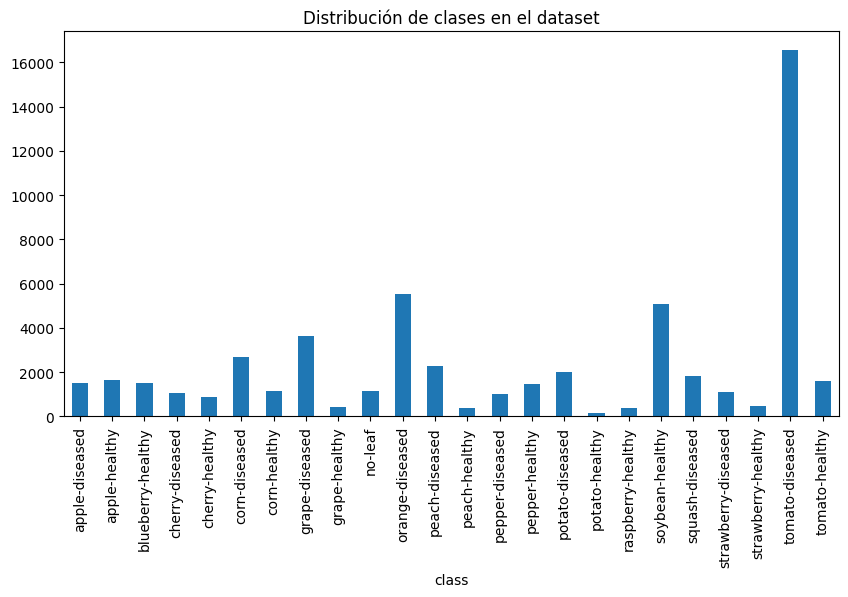

In [8]:
dataset_class_count = count_dataset_classes(dataset_labels, class_ids)
dataset_class_count = {
    'class': list(dataset_class_count.keys()),
    'count': list(dataset_class_count.values())
}

df = pd.DataFrame.from_dict(dataset_class_count)
df.sort_values(by=['class'], inplace=True)
df.index = df['class']
df.plot(kind='bar', title='Distribución de clases en el dataset', legend=False, figsize=(10, 5))

## División del set de datos

### Set para la ejecución #1

In [9]:
X_encoder_1, X_classifier_1, y_encoder_1, y_classifier_1 = train_test_split(
    dataset_file_names, dataset_labels, train_size=0.8, random_state=420, stratify=dataset_labels)

X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(
    X_classifier_1, y_classifier_1, train_size=0.6, random_state=420, stratify=y_classifier_1)

print('Datos para el encoder', X_encoder_1.shape)
print('Datos para el clasificador:', X_classifier_1.shape)

print('\tDatos de entrenamiento para el clasificador:', X_train_1.shape)
print('\tDatos de prueba para el clasificador:', X_test_1.shape)

Datos para el encoder (44358,)
Datos para el clasificador: (11090,)
	Datos de entrenamiento para el clasificador: (6654,)
	Datos de prueba para el clasificador: (4436,)


### Set para la ejecución #2

In [10]:
X_encoder_2, X_classifier_2, y_encoder_2, y_classifier_2 = train_test_split(
    dataset_file_names, dataset_labels, train_size=0.5, random_state=204, stratify=dataset_labels)

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(
    X_classifier_2, y_classifier_2, train_size=0.8, random_state=204, stratify=y_classifier_2)

print('Datos para el encoder', X_encoder_2.shape)
print('Datos para el clasificador:', X_classifier_2.shape)

print('\tDatos de entrenamiento para el clasificador:', X_train_2.shape)
print('\tDatos de prueba para el clasificador:', X_test_2.shape)

Datos para el encoder (27724,)
Datos para el clasificador: (27724,)
	Datos de entrenamiento para el clasificador: (22179,)
	Datos de prueba para el clasificador: (5545,)


## Feature Engineering

In [11]:
encoder_dataset_1 = CustomDataset(images_path, X_encoder_1, y_encoder_1, transform=Compose([
    Lambda(lambda x: x[:3]), # Convierte de RGBA a RGB
    Grayscale(), # Se pasa a escala de grises para disminuir la dimensionalidad
    ToPILImage(),
    ToTensor(),
    Resize((250, 250)), # Se redimensionan las imágenes a 250x250 para que todas tengan las mismas dimensiones
    Normalize(0.5, 0.5) # Se normalizan los valores de los pixeles
]))

train_dataset_1 = CustomDataset(images_path, X_train_1, y_train_1, transform=Compose([
    Lambda(lambda x: x[:3]),
    Grayscale(),
    ToPILImage(),
    ToTensor(),
    Resize((250, 250)),
    Normalize(0.5, 0.5)
]))

test_dataset_1 = CustomDataset(images_path, X_test_1, y_test_1, transform=Compose([
    Lambda(lambda x: x[:3]),
    Grayscale(),
    ToPILImage(),
    ToTensor(),
    Resize((250, 250)),
    Normalize(0.5, 0.5)
]))

In [12]:
encoder_dataset_2 = CustomDataset(images_path, X_encoder_2, y_encoder_2, transform=Compose([
    Lambda(lambda x: x[:3]),
    Grayscale(), # Se pasa a escala de grises para disminuir la dimensionalidad
    ToPILImage(),
    ToTensor(),
    Resize((250, 250)), # Se redimensionan las imágenes a 250x250 para que todas tengan las mismas dimensiones
    Normalize(0.5, 0.5) # Se normalizan los valores de los pixeles
]))

train_dataset_2 = CustomDataset(images_path, X_train_2, y_train_2, transform=Compose([
    Lambda(lambda x: x[:3]),
    Grayscale(),
    ToPILImage(),
    ToTensor(),
    Resize((250, 250)),
    Normalize(0.5, 0.5)
]))

test_dataset_2 = CustomDataset(images_path, X_test_2, y_test_2, transform=Compose([
    Lambda(lambda x: x[:3]),
    Grayscale(),
    ToPILImage(),
    ToTensor(),
    Resize((250, 250)),
    Normalize(0.5, 0.5)
]))

# Uso de GPU si está disponible

In [13]:
device = ("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using {device} device")

Using cuda device


# Métricas de evaluación

## Definición de métricas

In [14]:
train_accuracy = MulticlassAccuracy(num_classes=24, average=None).to(device)
test_accuracy = MulticlassAccuracy(num_classes=24, average=None).to(device)

train_precision = MulticlassPrecision(num_classes=24, average=None).to(device)
test_precision = MulticlassPrecision(num_classes=24, average=None).to(device)

train_recall = MulticlassRecall(num_classes=24, average=None).to(device)
test_recall = MulticlassRecall(num_classes=24, average=None).to(device)

train_f1 = MulticlassF1Score(num_classes=24, average=None).to(device)
test_f1 = MulticlassF1Score(num_classes=24, average=None).to(device)

train_roc = MulticlassROC(num_classes=24).to(device)
test_roc = MulticlassROC(num_classes=24).to(device)

train_auroc = MulticlassAUROC(num_classes=24).to(device)
test_auroc = MulticlassAUROC(num_classes=24).to(device)

## Cálculo de métricas

In [15]:
def compute_metrics(train_list, test_list, train_loss, test_loss):
    train_list.append({
        'loss': train_loss,
        'accuracy': train_accuracy.compute(),
        'precision': train_precision.compute(),
        'recall': train_recall.compute(),
        'f1': train_f1.compute(),
        'roc': train_roc.compute(),
        'auroc': train_auroc.compute()
    })

    test_list.append({
        'loss': test_loss,
        'accuracy': test_accuracy.compute(),
        'precision': test_precision.compute(),
        'recall': test_recall.compute(),
        'f1': test_f1.compute(),
        'roc': test_roc.compute(),
        'auroc': test_auroc.compute()
    })

    train_accuracy.reset()
    train_precision.reset()
    train_recall.reset()
    train_f1.reset()
    train_roc.reset()
    train_auroc.reset()

    test_accuracy.reset()
    test_precision.reset()
    test_recall.reset()
    test_f1.reset()
    test_roc.reset()
    test_auroc.reset()

## Tabla de métricas

In [16]:
def show_metrics_table(train_metrics, test_metrics, epochs):
    for epoch in range(epochs):
        print(f'------------------------------------------------------- Epoch #{epoch+1} -------------------------------------------------------')
        epoch_metrics_df = pd.DataFrame({
            'Class': list(class_ids.values()),

            'Train Accuracy': Tensor.cpu(train_metrics[epoch]['accuracy']),
            'Test Accuracy': Tensor.cpu(test_metrics[epoch]['accuracy']),

            'Train Precision': Tensor.cpu(train_metrics[epoch]['precision']),
            'Test Precision': Tensor.cpu(test_metrics[epoch]['precision']),

            'Train Recall': Tensor.cpu(train_metrics[epoch]['recall']),
            'Test Recall': Tensor.cpu(test_metrics[epoch]['recall']),

            'Train F1-Score': Tensor.cpu(train_metrics[epoch]['f1']),
            'Test F1-Score': Tensor.cpu(test_metrics[epoch]['f1'])
        })
        display(epoch_metrics_df)

## Gráficas de entrenamiento

### Curva de entrenamiento

In [17]:
def show_learning_curve(train_losses, test_losses=None, epoch_list=[]):
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.set_title('Loss vs Epoch')
    ax.set_ylabel('Loss')
    ax.set_xlabel('Epoch')
    ax.set_xticks(epoch_list)

    ax.plot(epoch_list, train_losses, label='Train', color='b', marker='o')
    if(test_losses is not None):
        ax.plot(epoch_list, test_losses, label='Test', color='g', marker='o')

    ax.legend()
    fig.show()

### AUROC

In [18]:
def show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc, test_roc_fpr, test_roc_tpr, test_auroc):
    fig, ax = plt.subplots(1, 2, figsize=(20, 8))

    for i in range(len(train_roc_tpr)):
        ax[0].plot(Tensor.cpu(train_roc_fpr[i]), Tensor.cpu(train_roc_tpr[i]), label=f'Class {i}')
        ax[1].plot(Tensor.cpu(test_roc_fpr[i]), Tensor.cpu(test_roc_tpr[i]), label=f'Class {i}')

    ax[0].set_title('Train ROC Curve - AUROC: {:.4f}'.format(train_auroc))
    ax[0].legend()

    ax[1].set_title('Test ROC Curve - AUROC: {:.4f}'.format(test_auroc))
    ax[1].legend()

    fig.show()

### Reconstrucción de imágenes

In [19]:
def reconstruct_image(model, dataloader, num_samples, add_noise=False):
    model.eval()
    X_test = next(iter(dataloader))

    fig, ax = plt.subplots(2, num_samples, figsize=(12, 8))
    for i in range(num_samples):
        current_sample = X_test[0][i].to(device)

        if(add_noise):
          gaussian_noise = (0.1**0.5)*torch.randn(current_sample.shape)
          gaussian_noise = gaussian_noise.to(device)

          current_sample = current_sample + gaussian_noise

        reconstructed_image = model(current_sample)

        current_sample = current_sample.permute(1, 2, 0)
        current_sample = Tensor.cpu(current_sample)

        reconstructed_image = reconstructed_image.permute(1, 2, 0)
        reconstructed_image = Tensor.cpu(reconstructed_image).detach().numpy()

        ax[0, i].imshow(current_sample)
        ax[0, i].axis('off')

        ax[1, i].imshow(reconstructed_image)
        ax[1, i].axis('off')

    plt.show()

# Función de entrenamiento

In [20]:
def train(dataloader, model, loss_fn, optimizer, unsupervised=False, add_noise=False):
    print('--------------------------- Training --------------------------\n')
    size = len(dataloader.dataset)
    num_batches = len(dataloader)

    loss = torch.Tensor([0]).to(device)
    epoch_loss = 0

    model.train()
    for batch, (X, y) in enumerate(dataloader):
        X = X.to(device)
        y = y.to(device)

        if(add_noise):
          gaussian_noise = (0.1**0.5)*torch.randn(X.shape)
          gaussian_noise = gaussian_noise.to(device)

          noisy_X = X + gaussian_noise

          pred = model(noisy_X)
        else:
          pred = model(X)

        if(unsupervised):
            loss = loss_fn(pred, X)
        else:
            train_accuracy.update(pred, y)
            train_precision.update(pred, y)
            train_recall.update(pred, y)
            train_f1.update(pred, y)
            train_roc.update(pred, y)
            train_auroc.update(pred, y)

            loss = loss_fn(pred, y)

        epoch_loss += loss.item()

        loss.backward()
        optimizer.step()
        optimizer.zero_grad()

        if batch % 10 == 0:
            loss, current = epoch_loss/(batch+1), (batch + 1) * len(X)
            print(f'Current Loss: {loss:>7f}  [{current:>5d}/{size:>5d}]')

    return epoch_loss / num_batches

# Función de evaluación

In [21]:
def test(dataloader, model, loss_fn, update_metrics=True):
    print('--------------------------- Testing ---------------------------\n')
    num_batches = len(dataloader)
    model.eval()
    test_loss = 0
    with torch.no_grad():
        for X, y in dataloader:
            X = X.to(device)
            y = y.to(device)

            pred = model(X)

            if(update_metrics):
                test_accuracy.update(pred, y)
                test_precision.update(pred, y)
                test_recall.update(pred, y)
                test_f1.update(pred, y)
                test_roc.update(pred, y)
                test_auroc.update(pred, y)

            test_loss += loss_fn(pred, y).item()

    test_loss /= num_batches
    current_metrics_df = pd.DataFrame({
        'Class': list(class_ids.values()),
        'Test Accuracy': Tensor.cpu(test_accuracy.compute()),
        'Test Precision': Tensor.cpu(test_precision.compute()),
        'Test Recall': Tensor.cpu(test_recall.compute()),
        'Test F1-Score': Tensor.cpu(test_f1.compute())
    })
    current_metrics_df.style.set_caption('Current Test Metrics')
    display(current_metrics_df)
    return test_loss

# Arquitectura del Autoencoder

In [22]:
class Autoencoder(nn.Module):
    def __init__(self):
        super().__init__()

        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)
        self.unpool = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.encoder_conv1 = nn.Conv2d(in_channels=1, out_channels=32, kernel_size=3)
        self.encoder_conv2 = nn.Conv2d(in_channels=32, out_channels=16, kernel_size=3)
        self.encoder_conv3 = nn.Conv2d(in_channels=16, out_channels=8, kernel_size=3)
        self.encoder_conv4 = nn.Conv2d(in_channels=8, out_channels=1, kernel_size=3)

        self.decoder_t_conv1 = nn.ConvTranspose2d(in_channels=1, out_channels=8, kernel_size=3)
        self.decoder_t_conv2 = nn.ConvTranspose2d(in_channels=8, out_channels=16, kernel_size=3)
        self.decoder_t_conv3 = nn.ConvTranspose2d(in_channels=16, out_channels=32, kernel_size=3)
        self.decoder_t_conv4 = nn.ConvTranspose2d(in_channels=32, out_channels=1, kernel_size=3)


    def encode(self, x, return_indices=False):
        x = F.relu(self.encoder_conv1(x))
        x, pool_indices_1 = self.pool(x)

        x = F.relu(self.encoder_conv2(x))
        x, pool_indices_2 = self.pool(x)

        x = F.relu(self.encoder_conv3(x))
        x, pool_indices_3 = self.pool(x)

        x = self.encoder_conv4(x)

        if(return_indices == True):
            return x, [pool_indices_1, pool_indices_2, pool_indices_3]
        else:
            return x


    def decode(self, x, pool_indices):
        x = F.relu(self.decoder_t_conv1(x))
        x = self.unpool(x, pool_indices[2], output_size=(59, 59))

        x = F.relu(self.decoder_t_conv2(x))
        x = self.unpool(x, pool_indices[1], output_size=(122, 122))

        x = F.relu(self.decoder_t_conv3(x))
        x = self.unpool(x, pool_indices[0], output_size=(248, 248))

        x = F.sigmoid(self.decoder_t_conv4(x))

        return x


    def forward(self, x):
        encoded_x, pool_indices = self.encode(x, return_indices=True)
        decoded_x = self.decode(encoded_x, pool_indices)
        return decoded_x

# Arquitectura del Clasificador

In [23]:
class Classifier(nn.Module):
    def __init__(self, input_features, input_channels=1, encoder_model=None, freeze_weights=False):
        super().__init__()

        self.encoder_model = encoder_model
        self.freeze_weights = freeze_weights

        self.sequential = nn.Sequential(
            nn.Flatten(),
            nn.Dropout(p=0.2),

            nn.Linear(in_features=input_features**2, out_features=8),
            nn.ReLU(),

            nn.Linear(in_features=8, out_features=1024),
            nn.ReLU(),

            nn.Linear(in_features=1024, out_features=1024),
            nn.ReLU(),

            nn.Linear(in_features=1024, out_features=64),
            nn.ReLU(),

            nn.Linear(in_features=64, out_features=4),
            nn.ReLU(),

            nn.Linear(in_features=4, out_features=24)
        )

    def forward(self, x):
        if(self.encoder_model is not None):
          if(self.freeze_weights == True):
            self.encoder_model.requires_grad = False
            with torch.no_grad():
              x = self.encoder_model.encode(x)
          else:
            self.encoder_model.requires_grad = True
            x = self.encoder_model.encode(x)

        logits = self.sequential(x)
        return logits

# Parámetros de entrenamiento

In [24]:
batch_size = 32
learning_rate = 1e-2
classifier_lr = 0.55e-3
epochs = 10
classifier_epochs = 25

# Partición #1

## Entrenamiento del Autoencoder

In [25]:
autoencoder_model_1 = Autoencoder().to(device)

autoencoder_loss_fn_1 = nn.MSELoss()
autoencoder_optimizer_1 = torch.optim.Adam(autoencoder_model_1.parameters(), lr=learning_rate, amsgrad=True)

autoencoder_dataloader_1 = DataLoader(
    encoder_dataset_1, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [26]:
train_loss = []

start_time = time.time()
for epoch in range(epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    epoch_loss = train(autoencoder_dataloader_1, autoencoder_model_1, autoencoder_loss_fn_1, autoencoder_optimizer_1, unsupervised=True)
    train_loss.append(epoch_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------



/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 0.360996  [   32/44358]
Current Loss: 0.265596  [  352/44358]
Current Loss: 0.196317  [  672/44358]
Current Loss: 0.171046  [  992/44358]
Current Loss: 0.159635  [ 1312/44358]
Current Loss: 0.152976  [ 1632/44358]
Current Loss: 0.147387  [ 1952/44358]
Current Loss: 0.142073  [ 2272/44358]
Current Loss: 0.138135  [ 2592/44358]
Current Loss: 0.135210  [ 2912/44358]
Current Loss: 0.133039  [ 3232/44358]
Current Loss: 0.130371  [ 3552/44358]
Current Loss: 0.128042  [ 3872/44358]
Current Loss: 0.126724  [ 4192/44358]
Current Loss: 0.125302  [ 4512/44358]
Current Loss: 0.123751  [ 4832/44358]
Current Loss: 0.121994  [ 5152/44358]
Current Loss: 0.120577  [ 5472/44358]
Current Loss: 0.119197  [ 5792/44358]
Current Loss: 0.118679  [ 6112/44358]
Current Loss: 0.118132  [ 6432/44358]
Current Loss: 0.117434  [ 6752/44358]
Current Loss: 0.116724  [ 7072/44358]
Current Loss: 0.115886  [ 7392/44358]
Current Loss: 0.115449  [ 7712/44358]
Current Loss: 0.114943  [ 8032/44358]
Current Loss

### Evaluación del modelo

#### Curva de entrenamiento

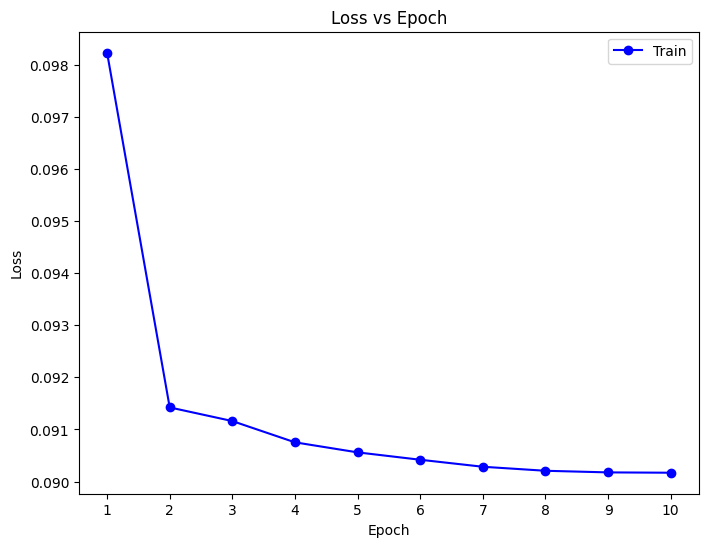

In [ ]:
epoch_list = [epoch+1 for epoch in range(epochs)]
show_learning_curve(train_loss, epoch_list=epoch_list)

#### Reconstrucción de imágenes

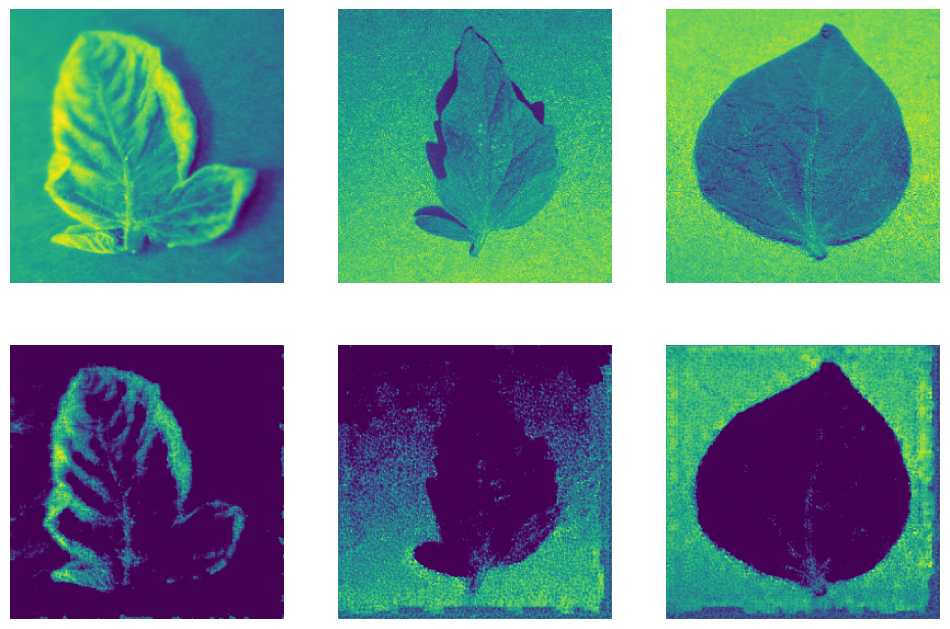

In [ ]:
test_dataloader_1 = DataLoader(
    test_dataset_1, batch_size=batch_size, shuffle=True)

reconstruct_image(autoencoder_model_1, test_dataloader_1, num_samples=3)

## Entrenamiento del Clasificador sin Autoencoder

In [ ]:
classifier_model_1 = Classifier(input_features=250).to(device)

classifier_loss_fn_1 = nn.CrossEntropyLoss()
classifier_optimizer_1 = torch.optim.Adam(classifier_model_1.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader_1 = DataLoader(
    train_dataset_1, batch_size=batch_size, shuffle=True)

classifier_test_dataloader_1 = DataLoader(
    test_dataset_1, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader_1, classifier_model_1, classifier_loss_fn_1, classifier_optimizer_1)
    test_loss = test(classifier_test_dataloader_1, classifier_model_1, classifier_loss_fn_1)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.197369  [   32/ 6654]
Current Loss: 3.096424  [  352/ 6654]
Current Loss: 3.043854  [  672/ 6654]
Current Loss: 3.020635  [  992/ 6654]
Current Loss: 2.993846  [ 1312/ 6654]
Current Loss: 2.972150  [ 1632/ 6654]
Current Loss: 2.945893  [ 1952/ 6654]
Current Loss: 2.941336  [ 2272/ 6654]
Current Loss: 2.944611  [ 2592/ 6654]
Current Loss: 2.936797  [ 2912/ 6654]
Current Loss: 2.925915  [ 3232/ 6654]
Current Loss: 2.909217  [ 3552/ 6654]
Current Loss: 2.902959  [ 3872/ 6654]
Current Loss: 2.896289  [ 4192/ 6654]
Current Loss: 2.886654  [ 4512/ 6654]
Current Loss: 2.879507  [ 4832/ 6654]
Current Loss: 2.872344  [ 5152/ 6654]
Current Loss: 2.862074  [ 5472/ 6654]
Current Loss: 2.853122  [ 5792/ 6654]
Current Loss: 2.847029  [ 6112/ 6654]
Current Loss: 2.838766  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.894419,0.394282,0.894419,0.547300
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.008333,0.003155,0.008333,0.004577
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.776542  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.599881  [  352/ 6654]
Current Loss: 2.555200  [  672/ 6654]
Current Loss: 2.537300  [  992/ 6654]
Current Loss: 2.553008  [ 1312/ 6654]
Current Loss: 2.541539  [ 1632/ 6654]
Current Loss: 2.534245  [ 1952/ 6654]
Current Loss: 2.563536  [ 2272/ 6654]
Current Loss: 2.563472  [ 2592/ 6654]
Current Loss: 2.573683  [ 2912/ 6654]
Current Loss: 2.572608  [ 3232/ 6654]
Current Loss: 2.563800  [ 3552/ 6654]
Current Loss: 2.551385  [ 3872/ 6654]
Current Loss: 2.551321  [ 4192/ 6654]
Current Loss: 2.559530  [ 4512/ 6654]
Current Loss: 2.565544  [ 4832/ 6654]
Current Loss: 2.558114  [ 5152/ 6654]
Current Loss: 2.555397  [ 5472/ 6654]
Current Loss: 2.558742  [ 5792/ 6654]
Current Loss: 2.560923  [ 6112/ 6654]
Current Loss: 2.552535  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.926848,0.380142,0.926848,0.539153
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.019423  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.330203  [  352/ 6654]
Current Loss: 2.360560  [  672/ 6654]
Current Loss: 2.353502  [  992/ 6654]
Current Loss: 2.360365  [ 1312/ 6654]
Current Loss: 2.365786  [ 1632/ 6654]
Current Loss: 2.367190  [ 1952/ 6654]
Current Loss: 2.347864  [ 2272/ 6654]
Current Loss: 2.335025  [ 2592/ 6654]
Current Loss: 2.338607  [ 2912/ 6654]
Current Loss: 2.337749  [ 3232/ 6654]
Current Loss: 2.338610  [ 3552/ 6654]
Current Loss: 2.341118  [ 3872/ 6654]
Current Loss: 2.332491  [ 4192/ 6654]
Current Loss: 2.331972  [ 4512/ 6654]
Current Loss: 2.320458  [ 4832/ 6654]
Current Loss: 2.313785  [ 5152/ 6654]
Current Loss: 2.318013  [ 5472/ 6654]
Current Loss: 2.318477  [ 5792/ 6654]
Current Loss: 2.323298  [ 6112/ 6654]
Current Loss: 2.322525  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.020408,0.333333,0.020408,0.038462
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.326531,0.263736,0.326531,0.291793
4,tomato-diseased,0.874057,0.402431,0.874057,0.551117
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.147759  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.336884  [  352/ 6654]
Current Loss: 2.255348  [  672/ 6654]
Current Loss: 2.225269  [  992/ 6654]
Current Loss: 2.193746  [ 1312/ 6654]
Current Loss: 2.189896  [ 1632/ 6654]
Current Loss: 2.193852  [ 1952/ 6654]
Current Loss: 2.184626  [ 2272/ 6654]
Current Loss: 2.181718  [ 2592/ 6654]
Current Loss: 2.171129  [ 2912/ 6654]
Current Loss: 2.185708  [ 3232/ 6654]
Current Loss: 2.188991  [ 3552/ 6654]
Current Loss: 2.187525  [ 3872/ 6654]
Current Loss: 2.180664  [ 4192/ 6654]
Current Loss: 2.168581  [ 4512/ 6654]
Current Loss: 2.171094  [ 4832/ 6654]
Current Loss: 2.166410  [ 5152/ 6654]
Current Loss: 2.164229  [ 5472/ 6654]
Current Loss: 2.158763  [ 5792/ 6654]
Current Loss: 2.156643  [ 6112/ 6654]
Current Loss: 2.157465  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.034014,0.333333,0.034014,0.061728
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.378685,0.290435,0.378685,0.328740
4,tomato-diseased,0.846154,0.430710,0.846154,0.570847
5,grape-diseased,0.013746,0.117647,0.013746,0.024615
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.683009  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.133607  [  352/ 6654]
Current Loss: 2.043271  [  672/ 6654]
Current Loss: 2.040737  [  992/ 6654]
Current Loss: 2.008463  [ 1312/ 6654]
Current Loss: 2.004673  [ 1632/ 6654]
Current Loss: 2.004745  [ 1952/ 6654]
Current Loss: 2.022703  [ 2272/ 6654]
Current Loss: 2.007565  [ 2592/ 6654]
Current Loss: 2.017702  [ 2912/ 6654]
Current Loss: 2.034875  [ 3232/ 6654]
Current Loss: 2.045921  [ 3552/ 6654]
Current Loss: 2.041902  [ 3872/ 6654]
Current Loss: 2.036142  [ 4192/ 6654]
Current Loss: 2.036115  [ 4512/ 6654]
Current Loss: 2.034102  [ 4832/ 6654]
Current Loss: 2.027058  [ 5152/ 6654]
Current Loss: 2.023175  [ 5472/ 6654]
Current Loss: 2.021915  [ 5792/ 6654]
Current Loss: 2.026121  [ 6112/ 6654]
Current Loss: 2.028328  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.061224,0.281250,0.061224,0.100559
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.217687,0.521739,0.217687,0.307200
4,tomato-diseased,0.893665,0.409326,0.893665,0.561478
5,grape-diseased,0.487972,0.609442,0.487972,0.541985
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.125045  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.871111  [  352/ 6654]
Current Loss: 1.871629  [  672/ 6654]
Current Loss: 1.888161  [  992/ 6654]
Current Loss: 1.908608  [ 1312/ 6654]
Current Loss: 1.927257  [ 1632/ 6654]
Current Loss: 1.932267  [ 1952/ 6654]
Current Loss: 1.942277  [ 2272/ 6654]
Current Loss: 1.984275  [ 2592/ 6654]
Current Loss: 1.975427  [ 2912/ 6654]
Current Loss: 1.968741  [ 3232/ 6654]
Current Loss: 1.966534  [ 3552/ 6654]
Current Loss: 1.952542  [ 3872/ 6654]
Current Loss: 1.940498  [ 4192/ 6654]
Current Loss: 1.940306  [ 4512/ 6654]
Current Loss: 1.936112  [ 4832/ 6654]
Current Loss: 1.938601  [ 5152/ 6654]
Current Loss: 1.930795  [ 5472/ 6654]
Current Loss: 1.936895  [ 5792/ 6654]
Current Loss: 1.932543  [ 6112/ 6654]
Current Loss: 1.926935  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.088435,0.245283,0.088435,0.130000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.575964,0.493204,0.575964,0.531381
4,tomato-diseased,0.785068,0.447165,0.785068,0.569787
5,grape-diseased,0.676976,0.502551,0.676976,0.576867
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.368530  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.752793  [  352/ 6654]
Current Loss: 1.810123  [  672/ 6654]
Current Loss: 1.763047  [  992/ 6654]
Current Loss: 1.779899  [ 1312/ 6654]
Current Loss: 1.808429  [ 1632/ 6654]
Current Loss: 1.810657  [ 1952/ 6654]
Current Loss: 1.813907  [ 2272/ 6654]
Current Loss: 1.829972  [ 2592/ 6654]
Current Loss: 1.832354  [ 2912/ 6654]
Current Loss: 1.837179  [ 3232/ 6654]
Current Loss: 1.823166  [ 3552/ 6654]
Current Loss: 1.820253  [ 3872/ 6654]
Current Loss: 1.827095  [ 4192/ 6654]
Current Loss: 1.824974  [ 4512/ 6654]
Current Loss: 1.830706  [ 4832/ 6654]
Current Loss: 1.842094  [ 5152/ 6654]
Current Loss: 1.840477  [ 5472/ 6654]
Current Loss: 1.837806  [ 5792/ 6654]
Current Loss: 1.840992  [ 6112/ 6654]
Current Loss: 1.840818  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.040816,0.142857,0.040816,0.063492
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.392290,0.537267,0.392290,0.453473
4,tomato-diseased,0.833333,0.442354,0.833333,0.577929
5,grape-diseased,0.697595,0.482185,0.697595,0.570225
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.083799  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.774235  [  352/ 6654]
Current Loss: 1.808039  [  672/ 6654]
Current Loss: 1.792373  [  992/ 6654]
Current Loss: 1.797295  [ 1312/ 6654]
Current Loss: 1.778490  [ 1632/ 6654]
Current Loss: 1.778553  [ 1952/ 6654]
Current Loss: 1.778040  [ 2272/ 6654]
Current Loss: 1.780273  [ 2592/ 6654]
Current Loss: 1.760458  [ 2912/ 6654]
Current Loss: 1.750441  [ 3232/ 6654]
Current Loss: 1.755262  [ 3552/ 6654]
Current Loss: 1.752383  [ 3872/ 6654]
Current Loss: 1.747647  [ 4192/ 6654]
Current Loss: 1.754445  [ 4512/ 6654]
Current Loss: 1.753895  [ 4832/ 6654]
Current Loss: 1.755107  [ 5152/ 6654]
Current Loss: 1.759561  [ 5472/ 6654]
Current Loss: 1.764397  [ 5792/ 6654]
Current Loss: 1.763133  [ 6112/ 6654]
Current Loss: 1.769185  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.047619,0.162791,0.047619,0.073684
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.725624,0.480480,0.725624,0.578139
4,tomato-diseased,0.751131,0.451291,0.751131,0.563827
5,grape-diseased,0.773196,0.433526,0.773196,0.555556
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.526966  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.720672  [  352/ 6654]
Current Loss: 1.703488  [  672/ 6654]
Current Loss: 1.728095  [  992/ 6654]
Current Loss: 1.711921  [ 1312/ 6654]
Current Loss: 1.701569  [ 1632/ 6654]
Current Loss: 1.705779  [ 1952/ 6654]
Current Loss: 1.697091  [ 2272/ 6654]
Current Loss: 1.713001  [ 2592/ 6654]
Current Loss: 1.705374  [ 2912/ 6654]
Current Loss: 1.709927  [ 3232/ 6654]
Current Loss: 1.713253  [ 3552/ 6654]
Current Loss: 1.710193  [ 3872/ 6654]
Current Loss: 1.706512  [ 4192/ 6654]
Current Loss: 1.699463  [ 4512/ 6654]
Current Loss: 1.702479  [ 4832/ 6654]
Current Loss: 1.701645  [ 5152/ 6654]
Current Loss: 1.706265  [ 5472/ 6654]
Current Loss: 1.712783  [ 5792/ 6654]
Current Loss: 1.713717  [ 6112/ 6654]
Current Loss: 1.707927  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.081633,0.193548,0.081633,0.114833
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.582766,0.610451,0.582766,0.596288
4,tomato-diseased,0.806938,0.458637,0.806938,0.584859
5,grape-diseased,0.646048,0.569697,0.646048,0.605475
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.601446  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.610216  [  352/ 6654]
Current Loss: 1.573331  [  672/ 6654]
Current Loss: 1.606468  [  992/ 6654]
Current Loss: 1.633169  [ 1312/ 6654]
Current Loss: 1.639855  [ 1632/ 6654]
Current Loss: 1.626783  [ 1952/ 6654]
Current Loss: 1.632472  [ 2272/ 6654]
Current Loss: 1.650317  [ 2592/ 6654]
Current Loss: 1.656707  [ 2912/ 6654]
Current Loss: 1.667703  [ 3232/ 6654]
Current Loss: 1.663797  [ 3552/ 6654]
Current Loss: 1.671594  [ 3872/ 6654]
Current Loss: 1.685018  [ 4192/ 6654]
Current Loss: 1.693715  [ 4512/ 6654]
Current Loss: 1.696062  [ 4832/ 6654]
Current Loss: 1.685927  [ 5152/ 6654]
Current Loss: 1.684008  [ 5472/ 6654]
Current Loss: 1.685149  [ 5792/ 6654]
Current Loss: 1.690308  [ 6112/ 6654]
Current Loss: 1.688507  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.108844,0.235294,0.108844,0.148837
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.655329,0.580321,0.655329,0.615548
4,tomato-diseased,0.846154,0.450783,0.846154,0.588204
5,grape-diseased,0.467354,0.544000,0.467354,0.502773
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.844569  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.535860  [  352/ 6654]
Current Loss: 1.560982  [  672/ 6654]
Current Loss: 1.564694  [  992/ 6654]
Current Loss: 1.590927  [ 1312/ 6654]
Current Loss: 1.615983  [ 1632/ 6654]
Current Loss: 1.614689  [ 1952/ 6654]
Current Loss: 1.620727  [ 2272/ 6654]
Current Loss: 1.617300  [ 2592/ 6654]
Current Loss: 1.622380  [ 2912/ 6654]
Current Loss: 1.632890  [ 3232/ 6654]
Current Loss: 1.617409  [ 3552/ 6654]
Current Loss: 1.618772  [ 3872/ 6654]
Current Loss: 1.617671  [ 4192/ 6654]
Current Loss: 1.615420  [ 4512/ 6654]
Current Loss: 1.621361  [ 4832/ 6654]
Current Loss: 1.617720  [ 5152/ 6654]
Current Loss: 1.622101  [ 5472/ 6654]
Current Loss: 1.626089  [ 5792/ 6654]
Current Loss: 1.625015  [ 6112/ 6654]
Current Loss: 1.622624  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.120879,0.785714,0.120879,0.209524
1,squash-diseased,0.122449,0.185567,0.122449,0.147541
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.725624,0.552677,0.725624,0.627451
4,tomato-diseased,0.788839,0.470112,0.788839,0.589130
5,grape-diseased,0.642612,0.500000,0.642612,0.562406
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.016949,0.133333,0.016949,0.030075
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.179013  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.409724  [  352/ 6654]
Current Loss: 1.479460  [  672/ 6654]
Current Loss: 1.564582  [  992/ 6654]
Current Loss: 1.563162  [ 1312/ 6654]
Current Loss: 1.583439  [ 1632/ 6654]
Current Loss: 1.566630  [ 1952/ 6654]
Current Loss: 1.571190  [ 2272/ 6654]
Current Loss: 1.580368  [ 2592/ 6654]
Current Loss: 1.577087  [ 2912/ 6654]
Current Loss: 1.588898  [ 3232/ 6654]
Current Loss: 1.581370  [ 3552/ 6654]
Current Loss: 1.585458  [ 3872/ 6654]
Current Loss: 1.586513  [ 4192/ 6654]
Current Loss: 1.582608  [ 4512/ 6654]
Current Loss: 1.582826  [ 4832/ 6654]
Current Loss: 1.578314  [ 5152/ 6654]
Current Loss: 1.579700  [ 5472/ 6654]
Current Loss: 1.579808  [ 5792/ 6654]
Current Loss: 1.582735  [ 6112/ 6654]
Current Loss: 1.579853  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.274725,0.568182,0.274725,0.370370
1,squash-diseased,0.156463,0.214953,0.156463,0.181102
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.741497,0.500766,0.741497,0.597806
4,tomato-diseased,0.806938,0.442881,0.806938,0.571887
5,grape-diseased,0.577320,0.541936,0.577320,0.559068
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.008475,0.142857,0.008475,0.016000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.849115  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.670387  [  352/ 6654]
Current Loss: 1.637421  [  672/ 6654]
Current Loss: 1.567967  [  992/ 6654]
Current Loss: 1.547632  [ 1312/ 6654]
Current Loss: 1.545440  [ 1632/ 6654]
Current Loss: 1.550685  [ 1952/ 6654]
Current Loss: 1.553015  [ 2272/ 6654]
Current Loss: 1.545031  [ 2592/ 6654]
Current Loss: 1.544311  [ 2912/ 6654]
Current Loss: 1.545488  [ 3232/ 6654]
Current Loss: 1.544034  [ 3552/ 6654]
Current Loss: 1.543623  [ 3872/ 6654]
Current Loss: 1.544867  [ 4192/ 6654]
Current Loss: 1.542046  [ 4512/ 6654]
Current Loss: 1.536874  [ 4832/ 6654]
Current Loss: 1.536183  [ 5152/ 6654]
Current Loss: 1.535460  [ 5472/ 6654]
Current Loss: 1.534780  [ 5792/ 6654]
Current Loss: 1.539417  [ 6112/ 6654]
Current Loss: 1.533533  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.241758,0.628571,0.241758,0.349206
1,squash-diseased,0.122449,0.181818,0.122449,0.146341
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.666667,0.609959,0.666667,0.637053
4,tomato-diseased,0.798643,0.455680,0.798643,0.580274
5,grape-diseased,0.632302,0.630137,0.632302,0.631218
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.025424,0.176471,0.025424,0.044444
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.269654  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.347129  [  352/ 6654]
Current Loss: 1.389966  [  672/ 6654]
Current Loss: 1.399856  [  992/ 6654]
Current Loss: 1.426504  [ 1312/ 6654]
Current Loss: 1.423726  [ 1632/ 6654]
Current Loss: 1.427423  [ 1952/ 6654]
Current Loss: 1.432440  [ 2272/ 6654]
Current Loss: 1.439580  [ 2592/ 6654]
Current Loss: 1.454581  [ 2912/ 6654]
Current Loss: 1.457966  [ 3232/ 6654]
Current Loss: 1.472361  [ 3552/ 6654]
Current Loss: 1.480657  [ 3872/ 6654]
Current Loss: 1.479795  [ 4192/ 6654]
Current Loss: 1.473103  [ 4512/ 6654]
Current Loss: 1.482781  [ 4832/ 6654]
Current Loss: 1.486271  [ 5152/ 6654]
Current Loss: 1.482161  [ 5472/ 6654]
Current Loss: 1.480407  [ 5792/ 6654]
Current Loss: 1.481966  [ 6112/ 6654]
Current Loss: 1.479215  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.373626,0.607143,0.373626,0.462585
1,squash-diseased,0.115646,0.128788,0.115646,0.121864
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.675737,0.588933,0.675737,0.629356
4,tomato-diseased,0.784314,0.481259,0.784314,0.596501
5,grape-diseased,0.639175,0.534483,0.639175,0.582160
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.016949,0.090909,0.016949,0.028571
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 0.856099  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.338291  [  352/ 6654]
Current Loss: 1.393241  [  672/ 6654]
Current Loss: 1.438423  [  992/ 6654]
Current Loss: 1.441587  [ 1312/ 6654]
Current Loss: 1.438678  [ 1632/ 6654]
Current Loss: 1.434400  [ 1952/ 6654]
Current Loss: 1.443372  [ 2272/ 6654]
Current Loss: 1.434040  [ 2592/ 6654]
Current Loss: 1.428741  [ 2912/ 6654]
Current Loss: 1.431441  [ 3232/ 6654]
Current Loss: 1.433517  [ 3552/ 6654]
Current Loss: 1.435272  [ 3872/ 6654]
Current Loss: 1.432794  [ 4192/ 6654]
Current Loss: 1.431785  [ 4512/ 6654]
Current Loss: 1.434663  [ 4832/ 6654]
Current Loss: 1.436871  [ 5152/ 6654]
Current Loss: 1.447266  [ 5472/ 6654]
Current Loss: 1.448726  [ 5792/ 6654]
Current Loss: 1.453035  [ 6112/ 6654]
Current Loss: 1.455534  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.395604,0.507042,0.395604,0.444444
1,squash-diseased,0.244898,0.230769,0.244898,0.237624
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.639456,0.615721,0.639456,0.627364
4,tomato-diseased,0.729261,0.490614,0.729261,0.586594
5,grape-diseased,0.635739,0.540936,0.635739,0.584518
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.033898,0.160000,0.033898,0.055944
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 0.995568  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.325058  [  352/ 6654]
Current Loss: 1.374826  [  672/ 6654]
Current Loss: 1.416249  [  992/ 6654]
Current Loss: 1.429307  [ 1312/ 6654]
Current Loss: 1.424121  [ 1632/ 6654]
Current Loss: 1.429643  [ 1952/ 6654]
Current Loss: 1.419841  [ 2272/ 6654]
Current Loss: 1.428517  [ 2592/ 6654]
Current Loss: 1.408675  [ 2912/ 6654]
Current Loss: 1.422772  [ 3232/ 6654]
Current Loss: 1.418749  [ 3552/ 6654]
Current Loss: 1.423130  [ 3872/ 6654]
Current Loss: 1.419602  [ 4192/ 6654]
Current Loss: 1.417007  [ 4512/ 6654]
Current Loss: 1.406064  [ 4832/ 6654]
Current Loss: 1.409161  [ 5152/ 6654]
Current Loss: 1.405470  [ 5472/ 6654]
Current Loss: 1.410218  [ 5792/ 6654]
Current Loss: 1.410479  [ 6112/ 6654]
Current Loss: 1.411484  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.395604,0.679245,0.395604,0.500000
1,squash-diseased,0.108844,0.242424,0.108844,0.150235
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.684807,0.546112,0.684807,0.607646
4,tomato-diseased,0.832579,0.460000,0.832579,0.592593
5,grape-diseased,0.501718,0.666667,0.501718,0.572549
6,blueberry-healthy,0.033333,0.056338,0.033333,0.041885
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.016949,0.080000,0.016949,0.027972
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.590075  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.295207  [  352/ 6654]
Current Loss: 1.334151  [  672/ 6654]
Current Loss: 1.311318  [  992/ 6654]
Current Loss: 1.333765  [ 1312/ 6654]
Current Loss: 1.350105  [ 1632/ 6654]
Current Loss: 1.351828  [ 1952/ 6654]
Current Loss: 1.366835  [ 2272/ 6654]
Current Loss: 1.367730  [ 2592/ 6654]
Current Loss: 1.373166  [ 2912/ 6654]
Current Loss: 1.362080  [ 3232/ 6654]
Current Loss: 1.362355  [ 3552/ 6654]
Current Loss: 1.370003  [ 3872/ 6654]
Current Loss: 1.365656  [ 4192/ 6654]
Current Loss: 1.362187  [ 4512/ 6654]
Current Loss: 1.374868  [ 4832/ 6654]
Current Loss: 1.377777  [ 5152/ 6654]
Current Loss: 1.380205  [ 5472/ 6654]
Current Loss: 1.384406  [ 5792/ 6654]
Current Loss: 1.382592  [ 6112/ 6654]
Current Loss: 1.385190  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.483516,0.448980,0.483516,0.465608
1,squash-diseased,0.204082,0.288462,0.204082,0.239044
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.571429,0.594340,0.571429,0.582659
4,tomato-diseased,0.752640,0.481660,0.752640,0.587404
5,grape-diseased,0.597938,0.614841,0.597938,0.606272
6,blueberry-healthy,0.075000,0.069231,0.075000,0.072000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.025424,0.043478,0.025424,0.032086
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.516097  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.311575  [  352/ 6654]
Current Loss: 1.338535  [  672/ 6654]
Current Loss: 1.354243  [  992/ 6654]
Current Loss: 1.353138  [ 1312/ 6654]
Current Loss: 1.354812  [ 1632/ 6654]
Current Loss: 1.345383  [ 1952/ 6654]
Current Loss: 1.320235  [ 2272/ 6654]
Current Loss: 1.310207  [ 2592/ 6654]
Current Loss: 1.333150  [ 2912/ 6654]
Current Loss: 1.353782  [ 3232/ 6654]
Current Loss: 1.358821  [ 3552/ 6654]
Current Loss: 1.373842  [ 3872/ 6654]
Current Loss: 1.372909  [ 4192/ 6654]
Current Loss: 1.372822  [ 4512/ 6654]
Current Loss: 1.371723  [ 4832/ 6654]
Current Loss: 1.364456  [ 5152/ 6654]
Current Loss: 1.369715  [ 5472/ 6654]
Current Loss: 1.368168  [ 5792/ 6654]
Current Loss: 1.378444  [ 6112/ 6654]
Current Loss: 1.375150  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.494505,0.391304,0.494505,0.436893
1,squash-diseased,0.244898,0.290323,0.244898,0.265683
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.748299,0.496241,0.748299,0.596745
4,tomato-diseased,0.653092,0.515476,0.653092,0.576181
5,grape-diseased,0.670103,0.576923,0.670103,0.620032
6,blueberry-healthy,0.108333,0.213115,0.108333,0.143646
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.067797,0.170213,0.067797,0.096970
9,strawberry-diseased,0.022472,0.060606,0.022472,0.032787


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.046113  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.341271  [  352/ 6654]
Current Loss: 1.318401  [  672/ 6654]
Current Loss: 1.304870  [  992/ 6654]
Current Loss: 1.309040  [ 1312/ 6654]
Current Loss: 1.324923  [ 1632/ 6654]
Current Loss: 1.327481  [ 1952/ 6654]
Current Loss: 1.333589  [ 2272/ 6654]
Current Loss: 1.337502  [ 2592/ 6654]
Current Loss: 1.324570  [ 2912/ 6654]
Current Loss: 1.336082  [ 3232/ 6654]
Current Loss: 1.333070  [ 3552/ 6654]
Current Loss: 1.332061  [ 3872/ 6654]
Current Loss: 1.331870  [ 4192/ 6654]
Current Loss: 1.329824  [ 4512/ 6654]
Current Loss: 1.315283  [ 4832/ 6654]
Current Loss: 1.308417  [ 5152/ 6654]
Current Loss: 1.308453  [ 5472/ 6654]
Current Loss: 1.307585  [ 5792/ 6654]
Current Loss: 1.312778  [ 6112/ 6654]
Current Loss: 1.313416  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.461538,0.567568,0.461538,0.509091
1,squash-diseased,0.129252,0.206522,0.129252,0.158996
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.619048,0.633411,0.619048,0.626147
4,tomato-diseased,0.742081,0.491018,0.742081,0.590991
5,grape-diseased,0.591065,0.595156,0.591065,0.593103
6,blueberry-healthy,0.158333,0.158333,0.158333,0.158333
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.033898,0.076923,0.033898,0.047059
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.577439  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.126853  [  352/ 6654]
Current Loss: 1.168176  [  672/ 6654]
Current Loss: 1.226672  [  992/ 6654]
Current Loss: 1.230057  [ 1312/ 6654]
Current Loss: 1.238125  [ 1632/ 6654]
Current Loss: 1.245925  [ 1952/ 6654]
Current Loss: 1.256749  [ 2272/ 6654]
Current Loss: 1.252684  [ 2592/ 6654]
Current Loss: 1.266801  [ 2912/ 6654]
Current Loss: 1.267169  [ 3232/ 6654]
Current Loss: 1.263557  [ 3552/ 6654]
Current Loss: 1.269889  [ 3872/ 6654]
Current Loss: 1.283763  [ 4192/ 6654]
Current Loss: 1.300794  [ 4512/ 6654]
Current Loss: 1.307744  [ 4832/ 6654]
Current Loss: 1.321319  [ 5152/ 6654]
Current Loss: 1.332734  [ 5472/ 6654]
Current Loss: 1.341924  [ 5792/ 6654]
Current Loss: 1.343202  [ 6112/ 6654]
Current Loss: 1.338832  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.461538,0.545455,0.461538,0.500000
1,squash-diseased,0.258503,0.237500,0.258503,0.247557
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.682540,0.575526,0.682540,0.624481
4,tomato-diseased,0.719457,0.519325,0.719457,0.603225
5,grape-diseased,0.446735,0.714286,0.446735,0.549683
6,blueberry-healthy,0.208333,0.219298,0.208333,0.213675
7,grape-healthy,0.029412,0.142857,0.029412,0.048780
8,pepper-healthy,0.050847,0.142857,0.050847,0.075000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.223374  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.248977  [  352/ 6654]
Current Loss: 1.196823  [  672/ 6654]
Current Loss: 1.212997  [  992/ 6654]
Current Loss: 1.230712  [ 1312/ 6654]
Current Loss: 1.228550  [ 1632/ 6654]
Current Loss: 1.224168  [ 1952/ 6654]
Current Loss: 1.210575  [ 2272/ 6654]
Current Loss: 1.214105  [ 2592/ 6654]
Current Loss: 1.211379  [ 2912/ 6654]
Current Loss: 1.206131  [ 3232/ 6654]
Current Loss: 1.211163  [ 3552/ 6654]
Current Loss: 1.226241  [ 3872/ 6654]
Current Loss: 1.227610  [ 4192/ 6654]
Current Loss: 1.239427  [ 4512/ 6654]
Current Loss: 1.248230  [ 4832/ 6654]
Current Loss: 1.241378  [ 5152/ 6654]
Current Loss: 1.256529  [ 5472/ 6654]
Current Loss: 1.253269  [ 5792/ 6654]
Current Loss: 1.259619  [ 6112/ 6654]
Current Loss: 1.258592  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.428571,0.573529,0.428571,0.490566
1,squash-diseased,0.231293,0.226667,0.231293,0.228956
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.607710,0.572650,0.607710,0.589659
4,tomato-diseased,0.697587,0.513889,0.697587,0.591811
5,grape-diseased,0.467354,0.690355,0.467354,0.557377
6,blueberry-healthy,0.341667,0.212435,0.341667,0.261981
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.127119,0.104895,0.127119,0.114943
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.424105  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.175401  [  352/ 6654]
Current Loss: 1.156601  [  672/ 6654]
Current Loss: 1.148633  [  992/ 6654]
Current Loss: 1.176282  [ 1312/ 6654]
Current Loss: 1.199809  [ 1632/ 6654]
Current Loss: 1.207779  [ 1952/ 6654]
Current Loss: 1.206918  [ 2272/ 6654]
Current Loss: 1.215115  [ 2592/ 6654]
Current Loss: 1.207576  [ 2912/ 6654]
Current Loss: 1.215796  [ 3232/ 6654]
Current Loss: 1.226434  [ 3552/ 6654]
Current Loss: 1.234879  [ 3872/ 6654]
Current Loss: 1.237056  [ 4192/ 6654]
Current Loss: 1.239258  [ 4512/ 6654]
Current Loss: 1.246300  [ 4832/ 6654]
Current Loss: 1.243996  [ 5152/ 6654]
Current Loss: 1.253038  [ 5472/ 6654]
Current Loss: 1.254935  [ 5792/ 6654]
Current Loss: 1.259641  [ 6112/ 6654]
Current Loss: 1.260753  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.472527,0.409524,0.472527,0.438776
1,squash-diseased,0.163265,0.179104,0.163265,0.170819
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.530612,0.587940,0.530612,0.557807
4,tomato-diseased,0.741327,0.487116,0.741327,0.587919
5,grape-diseased,0.618557,0.608108,0.618557,0.613288
6,blueberry-healthy,0.175000,0.233333,0.175000,0.200000
7,grape-healthy,0.029412,0.090909,0.029412,0.044444
8,pepper-healthy,0.050847,0.067416,0.050847,0.057971
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.137129  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.155522  [  352/ 6654]
Current Loss: 1.159637  [  672/ 6654]
Current Loss: 1.162448  [  992/ 6654]
Current Loss: 1.180360  [ 1312/ 6654]
Current Loss: 1.227972  [ 1632/ 6654]
Current Loss: 1.216530  [ 1952/ 6654]
Current Loss: 1.224600  [ 2272/ 6654]
Current Loss: 1.222761  [ 2592/ 6654]
Current Loss: 1.214495  [ 2912/ 6654]
Current Loss: 1.216291  [ 3232/ 6654]
Current Loss: 1.210884  [ 3552/ 6654]
Current Loss: 1.202916  [ 3872/ 6654]
Current Loss: 1.201712  [ 4192/ 6654]
Current Loss: 1.202281  [ 4512/ 6654]
Current Loss: 1.207084  [ 4832/ 6654]
Current Loss: 1.205359  [ 5152/ 6654]
Current Loss: 1.205304  [ 5472/ 6654]
Current Loss: 1.206382  [ 5792/ 6654]
Current Loss: 1.209886  [ 6112/ 6654]
Current Loss: 1.212311  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.450549,0.455556,0.450549,0.453039
1,squash-diseased,0.183673,0.198529,0.183673,0.190813
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.750567,0.484627,0.750567,0.588968
4,tomato-diseased,0.699095,0.525212,0.699095,0.599806
5,grape-diseased,0.546392,0.694323,0.546392,0.611538
6,blueberry-healthy,0.366667,0.221106,0.366667,0.275862
7,grape-healthy,0.058824,0.086957,0.058824,0.070175
8,pepper-healthy,0.050847,0.067416,0.050847,0.057971
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 0.786301  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.120489  [  352/ 6654]
Current Loss: 1.160828  [  672/ 6654]
Current Loss: 1.139686  [  992/ 6654]
Current Loss: 1.156179  [ 1312/ 6654]
Current Loss: 1.153033  [ 1632/ 6654]
Current Loss: 1.165040  [ 1952/ 6654]
Current Loss: 1.174932  [ 2272/ 6654]
Current Loss: 1.180881  [ 2592/ 6654]
Current Loss: 1.175615  [ 2912/ 6654]
Current Loss: 1.175130  [ 3232/ 6654]
Current Loss: 1.184209  [ 3552/ 6654]
Current Loss: 1.185643  [ 3872/ 6654]
Current Loss: 1.188710  [ 4192/ 6654]
Current Loss: 1.192818  [ 4512/ 6654]
Current Loss: 1.180802  [ 4832/ 6654]
Current Loss: 1.182728  [ 5152/ 6654]
Current Loss: 1.181430  [ 5472/ 6654]
Current Loss: 1.187225  [ 5792/ 6654]
Current Loss: 1.183066  [ 6112/ 6654]
Current Loss: 1.184459  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.395604,0.450000,0.395604,0.421053
1,squash-diseased,0.224490,0.336735,0.224490,0.269388
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.687075,0.565298,0.687075,0.620266
4,tomato-diseased,0.723982,0.505529,0.723982,0.595349
5,grape-diseased,0.518900,0.705607,0.518900,0.598020
6,blueberry-healthy,0.225000,0.176471,0.225000,0.197802
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.093220,0.113402,0.093220,0.102326
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.034720  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.230866  [  352/ 6654]
Current Loss: 1.158808  [  672/ 6654]
Current Loss: 1.173771  [  992/ 6654]
Current Loss: 1.188875  [ 1312/ 6654]
Current Loss: 1.174246  [ 1632/ 6654]
Current Loss: 1.166253  [ 1952/ 6654]
Current Loss: 1.157591  [ 2272/ 6654]
Current Loss: 1.165972  [ 2592/ 6654]
Current Loss: 1.169104  [ 2912/ 6654]
Current Loss: 1.152523  [ 3232/ 6654]
Current Loss: 1.159988  [ 3552/ 6654]
Current Loss: 1.159972  [ 3872/ 6654]
Current Loss: 1.154501  [ 4192/ 6654]
Current Loss: 1.162991  [ 4512/ 6654]
Current Loss: 1.160709  [ 4832/ 6654]
Current Loss: 1.155053  [ 5152/ 6654]
Current Loss: 1.156474  [ 5472/ 6654]
Current Loss: 1.156430  [ 5792/ 6654]
Current Loss: 1.160185  [ 6112/ 6654]
Current Loss: 1.160575  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.406593,0.544118,0.406593,0.465409
1,squash-diseased,0.244898,0.230769,0.244898,0.237624
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.766440,0.512121,0.766440,0.613987
4,tomato-diseased,0.671192,0.537115,0.671192,0.596715
5,grape-diseased,0.563574,0.656000,0.563574,0.606285
6,blueberry-healthy,0.333333,0.224719,0.333333,0.268456
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.084746,0.175439,0.084746,0.114286
9,strawberry-diseased,0.011236,0.050000,0.011236,0.018349


Training time: 11.431 minutes


### Evaluación del modelo

#### Curva de entrenamiento

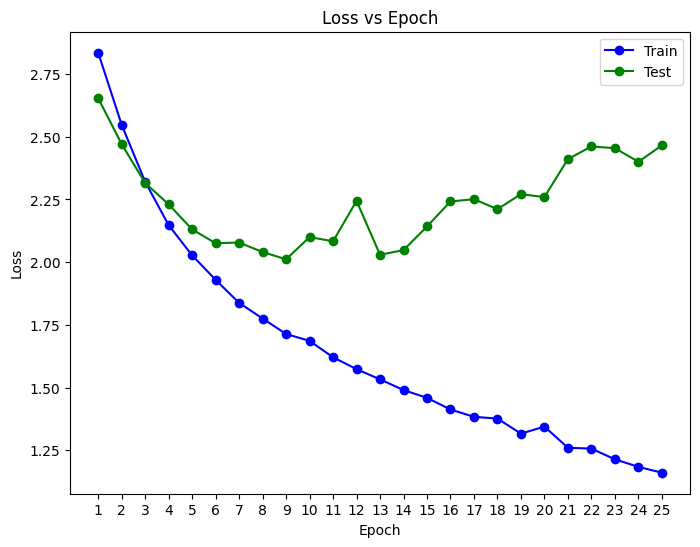

In [ ]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [ ]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.005435,0.000000,0.117647,0.000000,0.005435,0.000000,0.010390,0.000000
2,apple-healthy,0.417160,0.000000,0.031009,0.000000,0.417160,0.000000,0.057728,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.441742,0.894419,0.419686,0.394282,0.441742,0.894419,0.430432,0.547300
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.088235,0.008333,0.016864,0.003155,0.088235,0.008333,0.028317,0.004577
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.009091,0.000000,0.100000,0.000000,0.009091,0.000000,0.016667,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.915493,0.926848,0.377437,0.380142,0.915493,0.926848,0.534508,0.539153
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.005556,0.000000,0.006711,0.000000,0.005556,0.000000,0.006079,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.009091,0.020408,0.200000,0.333333,0.009091,0.020408,0.017391,0.038462
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.158850,0.326531,0.287671,0.263736,0.158850,0.326531,0.204678,0.291793
4,tomato-diseased,0.913984,0.874057,0.395516,0.402431,0.913984,0.874057,0.552112,0.551117
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.040909,0.034014,0.152542,0.333333,0.040909,0.034014,0.064516,0.061728
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.349470,0.378685,0.277644,0.290435,0.349470,0.378685,0.309444,0.328740
4,tomato-diseased,0.881791,0.846154,0.430184,0.430710,0.881791,0.846154,0.578262,0.570847
5,grape-diseased,0.048055,0.013746,0.368421,0.117647,0.048055,0.013746,0.085020,0.024615
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.095455,0.061224,0.187500,0.281250,0.095455,0.061224,0.126506,0.100559
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.384266,0.217687,0.381381,0.521739,0.384266,0.217687,0.382818,0.307200
4,tomato-diseased,0.895372,0.893665,0.448476,0.409326,0.895372,0.893665,0.597616,0.561478
5,grape-diseased,0.405034,0.487972,0.537994,0.609442,0.405034,0.487972,0.462141,0.541985
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.077273,0.088435,0.165049,0.245283,0.077273,0.088435,0.105263,0.130000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.438729,0.575964,0.540037,0.493204,0.438729,0.575964,0.484140,0.531381
4,tomato-diseased,0.888833,0.785068,0.451226,0.447165,0.888833,0.785068,0.598577,0.569787
5,grape-diseased,0.700229,0.676976,0.576271,0.502551,0.700229,0.676976,0.632231,0.576867
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.163636,0.040816,0.244898,0.142857,0.163636,0.040816,0.196185,0.063492
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.550681,0.392290,0.583333,0.537267,0.550681,0.392290,0.566537,0.453473
4,tomato-diseased,0.886821,0.833333,0.477390,0.442354,0.886821,0.833333,0.620665,0.577929
5,grape-diseased,0.782609,0.697595,0.595819,0.482185,0.782609,0.697595,0.676558,0.570225
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.131818,0.047619,0.254386,0.162791,0.131818,0.047619,0.173653,0.073684
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.574887,0.725624,0.589147,0.480480,0.574887,0.725624,0.581930,0.578139
4,tomato-diseased,0.881791,0.751131,0.476747,0.451291,0.881791,0.751131,0.618888,0.563827
5,grape-diseased,0.789474,0.773196,0.622744,0.433526,0.789474,0.773196,0.696266,0.555556
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.168182,0.081633,0.308333,0.193548,0.168182,0.081633,0.217647,0.114833
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.624811,0.582766,0.602920,0.610451,0.624811,0.582766,0.613670,0.596288
4,tomato-diseased,0.881791,0.806938,0.484254,0.458637,0.881791,0.806938,0.625178,0.584859
5,grape-diseased,0.819222,0.646048,0.632509,0.569697,0.819222,0.646048,0.713858,0.605475
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.145455,0.108844,0.240602,0.235294,0.145455,0.108844,0.181303,0.148837
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.674735,0.655329,0.629055,0.580321,0.674735,0.655329,0.651095,0.615548
4,tomato-diseased,0.869215,0.846154,0.493573,0.450783,0.869215,0.846154,0.629623,0.588204
5,grape-diseased,0.832952,0.467354,0.640845,0.544000,0.832952,0.467354,0.724378,0.502773
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.014493,0.120879,0.666667,0.785714,0.014493,0.120879,0.028369,0.209524
1,squash-diseased,0.181818,0.122449,0.360360,0.185567,0.181818,0.122449,0.241692,0.147541
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.692890,0.725624,0.624829,0.552677,0.692890,0.725624,0.657102,0.627451
4,tomato-diseased,0.878270,0.788839,0.497719,0.470112,0.878270,0.788839,0.635371,0.589130
5,grape-diseased,0.869565,0.642612,0.663176,0.500000,0.869565,0.642612,0.752475,0.562406
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.016949,0.000000,0.133333,0.000000,0.016949,0.000000,0.030075
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.166667,0.274725,0.766667,0.568182,0.166667,0.274725,0.273810,0.370370
1,squash-diseased,0.213636,0.156463,0.307190,0.214953,0.213636,0.156463,0.252011,0.181102
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.736762,0.741497,0.639947,0.500766,0.736762,0.741497,0.684951,0.597806
4,tomato-diseased,0.878270,0.806938,0.512474,0.442881,0.878270,0.806938,0.647266,0.571887
5,grape-diseased,0.869565,0.577320,0.667838,0.541936,0.869565,0.577320,0.755467,0.559068
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.005618,0.008475,0.125000,0.142857,0.005618,0.008475,0.010753,0.016000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.304348,0.241758,0.677419,0.628571,0.304348,0.241758,0.420000,0.349206
1,squash-diseased,0.227273,0.122449,0.359712,0.181818,0.227273,0.122449,0.278552,0.146341
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.738275,0.666667,0.632944,0.609959,0.738275,0.666667,0.681564,0.637053
4,tomato-diseased,0.866700,0.798643,0.518976,0.455680,0.866700,0.798643,0.649209,0.580274
5,grape-diseased,0.892448,0.632302,0.711679,0.630137,0.892448,0.632302,0.791878,0.631218
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.011236,0.025424,0.111111,0.176471,0.011236,0.025424,0.020408,0.044444
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.326087,0.373626,0.681818,0.607143,0.326087,0.373626,0.441176,0.462585
1,squash-diseased,0.263636,0.115646,0.397260,0.128788,0.263636,0.115646,0.316940,0.121864
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.776097,0.675737,0.653503,0.588933,0.776097,0.675737,0.709544,0.629356
4,tomato-diseased,0.880785,0.784314,0.544974,0.481259,0.880785,0.784314,0.673332,0.596501
5,grape-diseased,0.876430,0.639175,0.701465,0.534483,0.876430,0.639175,0.779247,0.582160
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.033708,0.016949,0.176471,0.090909,0.033708,0.016949,0.056604,0.028571
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.333333,0.395604,0.686567,0.507042,0.333333,0.395604,0.448780,0.444444
1,squash-diseased,0.363636,0.244898,0.412371,0.230769,0.363636,0.244898,0.386473,0.237624
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.776097,0.639456,0.646910,0.615721,0.776097,0.639456,0.705640,0.627364
4,tomato-diseased,0.869718,0.729261,0.549936,0.490614,0.869718,0.729261,0.673811,0.586594
5,grape-diseased,0.901602,0.635739,0.753346,0.540936,0.901602,0.635739,0.820833,0.584518
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.061798,0.033898,0.229167,0.160000,0.061798,0.033898,0.097345,0.055944
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.434783,0.395604,0.722892,0.679245,0.434783,0.395604,0.542986,0.500000
1,squash-diseased,0.331818,0.108844,0.477124,0.242424,0.331818,0.108844,0.391421,0.150235
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.785174,0.684807,0.664533,0.546112,0.785174,0.684807,0.719834,0.607646
4,tomato-diseased,0.876258,0.832579,0.561573,0.460000,0.876258,0.832579,0.684479,0.592593
5,grape-diseased,0.906178,0.501718,0.761538,0.666667,0.906178,0.501718,0.827586,0.572549
6,blueberry-healthy,0.027778,0.033333,0.185185,0.056338,0.027778,0.033333,0.048309,0.041885
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.050562,0.016949,0.290323,0.080000,0.050562,0.016949,0.086124,0.027972
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.449275,0.483516,0.704545,0.448980,0.449275,0.483516,0.548673,0.465608
1,squash-diseased,0.377273,0.204082,0.451087,0.288462,0.377273,0.204082,0.410891,0.239044
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.801815,0.571429,0.635492,0.594340,0.801815,0.571429,0.709030,0.582659
4,tomato-diseased,0.865191,0.752640,0.578735,0.481660,0.865191,0.752640,0.693548,0.587404
5,grape-diseased,0.897025,0.597938,0.801636,0.614841,0.897025,0.597938,0.846652,0.606272
6,blueberry-healthy,0.116667,0.075000,0.228261,0.069231,0.116667,0.075000,0.154412,0.072000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.106742,0.025424,0.275362,0.043478,0.106742,0.025424,0.153846,0.032086
9,strawberry-diseased,0.022556,0.000000,0.600000,0.000000,0.022556,0.000000,0.043478,0.000000


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.471014,0.494505,0.631068,0.391304,0.471014,0.494505,0.539419,0.436893
1,squash-diseased,0.327273,0.244898,0.431138,0.290323,0.327273,0.244898,0.372093,0.265683
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.801815,0.748299,0.651106,0.496241,0.801815,0.748299,0.718644,0.596745
4,tomato-diseased,0.875252,0.653092,0.598555,0.515476,0.875252,0.653092,0.710930,0.576181
5,grape-diseased,0.890160,0.670103,0.803719,0.576923,0.890160,0.670103,0.844734,0.620032
6,blueberry-healthy,0.150000,0.108333,0.267327,0.213115,0.150000,0.108333,0.192171,0.143646
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.117978,0.067797,0.221053,0.170213,0.117978,0.067797,0.153846,0.096970
9,strawberry-diseased,0.007519,0.022472,0.100000,0.060606,0.007519,0.022472,0.013986,0.032787


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.528986,0.461538,0.646018,0.567568,0.528986,0.461538,0.581673,0.509091
1,squash-diseased,0.372727,0.129252,0.471264,0.206522,0.372727,0.129252,0.416244,0.158996
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.809380,0.619048,0.678074,0.633411,0.809380,0.619048,0.737931,0.626147
4,tomato-diseased,0.870724,0.742081,0.609937,0.491018,0.870724,0.742081,0.717364,0.590991
5,grape-diseased,0.899314,0.591065,0.834395,0.595156,0.899314,0.591065,0.865639,0.593103
6,blueberry-healthy,0.244444,0.158333,0.287582,0.158333,0.244444,0.158333,0.264264,0.158333
7,grape-healthy,0.078431,0.000000,0.444444,0.000000,0.078431,0.000000,0.133333,0.000000
8,pepper-healthy,0.146067,0.033898,0.317073,0.076923,0.146067,0.033898,0.200000,0.047059
9,strawberry-diseased,0.022556,0.000000,0.300000,0.000000,0.022556,0.000000,0.041958,0.000000


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.463768,0.461538,0.653061,0.545455,0.463768,0.461538,0.542373,0.500000
1,squash-diseased,0.354545,0.258503,0.419355,0.237500,0.354545,0.258503,0.384236,0.247557
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.800303,0.682540,0.658780,0.575526,0.800303,0.682540,0.722678,0.624481
4,tomato-diseased,0.861670,0.719457,0.619754,0.519325,0.861670,0.719457,0.720960,0.603225
5,grape-diseased,0.897025,0.446735,0.828753,0.714286,0.897025,0.446735,0.861538,0.549683
6,blueberry-healthy,0.338889,0.208333,0.358824,0.219298,0.338889,0.208333,0.348571,0.213675
7,grape-healthy,0.019608,0.029412,0.200000,0.142857,0.019608,0.029412,0.035714,0.048780
8,pepper-healthy,0.146067,0.050847,0.288889,0.142857,0.146067,0.050847,0.194030,0.075000
9,strawberry-diseased,0.037594,0.000000,0.312500,0.000000,0.037594,0.000000,0.067114,0.000000


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.514493,0.428571,0.710000,0.573529,0.514493,0.428571,0.596639,0.490566
1,squash-diseased,0.463636,0.231293,0.459459,0.226667,0.463636,0.231293,0.461538,0.228956
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.830560,0.607710,0.659856,0.572650,0.830560,0.607710,0.735432,0.589659
4,tomato-diseased,0.867203,0.697587,0.649096,0.513889,0.867203,0.697587,0.742463,0.591811
5,grape-diseased,0.917620,0.467354,0.873638,0.690355,0.917620,0.467354,0.895089,0.557377
6,blueberry-healthy,0.377778,0.341667,0.348718,0.212435,0.377778,0.341667,0.362667,0.261981
7,grape-healthy,0.098039,0.000000,0.625000,0.000000,0.098039,0.000000,0.169492,0.000000
8,pepper-healthy,0.151685,0.127119,0.250000,0.104895,0.151685,0.127119,0.188811,0.114943
9,strawberry-diseased,0.052632,0.000000,0.388889,0.000000,0.052632,0.000000,0.092715,0.000000


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.514493,0.472527,0.689320,0.409524,0.514493,0.472527,0.589212,0.438776
1,squash-diseased,0.477273,0.163265,0.454545,0.179104,0.477273,0.163265,0.465632,0.170819
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.818457,0.530612,0.667901,0.587940,0.818457,0.530612,0.735554,0.557807
4,tomato-diseased,0.865191,0.741327,0.645161,0.487116,0.865191,0.741327,0.739149,0.587919
5,grape-diseased,0.908467,0.618557,0.844681,0.608108,0.908467,0.618557,0.875413,0.613288
6,blueberry-healthy,0.388889,0.175000,0.372340,0.233333,0.388889,0.175000,0.380435,0.200000
7,grape-healthy,0.117647,0.029412,0.461538,0.090909,0.117647,0.029412,0.187500,0.044444
8,pepper-healthy,0.191011,0.050847,0.295652,0.067416,0.191011,0.050847,0.232082,0.057971
9,strawberry-diseased,0.060150,0.000000,0.500000,0.000000,0.060150,0.000000,0.107383,0.000000


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.550725,0.450549,0.697248,0.455556,0.550725,0.450549,0.615385,0.453039
1,squash-diseased,0.440909,0.183673,0.468599,0.198529,0.440909,0.183673,0.454333,0.190813
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.847201,0.750567,0.674699,0.484627,0.847201,0.750567,0.751174,0.588968
4,tomato-diseased,0.864185,0.699095,0.658742,0.525212,0.864185,0.699095,0.747607,0.599806
5,grape-diseased,0.910755,0.546392,0.848614,0.694323,0.910755,0.546392,0.878587,0.611538
6,blueberry-healthy,0.461111,0.366667,0.436842,0.221106,0.461111,0.366667,0.448649,0.275862
7,grape-healthy,0.098039,0.058824,0.357143,0.086957,0.098039,0.058824,0.153846,0.070175
8,pepper-healthy,0.202247,0.050847,0.295082,0.067416,0.202247,0.050847,0.240000,0.057971
9,strawberry-diseased,0.030075,0.000000,0.250000,0.000000,0.030075,0.000000,0.053691,0.000000


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.543478,0.395604,0.773196,0.450000,0.543478,0.395604,0.638298,0.421053
1,squash-diseased,0.509091,0.224490,0.520930,0.336735,0.509091,0.224490,0.514943,0.269388
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.848714,0.687075,0.675090,0.565298,0.848714,0.687075,0.752011,0.620266
4,tomato-diseased,0.872233,0.723982,0.662591,0.505529,0.872233,0.723982,0.753094,0.595349
5,grape-diseased,0.915332,0.518900,0.879121,0.705607,0.915332,0.518900,0.896861,0.598020
6,blueberry-healthy,0.422222,0.225000,0.426966,0.176471,0.422222,0.225000,0.424581,0.197802
7,grape-healthy,0.196078,0.000000,0.500000,0.000000,0.196078,0.000000,0.281690,0.000000
8,pepper-healthy,0.224719,0.093220,0.289855,0.113402,0.224719,0.093220,0.253165,0.102326
9,strawberry-diseased,0.060150,0.000000,0.216216,0.000000,0.060150,0.000000,0.094118,0.000000


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.579710,0.406593,0.701754,0.544118,0.579710,0.406593,0.634921,0.465409
1,squash-diseased,0.472727,0.244898,0.587571,0.230769,0.472727,0.244898,0.523929,0.237624
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.844176,0.766440,0.691450,0.512121,0.844176,0.766440,0.760218,0.613987
4,tomato-diseased,0.883803,0.671192,0.682065,0.537115,0.883803,0.671192,0.769939,0.596715
5,grape-diseased,0.917620,0.563574,0.869848,0.656000,0.917620,0.563574,0.893096,0.606285
6,blueberry-healthy,0.433333,0.333333,0.435754,0.224719,0.433333,0.333333,0.434540,0.268456
7,grape-healthy,0.156863,0.000000,0.571429,0.000000,0.156863,0.000000,0.246154,0.000000
8,pepper-healthy,0.258427,0.084746,0.292994,0.175439,0.258427,0.084746,0.274627,0.114286
9,strawberry-diseased,0.045113,0.011236,0.260870,0.050000,0.045113,0.011236,0.076923,0.018349


#### AUROC

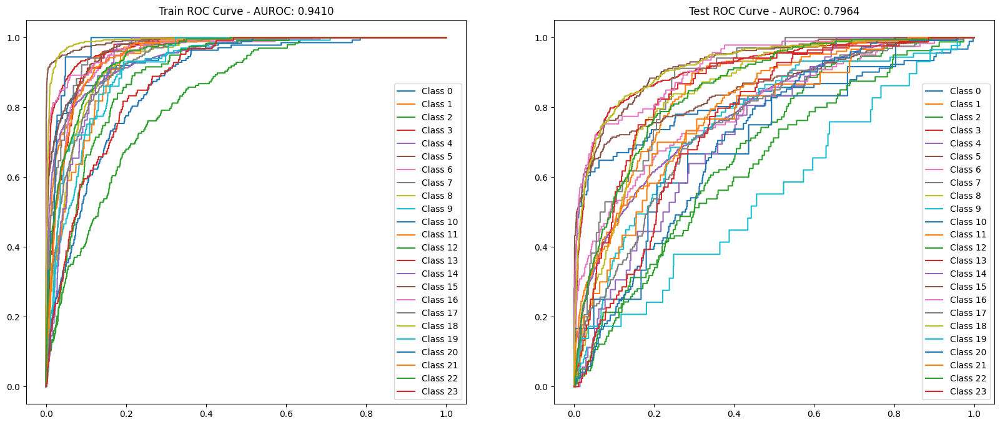

In [ ]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

#### Liberación de memoria

In [ ]:
del classifier_model_1

with torch.no_grad():
    torch.cuda.empty_cache()

## Entrenamiento del Clasificador con Autoencoder congelado

In [ ]:
classifier_model_1 = Classifier(input_features=27, encoder_model=autoencoder_model_1, freeze_weights=True).to(device)

classifier_loss_fn_1 = nn.CrossEntropyLoss()
classifier_optimizer_1 = torch.optim.Adam(classifier_model_1.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader_1 = DataLoader(
    train_dataset_1, batch_size=batch_size, shuffle=True)

classifier_test_dataloader_1 = DataLoader(
    test_dataset_1, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader_1, classifier_model_1, classifier_loss_fn_1, classifier_optimizer_1)
    test_loss = test(classifier_test_dataloader_1, classifier_model_1, classifier_loss_fn_1)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.301592  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.210491  [  352/ 6654]
Current Loss: 3.222278  [  672/ 6654]
Current Loss: 3.221113  [  992/ 6654]
Current Loss: 3.221564  [ 1312/ 6654]
Current Loss: 3.213230  [ 1632/ 6654]
Current Loss: 3.207186  [ 1952/ 6654]
Current Loss: 3.208115  [ 2272/ 6654]
Current Loss: 3.207488  [ 2592/ 6654]
Current Loss: 3.205730  [ 2912/ 6654]
Current Loss: 3.205174  [ 3232/ 6654]
Current Loss: 3.204291  [ 3552/ 6654]
Current Loss: 3.205293  [ 3872/ 6654]
Current Loss: 3.205709  [ 4192/ 6654]
Current Loss: 3.204531  [ 4512/ 6654]
Current Loss: 3.203022  [ 4832/ 6654]
Current Loss: 3.201701  [ 5152/ 6654]
Current Loss: 3.200219  [ 5472/ 6654]
Current Loss: 3.200205  [ 5792/ 6654]
Current Loss: 3.199289  [ 6112/ 6654]
Current Loss: 3.197724  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,1.0,0.099414,1.0,0.180849
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.207410  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.153608  [  352/ 6654]
Current Loss: 3.159806  [  672/ 6654]
Current Loss: 3.157623  [  992/ 6654]
Current Loss: 3.157535  [ 1312/ 6654]
Current Loss: 3.155125  [ 1632/ 6654]
Current Loss: 3.154184  [ 1952/ 6654]
Current Loss: 3.153272  [ 2272/ 6654]
Current Loss: 3.151441  [ 2592/ 6654]
Current Loss: 3.151478  [ 2912/ 6654]
Current Loss: 3.150955  [ 3232/ 6654]
Current Loss: 3.146800  [ 3552/ 6654]
Current Loss: 3.146163  [ 3872/ 6654]
Current Loss: 3.144208  [ 4192/ 6654]
Current Loss: 3.144063  [ 4512/ 6654]
Current Loss: 3.141500  [ 4832/ 6654]
Current Loss: 3.140529  [ 5152/ 6654]
Current Loss: 3.139730  [ 5472/ 6654]
Current Loss: 3.138328  [ 5792/ 6654]
Current Loss: 3.137504  [ 6112/ 6654]
Current Loss: 3.135844  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,1.0,0.099414,1.0,0.180849
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.064010  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.098378  [  352/ 6654]
Current Loss: 3.100311  [  672/ 6654]
Current Loss: 3.097790  [  992/ 6654]
Current Loss: 3.097821  [ 1312/ 6654]
Current Loss: 3.095518  [ 1632/ 6654]
Current Loss: 3.089261  [ 1952/ 6654]
Current Loss: 3.084961  [ 2272/ 6654]
Current Loss: 3.081898  [ 2592/ 6654]
Current Loss: 3.081385  [ 2912/ 6654]
Current Loss: 3.081188  [ 3232/ 6654]
Current Loss: 3.079696  [ 3552/ 6654]
Current Loss: 3.078200  [ 3872/ 6654]
Current Loss: 3.079469  [ 4192/ 6654]
Current Loss: 3.078677  [ 4512/ 6654]
Current Loss: 3.077258  [ 4832/ 6654]
Current Loss: 3.076644  [ 5152/ 6654]
Current Loss: 3.074890  [ 5472/ 6654]
Current Loss: 3.072524  [ 5792/ 6654]
Current Loss: 3.072249  [ 6112/ 6654]
Current Loss: 3.071867  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,1.0,0.099414,1.0,0.180849
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.026417  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.026818  [  352/ 6654]
Current Loss: 3.031956  [  672/ 6654]
Current Loss: 3.030477  [  992/ 6654]
Current Loss: 3.024917  [ 1312/ 6654]
Current Loss: 3.027178  [ 1632/ 6654]
Current Loss: 3.031199  [ 1952/ 6654]
Current Loss: 3.031534  [ 2272/ 6654]
Current Loss: 3.030705  [ 2592/ 6654]
Current Loss: 3.032236  [ 2912/ 6654]
Current Loss: 3.030514  [ 3232/ 6654]
Current Loss: 3.027186  [ 3552/ 6654]
Current Loss: 3.025535  [ 3872/ 6654]
Current Loss: 3.022414  [ 4192/ 6654]
Current Loss: 3.021443  [ 4512/ 6654]
Current Loss: 3.021208  [ 4832/ 6654]
Current Loss: 3.022021  [ 5152/ 6654]
Current Loss: 3.019466  [ 5472/ 6654]
Current Loss: 3.018352  [ 5792/ 6654]
Current Loss: 3.017534  [ 6112/ 6654]
Current Loss: 3.016158  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,1.0,0.099414,1.0,0.180849
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.983543  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.997381  [  352/ 6654]
Current Loss: 2.986581  [  672/ 6654]
Current Loss: 2.993083  [  992/ 6654]
Current Loss: 2.993355  [ 1312/ 6654]
Current Loss: 2.988973  [ 1632/ 6654]
Current Loss: 2.986001  [ 1952/ 6654]
Current Loss: 2.983950  [ 2272/ 6654]
Current Loss: 2.979826  [ 2592/ 6654]
Current Loss: 2.981614  [ 2912/ 6654]
Current Loss: 2.981356  [ 3232/ 6654]
Current Loss: 2.977767  [ 3552/ 6654]
Current Loss: 2.975744  [ 3872/ 6654]
Current Loss: 2.973219  [ 4192/ 6654]
Current Loss: 2.972545  [ 4512/ 6654]
Current Loss: 2.970436  [ 4832/ 6654]
Current Loss: 2.968841  [ 5152/ 6654]
Current Loss: 2.968834  [ 5472/ 6654]
Current Loss: 2.966262  [ 5792/ 6654]
Current Loss: 2.965730  [ 6112/ 6654]
Current Loss: 2.963984  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,1.0,0.099414,1.0,0.180849
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.029443  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.903068  [  352/ 6654]
Current Loss: 2.915855  [  672/ 6654]
Current Loss: 2.920797  [  992/ 6654]
Current Loss: 2.921959  [ 1312/ 6654]
Current Loss: 2.919184  [ 1632/ 6654]
Current Loss: 2.921066  [ 1952/ 6654]
Current Loss: 2.918940  [ 2272/ 6654]
Current Loss: 2.920190  [ 2592/ 6654]
Current Loss: 2.920036  [ 2912/ 6654]
Current Loss: 2.918631  [ 3232/ 6654]
Current Loss: 2.916339  [ 3552/ 6654]
Current Loss: 2.917942  [ 3872/ 6654]
Current Loss: 2.922158  [ 4192/ 6654]
Current Loss: 2.922591  [ 4512/ 6654]
Current Loss: 2.922865  [ 4832/ 6654]
Current Loss: 2.923550  [ 5152/ 6654]
Current Loss: 2.922065  [ 5472/ 6654]
Current Loss: 2.920295  [ 5792/ 6654]
Current Loss: 2.918802  [ 6112/ 6654]
Current Loss: 2.917975  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,1.0,0.099414,1.0,0.180849
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.820289  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.922140  [  352/ 6654]
Current Loss: 2.901798  [  672/ 6654]
Current Loss: 2.894773  [  992/ 6654]
Current Loss: 2.892277  [ 1312/ 6654]
Current Loss: 2.894954  [ 1632/ 6654]
Current Loss: 2.895271  [ 1952/ 6654]
Current Loss: 2.895362  [ 2272/ 6654]
Current Loss: 2.896350  [ 2592/ 6654]
Current Loss: 2.895401  [ 2912/ 6654]
Current Loss: 2.890796  [ 3232/ 6654]
Current Loss: 2.893995  [ 3552/ 6654]
Current Loss: 2.892066  [ 3872/ 6654]
Current Loss: 2.890577  [ 4192/ 6654]
Current Loss: 2.886471  [ 4512/ 6654]
Current Loss: 2.886007  [ 4832/ 6654]
Current Loss: 2.883518  [ 5152/ 6654]
Current Loss: 2.881918  [ 5472/ 6654]
Current Loss: 2.881675  [ 5792/ 6654]
Current Loss: 2.880598  [ 6112/ 6654]
Current Loss: 2.876783  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.948540  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.841898  [  352/ 6654]
Current Loss: 2.859389  [  672/ 6654]
Current Loss: 2.865611  [  992/ 6654]
Current Loss: 2.865484  [ 1312/ 6654]
Current Loss: 2.868535  [ 1632/ 6654]
Current Loss: 2.862781  [ 1952/ 6654]
Current Loss: 2.861856  [ 2272/ 6654]
Current Loss: 2.856907  [ 2592/ 6654]
Current Loss: 2.856682  [ 2912/ 6654]
Current Loss: 2.855563  [ 3232/ 6654]
Current Loss: 2.851122  [ 3552/ 6654]
Current Loss: 2.846142  [ 3872/ 6654]
Current Loss: 2.845026  [ 4192/ 6654]
Current Loss: 2.843321  [ 4512/ 6654]
Current Loss: 2.842736  [ 4832/ 6654]
Current Loss: 2.841881  [ 5152/ 6654]
Current Loss: 2.841237  [ 5472/ 6654]
Current Loss: 2.839447  [ 5792/ 6654]
Current Loss: 2.838667  [ 6112/ 6654]
Current Loss: 2.837426  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.803312  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.831892  [  352/ 6654]
Current Loss: 2.826344  [  672/ 6654]
Current Loss: 2.830807  [  992/ 6654]
Current Loss: 2.833485  [ 1312/ 6654]
Current Loss: 2.825843  [ 1632/ 6654]
Current Loss: 2.822829  [ 1952/ 6654]
Current Loss: 2.818382  [ 2272/ 6654]
Current Loss: 2.821155  [ 2592/ 6654]
Current Loss: 2.825381  [ 2912/ 6654]
Current Loss: 2.824224  [ 3232/ 6654]
Current Loss: 2.823096  [ 3552/ 6654]
Current Loss: 2.820750  [ 3872/ 6654]
Current Loss: 2.818359  [ 4192/ 6654]
Current Loss: 2.816352  [ 4512/ 6654]
Current Loss: 2.815145  [ 4832/ 6654]
Current Loss: 2.814038  [ 5152/ 6654]
Current Loss: 2.811734  [ 5472/ 6654]
Current Loss: 2.808025  [ 5792/ 6654]
Current Loss: 2.806933  [ 6112/ 6654]
Current Loss: 2.805493  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.700984  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.855734  [  352/ 6654]
Current Loss: 2.838070  [  672/ 6654]
Current Loss: 2.830678  [  992/ 6654]
Current Loss: 2.825453  [ 1312/ 6654]
Current Loss: 2.816699  [ 1632/ 6654]
Current Loss: 2.794814  [ 1952/ 6654]
Current Loss: 2.789223  [ 2272/ 6654]
Current Loss: 2.794893  [ 2592/ 6654]
Current Loss: 2.787849  [ 2912/ 6654]
Current Loss: 2.782172  [ 3232/ 6654]
Current Loss: 2.780760  [ 3552/ 6654]
Current Loss: 2.780950  [ 3872/ 6654]
Current Loss: 2.780371  [ 4192/ 6654]
Current Loss: 2.777384  [ 4512/ 6654]
Current Loss: 2.771874  [ 4832/ 6654]
Current Loss: 2.772047  [ 5152/ 6654]
Current Loss: 2.772243  [ 5472/ 6654]
Current Loss: 2.772329  [ 5792/ 6654]
Current Loss: 2.774319  [ 6112/ 6654]
Current Loss: 2.775353  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.639474  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.784177  [  352/ 6654]
Current Loss: 2.780074  [  672/ 6654]
Current Loss: 2.767751  [  992/ 6654]
Current Loss: 2.780400  [ 1312/ 6654]
Current Loss: 2.780276  [ 1632/ 6654]
Current Loss: 2.778597  [ 1952/ 6654]
Current Loss: 2.777763  [ 2272/ 6654]
Current Loss: 2.770912  [ 2592/ 6654]
Current Loss: 2.761815  [ 2912/ 6654]
Current Loss: 2.758401  [ 3232/ 6654]
Current Loss: 2.760842  [ 3552/ 6654]
Current Loss: 2.759048  [ 3872/ 6654]
Current Loss: 2.757502  [ 4192/ 6654]
Current Loss: 2.753167  [ 4512/ 6654]
Current Loss: 2.750698  [ 4832/ 6654]
Current Loss: 2.752712  [ 5152/ 6654]
Current Loss: 2.752503  [ 5472/ 6654]
Current Loss: 2.752655  [ 5792/ 6654]
Current Loss: 2.749872  [ 6112/ 6654]
Current Loss: 2.752392  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.641114  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.754838  [  352/ 6654]
Current Loss: 2.756032  [  672/ 6654]
Current Loss: 2.750141  [  992/ 6654]
Current Loss: 2.753184  [ 1312/ 6654]
Current Loss: 2.755793  [ 1632/ 6654]
Current Loss: 2.760008  [ 1952/ 6654]
Current Loss: 2.755647  [ 2272/ 6654]
Current Loss: 2.750721  [ 2592/ 6654]
Current Loss: 2.745954  [ 2912/ 6654]
Current Loss: 2.744021  [ 3232/ 6654]
Current Loss: 2.739889  [ 3552/ 6654]
Current Loss: 2.735445  [ 3872/ 6654]
Current Loss: 2.731027  [ 4192/ 6654]
Current Loss: 2.727574  [ 4512/ 6654]
Current Loss: 2.732067  [ 4832/ 6654]
Current Loss: 2.730112  [ 5152/ 6654]
Current Loss: 2.728844  [ 5472/ 6654]
Current Loss: 2.730460  [ 5792/ 6654]
Current Loss: 2.729570  [ 6112/ 6654]
Current Loss: 2.728869  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.683710  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.738604  [  352/ 6654]
Current Loss: 2.703937  [  672/ 6654]
Current Loss: 2.726151  [  992/ 6654]
Current Loss: 2.729858  [ 1312/ 6654]
Current Loss: 2.716364  [ 1632/ 6654]
Current Loss: 2.716340  [ 1952/ 6654]
Current Loss: 2.716953  [ 2272/ 6654]
Current Loss: 2.708840  [ 2592/ 6654]
Current Loss: 2.711087  [ 2912/ 6654]
Current Loss: 2.714160  [ 3232/ 6654]
Current Loss: 2.710350  [ 3552/ 6654]
Current Loss: 2.711653  [ 3872/ 6654]
Current Loss: 2.710477  [ 4192/ 6654]
Current Loss: 2.710544  [ 4512/ 6654]
Current Loss: 2.713541  [ 4832/ 6654]
Current Loss: 2.713318  [ 5152/ 6654]
Current Loss: 2.712659  [ 5472/ 6654]
Current Loss: 2.711842  [ 5792/ 6654]
Current Loss: 2.709389  [ 6112/ 6654]
Current Loss: 2.708316  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.694232  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.685024  [  352/ 6654]
Current Loss: 2.704262  [  672/ 6654]
Current Loss: 2.700506  [  992/ 6654]
Current Loss: 2.687024  [ 1312/ 6654]
Current Loss: 2.685152  [ 1632/ 6654]
Current Loss: 2.687251  [ 1952/ 6654]
Current Loss: 2.687431  [ 2272/ 6654]
Current Loss: 2.680114  [ 2592/ 6654]
Current Loss: 2.680357  [ 2912/ 6654]
Current Loss: 2.686464  [ 3232/ 6654]
Current Loss: 2.689197  [ 3552/ 6654]
Current Loss: 2.687095  [ 3872/ 6654]
Current Loss: 2.690703  [ 4192/ 6654]
Current Loss: 2.692857  [ 4512/ 6654]
Current Loss: 2.688688  [ 4832/ 6654]
Current Loss: 2.690238  [ 5152/ 6654]
Current Loss: 2.696126  [ 5472/ 6654]
Current Loss: 2.691627  [ 5792/ 6654]
Current Loss: 2.691278  [ 6112/ 6654]
Current Loss: 2.691190  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.709691  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.705940  [  352/ 6654]
Current Loss: 2.705953  [  672/ 6654]
Current Loss: 2.694874  [  992/ 6654]
Current Loss: 2.685662  [ 1312/ 6654]
Current Loss: 2.679474  [ 1632/ 6654]
Current Loss: 2.678129  [ 1952/ 6654]
Current Loss: 2.684300  [ 2272/ 6654]
Current Loss: 2.683226  [ 2592/ 6654]
Current Loss: 2.686085  [ 2912/ 6654]
Current Loss: 2.685184  [ 3232/ 6654]
Current Loss: 2.682630  [ 3552/ 6654]
Current Loss: 2.680110  [ 3872/ 6654]
Current Loss: 2.681475  [ 4192/ 6654]
Current Loss: 2.686196  [ 4512/ 6654]
Current Loss: 2.682992  [ 4832/ 6654]
Current Loss: 2.682456  [ 5152/ 6654]
Current Loss: 2.683820  [ 5472/ 6654]
Current Loss: 2.676723  [ 5792/ 6654]
Current Loss: 2.679465  [ 6112/ 6654]
Current Loss: 2.676668  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.643051  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.693670  [  352/ 6654]
Current Loss: 2.687478  [  672/ 6654]
Current Loss: 2.662117  [  992/ 6654]
Current Loss: 2.670871  [ 1312/ 6654]
Current Loss: 2.659883  [ 1632/ 6654]
Current Loss: 2.668953  [ 1952/ 6654]
Current Loss: 2.670665  [ 2272/ 6654]
Current Loss: 2.672370  [ 2592/ 6654]
Current Loss: 2.669413  [ 2912/ 6654]
Current Loss: 2.669353  [ 3232/ 6654]
Current Loss: 2.666897  [ 3552/ 6654]
Current Loss: 2.665659  [ 3872/ 6654]
Current Loss: 2.669636  [ 4192/ 6654]
Current Loss: 2.673450  [ 4512/ 6654]
Current Loss: 2.676317  [ 4832/ 6654]
Current Loss: 2.675200  [ 5152/ 6654]
Current Loss: 2.675467  [ 5472/ 6654]
Current Loss: 2.671958  [ 5792/ 6654]
Current Loss: 2.667381  [ 6112/ 6654]
Current Loss: 2.665615  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.761632  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.754062  [  352/ 6654]
Current Loss: 2.679090  [  672/ 6654]
Current Loss: 2.695517  [  992/ 6654]
Current Loss: 2.684813  [ 1312/ 6654]
Current Loss: 2.691108  [ 1632/ 6654]
Current Loss: 2.682186  [ 1952/ 6654]
Current Loss: 2.684891  [ 2272/ 6654]
Current Loss: 2.685150  [ 2592/ 6654]
Current Loss: 2.684324  [ 2912/ 6654]
Current Loss: 2.679789  [ 3232/ 6654]
Current Loss: 2.673453  [ 3552/ 6654]
Current Loss: 2.674737  [ 3872/ 6654]
Current Loss: 2.669384  [ 4192/ 6654]
Current Loss: 2.667227  [ 4512/ 6654]
Current Loss: 2.665114  [ 4832/ 6654]
Current Loss: 2.664366  [ 5152/ 6654]
Current Loss: 2.661862  [ 5472/ 6654]
Current Loss: 2.658863  [ 5792/ 6654]
Current Loss: 2.658880  [ 6112/ 6654]
Current Loss: 2.659209  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.722794  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.609141  [  352/ 6654]
Current Loss: 2.638937  [  672/ 6654]
Current Loss: 2.649647  [  992/ 6654]
Current Loss: 2.647562  [ 1312/ 6654]
Current Loss: 2.656290  [ 1632/ 6654]
Current Loss: 2.651823  [ 1952/ 6654]
Current Loss: 2.662668  [ 2272/ 6654]
Current Loss: 2.662387  [ 2592/ 6654]
Current Loss: 2.662873  [ 2912/ 6654]
Current Loss: 2.656645  [ 3232/ 6654]
Current Loss: 2.650080  [ 3552/ 6654]
Current Loss: 2.649832  [ 3872/ 6654]
Current Loss: 2.649013  [ 4192/ 6654]
Current Loss: 2.642461  [ 4512/ 6654]
Current Loss: 2.646965  [ 4832/ 6654]
Current Loss: 2.651993  [ 5152/ 6654]
Current Loss: 2.650344  [ 5472/ 6654]
Current Loss: 2.646194  [ 5792/ 6654]
Current Loss: 2.651246  [ 6112/ 6654]
Current Loss: 2.652041  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.459731  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.644199  [  352/ 6654]
Current Loss: 2.616236  [  672/ 6654]
Current Loss: 2.623111  [  992/ 6654]
Current Loss: 2.624562  [ 1312/ 6654]
Current Loss: 2.621291  [ 1632/ 6654]
Current Loss: 2.633783  [ 1952/ 6654]
Current Loss: 2.644388  [ 2272/ 6654]
Current Loss: 2.646241  [ 2592/ 6654]
Current Loss: 2.643185  [ 2912/ 6654]
Current Loss: 2.635717  [ 3232/ 6654]
Current Loss: 2.635887  [ 3552/ 6654]
Current Loss: 2.636632  [ 3872/ 6654]
Current Loss: 2.631851  [ 4192/ 6654]
Current Loss: 2.632881  [ 4512/ 6654]
Current Loss: 2.631572  [ 4832/ 6654]
Current Loss: 2.631928  [ 5152/ 6654]
Current Loss: 2.634159  [ 5472/ 6654]
Current Loss: 2.636935  [ 5792/ 6654]
Current Loss: 2.639541  [ 6112/ 6654]
Current Loss: 2.643139  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.671843  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.640151  [  352/ 6654]
Current Loss: 2.700491  [  672/ 6654]
Current Loss: 2.672624  [  992/ 6654]
Current Loss: 2.651337  [ 1312/ 6654]
Current Loss: 2.646130  [ 1632/ 6654]
Current Loss: 2.642477  [ 1952/ 6654]
Current Loss: 2.645790  [ 2272/ 6654]
Current Loss: 2.653988  [ 2592/ 6654]
Current Loss: 2.659709  [ 2912/ 6654]
Current Loss: 2.652573  [ 3232/ 6654]
Current Loss: 2.646371  [ 3552/ 6654]
Current Loss: 2.642076  [ 3872/ 6654]
Current Loss: 2.639453  [ 4192/ 6654]
Current Loss: 2.631567  [ 4512/ 6654]
Current Loss: 2.634924  [ 4832/ 6654]
Current Loss: 2.633007  [ 5152/ 6654]
Current Loss: 2.634410  [ 5472/ 6654]
Current Loss: 2.638209  [ 5792/ 6654]
Current Loss: 2.636481  [ 6112/ 6654]
Current Loss: 2.639121  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.643217  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.622230  [  352/ 6654]
Current Loss: 2.643045  [  672/ 6654]
Current Loss: 2.625291  [  992/ 6654]
Current Loss: 2.642865  [ 1312/ 6654]
Current Loss: 2.649884  [ 1632/ 6654]
Current Loss: 2.647072  [ 1952/ 6654]
Current Loss: 2.649866  [ 2272/ 6654]
Current Loss: 2.656724  [ 2592/ 6654]
Current Loss: 2.653383  [ 2912/ 6654]
Current Loss: 2.651393  [ 3232/ 6654]
Current Loss: 2.647226  [ 3552/ 6654]
Current Loss: 2.654340  [ 3872/ 6654]
Current Loss: 2.652909  [ 4192/ 6654]
Current Loss: 2.649371  [ 4512/ 6654]
Current Loss: 2.640555  [ 4832/ 6654]
Current Loss: 2.633142  [ 5152/ 6654]
Current Loss: 2.631273  [ 5472/ 6654]
Current Loss: 2.632300  [ 5792/ 6654]
Current Loss: 2.635357  [ 6112/ 6654]
Current Loss: 2.634087  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.691269  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.599490  [  352/ 6654]
Current Loss: 2.624169  [  672/ 6654]
Current Loss: 2.620787  [  992/ 6654]
Current Loss: 2.619975  [ 1312/ 6654]
Current Loss: 2.635397  [ 1632/ 6654]
Current Loss: 2.645578  [ 1952/ 6654]
Current Loss: 2.660411  [ 2272/ 6654]
Current Loss: 2.659610  [ 2592/ 6654]
Current Loss: 2.658571  [ 2912/ 6654]
Current Loss: 2.658860  [ 3232/ 6654]
Current Loss: 2.656622  [ 3552/ 6654]
Current Loss: 2.645555  [ 3872/ 6654]
Current Loss: 2.646209  [ 4192/ 6654]
Current Loss: 2.639140  [ 4512/ 6654]
Current Loss: 2.640857  [ 4832/ 6654]
Current Loss: 2.642470  [ 5152/ 6654]
Current Loss: 2.636825  [ 5472/ 6654]
Current Loss: 2.636144  [ 5792/ 6654]
Current Loss: 2.633405  [ 6112/ 6654]
Current Loss: 2.631237  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.732695  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.621302  [  352/ 6654]
Current Loss: 2.605814  [  672/ 6654]
Current Loss: 2.597416  [  992/ 6654]
Current Loss: 2.605196  [ 1312/ 6654]
Current Loss: 2.606458  [ 1632/ 6654]
Current Loss: 2.610015  [ 1952/ 6654]
Current Loss: 2.621296  [ 2272/ 6654]
Current Loss: 2.615412  [ 2592/ 6654]
Current Loss: 2.626689  [ 2912/ 6654]
Current Loss: 2.628777  [ 3232/ 6654]
Current Loss: 2.627919  [ 3552/ 6654]
Current Loss: 2.632627  [ 3872/ 6654]
Current Loss: 2.635901  [ 4192/ 6654]
Current Loss: 2.634677  [ 4512/ 6654]
Current Loss: 2.635765  [ 4832/ 6654]
Current Loss: 2.630598  [ 5152/ 6654]
Current Loss: 2.627039  [ 5472/ 6654]
Current Loss: 2.625833  [ 5792/ 6654]
Current Loss: 2.628421  [ 6112/ 6654]
Current Loss: 2.624513  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.439315  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.643086  [  352/ 6654]
Current Loss: 2.616889  [  672/ 6654]
Current Loss: 2.616646  [  992/ 6654]
Current Loss: 2.609836  [ 1312/ 6654]
Current Loss: 2.605713  [ 1632/ 6654]
Current Loss: 2.608183  [ 1952/ 6654]
Current Loss: 2.624119  [ 2272/ 6654]
Current Loss: 2.631943  [ 2592/ 6654]
Current Loss: 2.629075  [ 2912/ 6654]
Current Loss: 2.631374  [ 3232/ 6654]
Current Loss: 2.629096  [ 3552/ 6654]
Current Loss: 2.627096  [ 3872/ 6654]
Current Loss: 2.632370  [ 4192/ 6654]
Current Loss: 2.626716  [ 4512/ 6654]
Current Loss: 2.633264  [ 4832/ 6654]
Current Loss: 2.626999  [ 5152/ 6654]
Current Loss: 2.626045  [ 5472/ 6654]
Current Loss: 2.623305  [ 5792/ 6654]
Current Loss: 2.623781  [ 6112/ 6654]
Current Loss: 2.626427  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.410522  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.546051  [  352/ 6654]
Current Loss: 2.606314  [  672/ 6654]
Current Loss: 2.625328  [  992/ 6654]
Current Loss: 2.636849  [ 1312/ 6654]
Current Loss: 2.646717  [ 1632/ 6654]
Current Loss: 2.651738  [ 1952/ 6654]
Current Loss: 2.642673  [ 2272/ 6654]
Current Loss: 2.635890  [ 2592/ 6654]
Current Loss: 2.630366  [ 2912/ 6654]
Current Loss: 2.636469  [ 3232/ 6654]
Current Loss: 2.635202  [ 3552/ 6654]
Current Loss: 2.635931  [ 3872/ 6654]
Current Loss: 2.638433  [ 4192/ 6654]
Current Loss: 2.630379  [ 4512/ 6654]
Current Loss: 2.628888  [ 4832/ 6654]
Current Loss: 2.622660  [ 5152/ 6654]
Current Loss: 2.620988  [ 5472/ 6654]
Current Loss: 2.622433  [ 5792/ 6654]
Current Loss: 2.623397  [ 6112/ 6654]
Current Loss: 2.624123  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


Training time: 13.239 minutes


### Evaluación del modelo

#### Curva de entrenamiento

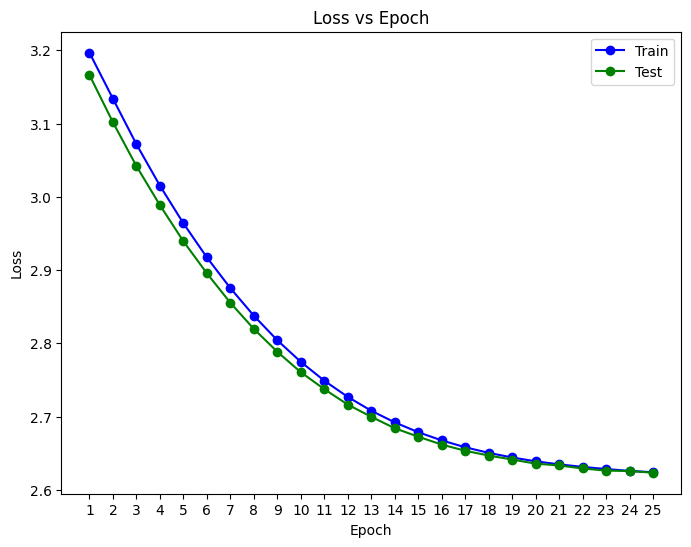

In [ ]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [ ]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,squash-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
2,apple-healthy,0.076142,0.0,0.033784,0.000000,0.076142,0.0,0.046802,0.000000
3,orange-diseased,0.108926,1.0,0.083527,0.099414,0.108926,1.0,0.094550,0.180849
4,tomato-diseased,0.003521,0.0,0.241379,0.000000,0.003521,0.0,0.006941,0.000000
5,grape-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
6,blueberry-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
7,grape-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
8,pepper-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
9,strawberry-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,1.0,1.0,0.099339,0.099414,1.0,1.0,0.180725,0.180849
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,1.0,1.0,0.099339,0.099414,1.0,1.0,0.180725,0.180849
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,1.0,1.0,0.099339,0.099414,1.0,1.0,0.180725,0.180849
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,1.0,1.0,0.099339,0.099414,1.0,1.0,0.180725,0.180849
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,1.0,1.0,0.099339,0.099414,1.0,1.0,0.180725,0.180849
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,squash-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
2,apple-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
3,orange-diseased,0.423601,0.0,0.099432,0.000000,0.423601,0.0,0.161058,0.000000
4,tomato-diseased,0.582495,1.0,0.301720,0.298918,0.582495,1.0,0.397528,0.460257
5,grape-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
6,blueberry-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
7,grape-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
8,pepper-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
9,strawberry-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


#### AUROC

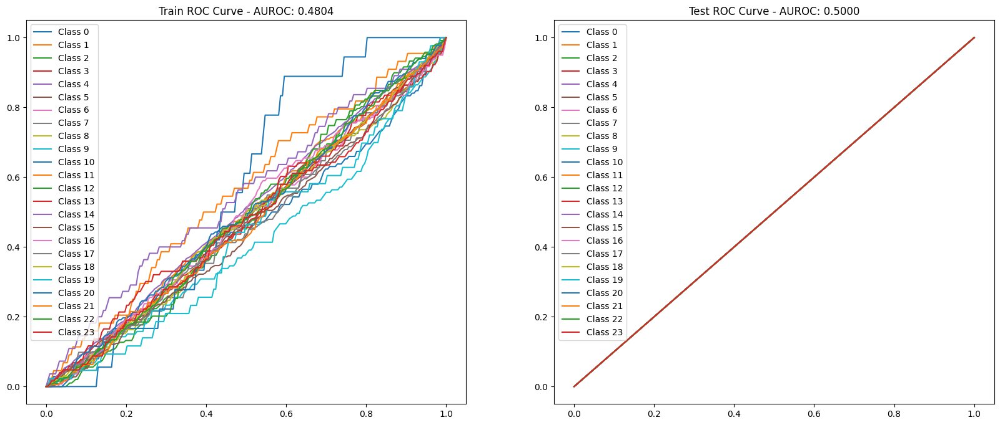

In [ ]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

#### Liberación de memoria

In [ ]:
del classifier_model_1

with torch.no_grad():
    torch.cuda.empty_cache()

## Entrenamiento del Clasificador con Autoencoder sin congelar

In [ ]:
classifier_model_1 = Classifier(input_features=27, encoder_model=autoencoder_model_1, freeze_weights=False).to(device)

classifier_loss_fn_1 = nn.CrossEntropyLoss()
classifier_optimizer_1 = torch.optim.Adam(classifier_model_1.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader_1 = DataLoader(
    train_dataset_1, batch_size=batch_size, shuffle=True)

classifier_test_dataloader_1 = DataLoader(
    test_dataset_1, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader_1, classifier_model_1, classifier_loss_fn_1, classifier_optimizer_1)
    test_loss = test(classifier_test_dataloader_1, classifier_model_1, classifier_loss_fn_1)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.277586  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.096204  [  352/ 6654]
Current Loss: 3.072495  [  672/ 6654]
Current Loss: 3.078224  [  992/ 6654]
Current Loss: 3.072095  [ 1312/ 6654]
Current Loss: 3.068550  [ 1632/ 6654]
Current Loss: 3.061179  [ 1952/ 6654]
Current Loss: 3.048747  [ 2272/ 6654]
Current Loss: 3.041793  [ 2592/ 6654]
Current Loss: 3.030185  [ 2912/ 6654]
Current Loss: 3.015383  [ 3232/ 6654]
Current Loss: 3.005128  [ 3552/ 6654]
Current Loss: 3.004196  [ 3872/ 6654]
Current Loss: 2.999100  [ 4192/ 6654]
Current Loss: 2.989281  [ 4512/ 6654]
Current Loss: 2.979777  [ 4832/ 6654]
Current Loss: 2.974796  [ 5152/ 6654]
Current Loss: 2.965480  [ 5472/ 6654]
Current Loss: 2.959653  [ 5792/ 6654]
Current Loss: 2.952234  [ 6112/ 6654]
Current Loss: 2.944086  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.850487  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.742298  [  352/ 6654]
Current Loss: 2.732662  [  672/ 6654]
Current Loss: 2.747588  [  992/ 6654]
Current Loss: 2.726791  [ 1312/ 6654]
Current Loss: 2.708543  [ 1632/ 6654]
Current Loss: 2.702795  [ 1952/ 6654]
Current Loss: 2.692649  [ 2272/ 6654]
Current Loss: 2.681659  [ 2592/ 6654]
Current Loss: 2.678006  [ 2912/ 6654]
Current Loss: 2.670882  [ 3232/ 6654]
Current Loss: 2.665150  [ 3552/ 6654]
Current Loss: 2.660506  [ 3872/ 6654]
Current Loss: 2.653818  [ 4192/ 6654]
Current Loss: 2.647391  [ 4512/ 6654]
Current Loss: 2.644663  [ 4832/ 6654]
Current Loss: 2.644638  [ 5152/ 6654]
Current Loss: 2.639776  [ 5472/ 6654]
Current Loss: 2.636927  [ 5792/ 6654]
Current Loss: 2.626812  [ 6112/ 6654]
Current Loss: 2.617995  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.953243,0.349654,0.953243,0.511637
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.511914  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.439192  [  352/ 6654]
Current Loss: 2.482191  [  672/ 6654]
Current Loss: 2.481437  [  992/ 6654]
Current Loss: 2.465939  [ 1312/ 6654]
Current Loss: 2.432414  [ 1632/ 6654]
Current Loss: 2.440172  [ 1952/ 6654]
Current Loss: 2.440885  [ 2272/ 6654]
Current Loss: 2.428874  [ 2592/ 6654]
Current Loss: 2.417920  [ 2912/ 6654]
Current Loss: 2.414671  [ 3232/ 6654]
Current Loss: 2.406524  [ 3552/ 6654]
Current Loss: 2.410768  [ 3872/ 6654]
Current Loss: 2.409403  [ 4192/ 6654]
Current Loss: 2.406570  [ 4512/ 6654]
Current Loss: 2.404960  [ 4832/ 6654]
Current Loss: 2.396337  [ 5152/ 6654]
Current Loss: 2.404738  [ 5472/ 6654]
Current Loss: 2.402743  [ 5792/ 6654]
Current Loss: 2.405544  [ 6112/ 6654]
Current Loss: 2.405745  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.953243,0.355956,0.953243,0.518351
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.655447  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.352473  [  352/ 6654]
Current Loss: 2.352390  [  672/ 6654]
Current Loss: 2.370214  [  992/ 6654]
Current Loss: 2.335664  [ 1312/ 6654]
Current Loss: 2.333052  [ 1632/ 6654]
Current Loss: 2.330793  [ 1952/ 6654]
Current Loss: 2.335029  [ 2272/ 6654]
Current Loss: 2.335406  [ 2592/ 6654]
Current Loss: 2.336878  [ 2912/ 6654]
Current Loss: 2.338442  [ 3232/ 6654]
Current Loss: 2.325373  [ 3552/ 6654]
Current Loss: 2.318020  [ 3872/ 6654]
Current Loss: 2.314525  [ 4192/ 6654]
Current Loss: 2.317680  [ 4512/ 6654]
Current Loss: 2.321871  [ 4832/ 6654]
Current Loss: 2.316051  [ 5152/ 6654]
Current Loss: 2.314436  [ 5472/ 6654]
Current Loss: 2.306127  [ 5792/ 6654]
Current Loss: 2.307366  [ 6112/ 6654]
Current Loss: 2.308720  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.938160,0.375831,0.938160,0.536670
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.115785  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.160232  [  352/ 6654]
Current Loss: 2.259215  [  672/ 6654]
Current Loss: 2.250554  [  992/ 6654]
Current Loss: 2.245342  [ 1312/ 6654]
Current Loss: 2.254192  [ 1632/ 6654]
Current Loss: 2.272773  [ 1952/ 6654]
Current Loss: 2.267230  [ 2272/ 6654]
Current Loss: 2.264545  [ 2592/ 6654]
Current Loss: 2.253148  [ 2912/ 6654]
Current Loss: 2.244349  [ 3232/ 6654]
Current Loss: 2.244859  [ 3552/ 6654]
Current Loss: 2.250079  [ 3872/ 6654]
Current Loss: 2.258444  [ 4192/ 6654]
Current Loss: 2.255816  [ 4512/ 6654]
Current Loss: 2.255194  [ 4832/ 6654]
Current Loss: 2.255645  [ 5152/ 6654]
Current Loss: 2.246228  [ 5472/ 6654]
Current Loss: 2.248987  [ 5792/ 6654]
Current Loss: 2.249945  [ 6112/ 6654]
Current Loss: 2.245020  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.968326,0.362200,0.968326,0.527202
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.223783  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.260338  [  352/ 6654]
Current Loss: 2.221340  [  672/ 6654]
Current Loss: 2.207078  [  992/ 6654]
Current Loss: 2.185734  [ 1312/ 6654]
Current Loss: 2.194845  [ 1632/ 6654]
Current Loss: 2.209619  [ 1952/ 6654]
Current Loss: 2.213915  [ 2272/ 6654]
Current Loss: 2.197011  [ 2592/ 6654]
Current Loss: 2.191338  [ 2912/ 6654]
Current Loss: 2.184830  [ 3232/ 6654]
Current Loss: 2.185849  [ 3552/ 6654]
Current Loss: 2.188751  [ 3872/ 6654]
Current Loss: 2.188178  [ 4192/ 6654]
Current Loss: 2.198185  [ 4512/ 6654]
Current Loss: 2.191314  [ 4832/ 6654]
Current Loss: 2.195602  [ 5152/ 6654]
Current Loss: 2.186844  [ 5472/ 6654]
Current Loss: 2.190715  [ 5792/ 6654]
Current Loss: 2.193876  [ 6112/ 6654]
Current Loss: 2.195348  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.981146,0.350768,0.981146,0.516783
5,grape-diseased,0.006873,0.076923,0.006873,0.012618
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.500906  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.137030  [  352/ 6654]
Current Loss: 2.160580  [  672/ 6654]
Current Loss: 2.157636  [  992/ 6654]
Current Loss: 2.164490  [ 1312/ 6654]
Current Loss: 2.168934  [ 1632/ 6654]
Current Loss: 2.152508  [ 1952/ 6654]
Current Loss: 2.153075  [ 2272/ 6654]
Current Loss: 2.143408  [ 2592/ 6654]
Current Loss: 2.151313  [ 2912/ 6654]
Current Loss: 2.150647  [ 3232/ 6654]
Current Loss: 2.146561  [ 3552/ 6654]
Current Loss: 2.142919  [ 3872/ 6654]
Current Loss: 2.134210  [ 4192/ 6654]
Current Loss: 2.138660  [ 4512/ 6654]
Current Loss: 2.142213  [ 4832/ 6654]
Current Loss: 2.149322  [ 5152/ 6654]
Current Loss: 2.146968  [ 5472/ 6654]
Current Loss: 2.145669  [ 5792/ 6654]
Current Loss: 2.139914  [ 6112/ 6654]
Current Loss: 2.144014  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.970588,0.355034,0.970588,0.519895
5,grape-diseased,0.075601,0.167939,0.075601,0.104265
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.931151  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.019748  [  352/ 6654]
Current Loss: 2.058383  [  672/ 6654]
Current Loss: 2.085122  [  992/ 6654]
Current Loss: 2.122217  [ 1312/ 6654]
Current Loss: 2.121382  [ 1632/ 6654]
Current Loss: 2.131023  [ 1952/ 6654]
Current Loss: 2.121606  [ 2272/ 6654]
Current Loss: 2.113851  [ 2592/ 6654]
Current Loss: 2.116611  [ 2912/ 6654]
Current Loss: 2.100293  [ 3232/ 6654]
Current Loss: 2.091949  [ 3552/ 6654]
Current Loss: 2.088040  [ 3872/ 6654]
Current Loss: 2.076749  [ 4192/ 6654]
Current Loss: 2.080303  [ 4512/ 6654]
Current Loss: 2.083618  [ 4832/ 6654]
Current Loss: 2.080182  [ 5152/ 6654]
Current Loss: 2.080007  [ 5472/ 6654]
Current Loss: 2.082749  [ 5792/ 6654]
Current Loss: 2.080028  [ 6112/ 6654]
Current Loss: 2.083387  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.946455,0.373179,0.946455,0.535295
5,grape-diseased,0.271478,0.247649,0.271478,0.259016
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.806451  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.053433  [  352/ 6654]
Current Loss: 2.025403  [  672/ 6654]
Current Loss: 2.024173  [  992/ 6654]
Current Loss: 2.025603  [ 1312/ 6654]
Current Loss: 2.021638  [ 1632/ 6654]
Current Loss: 2.043316  [ 1952/ 6654]
Current Loss: 2.049595  [ 2272/ 6654]
Current Loss: 2.045333  [ 2592/ 6654]
Current Loss: 2.039111  [ 2912/ 6654]
Current Loss: 2.031843  [ 3232/ 6654]
Current Loss: 2.021711  [ 3552/ 6654]
Current Loss: 2.012046  [ 3872/ 6654]
Current Loss: 2.015642  [ 4192/ 6654]
Current Loss: 2.013818  [ 4512/ 6654]
Current Loss: 2.016491  [ 4832/ 6654]
Current Loss: 2.017078  [ 5152/ 6654]
Current Loss: 2.023831  [ 5472/ 6654]
Current Loss: 2.022749  [ 5792/ 6654]
Current Loss: 2.022100  [ 6112/ 6654]
Current Loss: 2.024341  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.002268,0.111111,0.002268,0.004444
4,tomato-diseased,0.957768,0.369508,0.957768,0.533277
5,grape-diseased,0.305842,0.221393,0.305842,0.256854
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.275060  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.909750  [  352/ 6654]
Current Loss: 1.935085  [  672/ 6654]
Current Loss: 1.976411  [  992/ 6654]
Current Loss: 2.006858  [ 1312/ 6654]
Current Loss: 2.021093  [ 1632/ 6654]
Current Loss: 2.010335  [ 1952/ 6654]
Current Loss: 2.002668  [ 2272/ 6654]
Current Loss: 1.997666  [ 2592/ 6654]
Current Loss: 2.009936  [ 2912/ 6654]
Current Loss: 2.003505  [ 3232/ 6654]
Current Loss: 1.999472  [ 3552/ 6654]
Current Loss: 1.989479  [ 3872/ 6654]
Current Loss: 1.978019  [ 4192/ 6654]
Current Loss: 1.975157  [ 4512/ 6654]
Current Loss: 1.973248  [ 4832/ 6654]
Current Loss: 1.973100  [ 5152/ 6654]
Current Loss: 1.973089  [ 5472/ 6654]
Current Loss: 1.974133  [ 5792/ 6654]
Current Loss: 1.969237  [ 6112/ 6654]
Current Loss: 1.976665  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.832200,0.386723,0.832200,0.528058
4,tomato-diseased,0.806938,0.466028,0.806938,0.590834
5,grape-diseased,0.460481,0.258687,0.460481,0.331273
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.870760  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.990616  [  352/ 6654]
Current Loss: 1.988318  [  672/ 6654]
Current Loss: 1.935279  [  992/ 6654]
Current Loss: 1.905706  [ 1312/ 6654]
Current Loss: 1.913522  [ 1632/ 6654]
Current Loss: 1.918339  [ 1952/ 6654]
Current Loss: 1.918205  [ 2272/ 6654]
Current Loss: 1.926133  [ 2592/ 6654]
Current Loss: 1.919748  [ 2912/ 6654]
Current Loss: 1.916461  [ 3232/ 6654]
Current Loss: 1.913716  [ 3552/ 6654]
Current Loss: 1.931330  [ 3872/ 6654]
Current Loss: 1.923490  [ 4192/ 6654]
Current Loss: 1.921352  [ 4512/ 6654]
Current Loss: 1.919156  [ 4832/ 6654]
Current Loss: 1.923310  [ 5152/ 6654]
Current Loss: 1.925758  [ 5472/ 6654]
Current Loss: 1.925198  [ 5792/ 6654]
Current Loss: 1.923116  [ 6112/ 6654]
Current Loss: 1.928225  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.770975,0.513595,0.770975,0.616500
4,tomato-diseased,0.848416,0.459747,0.848416,0.596342
5,grape-diseased,0.621993,0.235065,0.621993,0.341188
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.043568  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.021691  [  352/ 6654]
Current Loss: 1.934217  [  672/ 6654]
Current Loss: 1.927407  [  992/ 6654]
Current Loss: 1.904229  [ 1312/ 6654]
Current Loss: 1.886808  [ 1632/ 6654]
Current Loss: 1.879968  [ 1952/ 6654]
Current Loss: 1.888981  [ 2272/ 6654]
Current Loss: 1.906205  [ 2592/ 6654]
Current Loss: 1.903750  [ 2912/ 6654]
Current Loss: 1.894742  [ 3232/ 6654]
Current Loss: 1.895567  [ 3552/ 6654]
Current Loss: 1.895598  [ 3872/ 6654]
Current Loss: 1.890532  [ 4192/ 6654]
Current Loss: 1.883646  [ 4512/ 6654]
Current Loss: 1.881436  [ 4832/ 6654]
Current Loss: 1.885443  [ 5152/ 6654]
Current Loss: 1.887212  [ 5472/ 6654]
Current Loss: 1.887165  [ 5792/ 6654]
Current Loss: 1.884215  [ 6112/ 6654]
Current Loss: 1.885454  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.274725,0.454545,0.274725,0.342466
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.725624,0.599251,0.725624,0.656410
4,tomato-diseased,0.897436,0.458221,0.897436,0.606679
5,grape-diseased,0.556701,0.274112,0.556701,0.367347
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.179971  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.828471  [  352/ 6654]
Current Loss: 1.782555  [  672/ 6654]
Current Loss: 1.764096  [  992/ 6654]
Current Loss: 1.821638  [ 1312/ 6654]
Current Loss: 1.809975  [ 1632/ 6654]
Current Loss: 1.820704  [ 1952/ 6654]
Current Loss: 1.830407  [ 2272/ 6654]
Current Loss: 1.827717  [ 2592/ 6654]
Current Loss: 1.829494  [ 2912/ 6654]
Current Loss: 1.824394  [ 3232/ 6654]
Current Loss: 1.817522  [ 3552/ 6654]
Current Loss: 1.821068  [ 3872/ 6654]
Current Loss: 1.825755  [ 4192/ 6654]
Current Loss: 1.833148  [ 4512/ 6654]
Current Loss: 1.837850  [ 4832/ 6654]
Current Loss: 1.835604  [ 5152/ 6654]
Current Loss: 1.831371  [ 5472/ 6654]
Current Loss: 1.833623  [ 5792/ 6654]
Current Loss: 1.838429  [ 6112/ 6654]
Current Loss: 1.839412  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.230769,0.428571,0.230769,0.300000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.732426,0.554031,0.732426,0.630859
4,tomato-diseased,0.905731,0.449140,0.905731,0.600500
5,grape-diseased,0.591065,0.289562,0.591065,0.388701
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.328532  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.769560  [  352/ 6654]
Current Loss: 1.711991  [  672/ 6654]
Current Loss: 1.730484  [  992/ 6654]
Current Loss: 1.741702  [ 1312/ 6654]
Current Loss: 1.746319  [ 1632/ 6654]
Current Loss: 1.761621  [ 1952/ 6654]
Current Loss: 1.776469  [ 2272/ 6654]
Current Loss: 1.789000  [ 2592/ 6654]
Current Loss: 1.814230  [ 2912/ 6654]
Current Loss: 1.818961  [ 3232/ 6654]
Current Loss: 1.806896  [ 3552/ 6654]
Current Loss: 1.801582  [ 3872/ 6654]
Current Loss: 1.801243  [ 4192/ 6654]
Current Loss: 1.802663  [ 4512/ 6654]
Current Loss: 1.798247  [ 4832/ 6654]
Current Loss: 1.793211  [ 5152/ 6654]
Current Loss: 1.798550  [ 5472/ 6654]
Current Loss: 1.801863  [ 5792/ 6654]
Current Loss: 1.806988  [ 6112/ 6654]
Current Loss: 1.810924  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.351648,0.333333,0.351648,0.342246
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.802721,0.478378,0.802721,0.599492
4,tomato-diseased,0.856712,0.490078,0.856712,0.623491
5,grape-diseased,0.666667,0.284457,0.666667,0.398767
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.950835  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.677362  [  352/ 6654]
Current Loss: 1.714847  [  672/ 6654]
Current Loss: 1.692049  [  992/ 6654]
Current Loss: 1.677872  [ 1312/ 6654]
Current Loss: 1.700956  [ 1632/ 6654]
Current Loss: 1.708441  [ 1952/ 6654]
Current Loss: 1.699481  [ 2272/ 6654]
Current Loss: 1.708031  [ 2592/ 6654]
Current Loss: 1.716956  [ 2912/ 6654]
Current Loss: 1.728877  [ 3232/ 6654]
Current Loss: 1.750887  [ 3552/ 6654]
Current Loss: 1.747107  [ 3872/ 6654]
Current Loss: 1.744731  [ 4192/ 6654]
Current Loss: 1.752526  [ 4512/ 6654]
Current Loss: 1.760180  [ 4832/ 6654]
Current Loss: 1.773681  [ 5152/ 6654]
Current Loss: 1.776261  [ 5472/ 6654]
Current Loss: 1.778360  [ 5792/ 6654]
Current Loss: 1.770751  [ 6112/ 6654]
Current Loss: 1.776890  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.494505,0.191489,0.494505,0.276074
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.807256,0.482385,0.807256,0.603902
4,tomato-diseased,0.826546,0.505535,0.826546,0.627361
5,grape-diseased,0.673540,0.289513,0.673540,0.404959
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.612251  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.667827  [  352/ 6654]
Current Loss: 1.692016  [  672/ 6654]
Current Loss: 1.735955  [  992/ 6654]
Current Loss: 1.717410  [ 1312/ 6654]
Current Loss: 1.708404  [ 1632/ 6654]
Current Loss: 1.721282  [ 1952/ 6654]
Current Loss: 1.706829  [ 2272/ 6654]
Current Loss: 1.702677  [ 2592/ 6654]
Current Loss: 1.713302  [ 2912/ 6654]
Current Loss: 1.717793  [ 3232/ 6654]
Current Loss: 1.725734  [ 3552/ 6654]
Current Loss: 1.735599  [ 3872/ 6654]
Current Loss: 1.741683  [ 4192/ 6654]
Current Loss: 1.742354  [ 4512/ 6654]
Current Loss: 1.751135  [ 4832/ 6654]
Current Loss: 1.756181  [ 5152/ 6654]
Current Loss: 1.751015  [ 5472/ 6654]
Current Loss: 1.753807  [ 5792/ 6654]
Current Loss: 1.759097  [ 6112/ 6654]
Current Loss: 1.763055  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.175824,0.390244,0.175824,0.242424
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.804989,0.491690,0.804989,0.610490
4,tomato-diseased,0.889140,0.477715,0.889140,0.621508
5,grape-diseased,0.659794,0.316310,0.659794,0.427617
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.351898  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.740694  [  352/ 6654]
Current Loss: 1.682332  [  672/ 6654]
Current Loss: 1.734941  [  992/ 6654]
Current Loss: 1.699140  [ 1312/ 6654]
Current Loss: 1.693666  [ 1632/ 6654]
Current Loss: 1.702698  [ 1952/ 6654]
Current Loss: 1.707487  [ 2272/ 6654]
Current Loss: 1.693507  [ 2592/ 6654]
Current Loss: 1.689510  [ 2912/ 6654]
Current Loss: 1.702094  [ 3232/ 6654]
Current Loss: 1.708408  [ 3552/ 6654]
Current Loss: 1.705128  [ 3872/ 6654]
Current Loss: 1.709234  [ 4192/ 6654]
Current Loss: 1.708165  [ 4512/ 6654]
Current Loss: 1.715203  [ 4832/ 6654]
Current Loss: 1.714268  [ 5152/ 6654]
Current Loss: 1.721098  [ 5472/ 6654]
Current Loss: 1.721126  [ 5792/ 6654]
Current Loss: 1.722667  [ 6112/ 6654]
Current Loss: 1.727099  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.494505,0.252809,0.494505,0.334572
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.736961,0.530179,0.736961,0.616698
4,tomato-diseased,0.898190,0.457725,0.898190,0.606415
5,grape-diseased,0.611684,0.302721,0.611684,0.405006
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.911398  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.806607  [  352/ 6654]
Current Loss: 1.720167  [  672/ 6654]
Current Loss: 1.733763  [  992/ 6654]
Current Loss: 1.729258  [ 1312/ 6654]
Current Loss: 1.724723  [ 1632/ 6654]
Current Loss: 1.724582  [ 1952/ 6654]
Current Loss: 1.717764  [ 2272/ 6654]
Current Loss: 1.718957  [ 2592/ 6654]
Current Loss: 1.701847  [ 2912/ 6654]
Current Loss: 1.690841  [ 3232/ 6654]
Current Loss: 1.681309  [ 3552/ 6654]
Current Loss: 1.679190  [ 3872/ 6654]
Current Loss: 1.665947  [ 4192/ 6654]
Current Loss: 1.664063  [ 4512/ 6654]
Current Loss: 1.672160  [ 4832/ 6654]
Current Loss: 1.673667  [ 5152/ 6654]
Current Loss: 1.673342  [ 5472/ 6654]
Current Loss: 1.674064  [ 5792/ 6654]
Current Loss: 1.687742  [ 6112/ 6654]
Current Loss: 1.694396  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.362637,0.311321,0.362637,0.335025
1,squash-diseased,0.006803,0.125000,0.006803,0.012903
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.852608,0.422947,0.852608,0.565414
4,tomato-diseased,0.868024,0.482600,0.868024,0.620318
5,grape-diseased,0.580756,0.335984,0.580756,0.425693
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.008475,0.333333,0.008475,0.016529
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.412218  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.500113  [  352/ 6654]
Current Loss: 1.584552  [  672/ 6654]
Current Loss: 1.614642  [  992/ 6654]
Current Loss: 1.651265  [ 1312/ 6654]
Current Loss: 1.623927  [ 1632/ 6654]
Current Loss: 1.630102  [ 1952/ 6654]
Current Loss: 1.653068  [ 2272/ 6654]
Current Loss: 1.654449  [ 2592/ 6654]
Current Loss: 1.662297  [ 2912/ 6654]
Current Loss: 1.665239  [ 3232/ 6654]
Current Loss: 1.667201  [ 3552/ 6654]
Current Loss: 1.667638  [ 3872/ 6654]
Current Loss: 1.666322  [ 4192/ 6654]
Current Loss: 1.664266  [ 4512/ 6654]
Current Loss: 1.670686  [ 4832/ 6654]
Current Loss: 1.673824  [ 5152/ 6654]
Current Loss: 1.671555  [ 5472/ 6654]
Current Loss: 1.668557  [ 5792/ 6654]
Current Loss: 1.675745  [ 6112/ 6654]
Current Loss: 1.671538  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.362637,0.311321,0.362637,0.335025
1,squash-diseased,0.020408,0.214286,0.020408,0.037267
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.841270,0.427912,0.841270,0.567278
4,tomato-diseased,0.832579,0.511822,0.832579,0.633936
5,grape-diseased,0.704467,0.313936,0.704467,0.434322
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.008475,0.200000,0.008475,0.016260
9,strawberry-diseased,0.011236,0.090909,0.011236,0.020000


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.952901  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.641449  [  352/ 6654]
Current Loss: 1.653652  [  672/ 6654]
Current Loss: 1.662320  [  992/ 6654]
Current Loss: 1.659034  [ 1312/ 6654]
Current Loss: 1.679903  [ 1632/ 6654]
Current Loss: 1.663610  [ 1952/ 6654]
Current Loss: 1.658460  [ 2272/ 6654]
Current Loss: 1.662056  [ 2592/ 6654]
Current Loss: 1.656609  [ 2912/ 6654]
Current Loss: 1.662789  [ 3232/ 6654]
Current Loss: 1.655042  [ 3552/ 6654]
Current Loss: 1.648491  [ 3872/ 6654]
Current Loss: 1.647322  [ 4192/ 6654]
Current Loss: 1.647196  [ 4512/ 6654]
Current Loss: 1.655191  [ 4832/ 6654]
Current Loss: 1.661600  [ 5152/ 6654]
Current Loss: 1.657714  [ 5472/ 6654]
Current Loss: 1.658760  [ 5792/ 6654]
Current Loss: 1.662818  [ 6112/ 6654]
Current Loss: 1.659149  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.450549,0.286713,0.450549,0.350427
1,squash-diseased,0.006803,0.083333,0.006803,0.012579
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.861678,0.438293,0.861678,0.581040
4,tomato-diseased,0.882353,0.478332,0.882353,0.620361
5,grape-diseased,0.560137,0.363029,0.560137,0.440541
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.011236,0.200000,0.011236,0.021277


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.807571  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.545881  [  352/ 6654]
Current Loss: 1.614483  [  672/ 6654]
Current Loss: 1.635882  [  992/ 6654]
Current Loss: 1.646281  [ 1312/ 6654]
Current Loss: 1.641626  [ 1632/ 6654]
Current Loss: 1.641586  [ 1952/ 6654]
Current Loss: 1.628277  [ 2272/ 6654]
Current Loss: 1.634929  [ 2592/ 6654]
Current Loss: 1.635334  [ 2912/ 6654]
Current Loss: 1.640158  [ 3232/ 6654]
Current Loss: 1.634321  [ 3552/ 6654]
Current Loss: 1.635342  [ 3872/ 6654]
Current Loss: 1.634527  [ 4192/ 6654]
Current Loss: 1.633119  [ 4512/ 6654]
Current Loss: 1.628353  [ 4832/ 6654]
Current Loss: 1.631103  [ 5152/ 6654]
Current Loss: 1.629218  [ 5472/ 6654]
Current Loss: 1.632695  [ 5792/ 6654]
Current Loss: 1.637778  [ 6112/ 6654]
Current Loss: 1.638634  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.439560,0.314961,0.439560,0.366972
1,squash-diseased,0.020408,0.111111,0.020408,0.034483
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.811791,0.477333,0.811791,0.601175
4,tomato-diseased,0.883107,0.475630,0.883107,0.618268
5,grape-diseased,0.563574,0.385882,0.563574,0.458101
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.008475,0.041667,0.008475,0.014085
9,strawberry-diseased,0.022472,0.090909,0.022472,0.036036


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.553794  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.657697  [  352/ 6654]
Current Loss: 1.646605  [  672/ 6654]
Current Loss: 1.677293  [  992/ 6654]
Current Loss: 1.687419  [ 1312/ 6654]
Current Loss: 1.670164  [ 1632/ 6654]
Current Loss: 1.666276  [ 1952/ 6654]
Current Loss: 1.640122  [ 2272/ 6654]
Current Loss: 1.654379  [ 2592/ 6654]
Current Loss: 1.654628  [ 2912/ 6654]
Current Loss: 1.654641  [ 3232/ 6654]
Current Loss: 1.652550  [ 3552/ 6654]
Current Loss: 1.643593  [ 3872/ 6654]
Current Loss: 1.639814  [ 4192/ 6654]
Current Loss: 1.636397  [ 4512/ 6654]
Current Loss: 1.635593  [ 4832/ 6654]
Current Loss: 1.631262  [ 5152/ 6654]
Current Loss: 1.634765  [ 5472/ 6654]
Current Loss: 1.640447  [ 5792/ 6654]
Current Loss: 1.637029  [ 6112/ 6654]
Current Loss: 1.632947  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.406593,0.282443,0.406593,0.333333
1,squash-diseased,0.013605,0.074074,0.013605,0.022989
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.832200,0.484169,0.832200,0.612177
4,tomato-diseased,0.889140,0.475979,0.889140,0.620037
5,grape-diseased,0.529210,0.374696,0.529210,0.438746
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.067416,0.086957,0.067416,0.075949


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.386925  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.560933  [  352/ 6654]
Current Loss: 1.582733  [  672/ 6654]
Current Loss: 1.545828  [  992/ 6654]
Current Loss: 1.552891  [ 1312/ 6654]
Current Loss: 1.562996  [ 1632/ 6654]
Current Loss: 1.558000  [ 1952/ 6654]
Current Loss: 1.566381  [ 2272/ 6654]
Current Loss: 1.572958  [ 2592/ 6654]
Current Loss: 1.575361  [ 2912/ 6654]
Current Loss: 1.573318  [ 3232/ 6654]
Current Loss: 1.589207  [ 3552/ 6654]
Current Loss: 1.585443  [ 3872/ 6654]
Current Loss: 1.590522  [ 4192/ 6654]
Current Loss: 1.603286  [ 4512/ 6654]
Current Loss: 1.607051  [ 4832/ 6654]
Current Loss: 1.612626  [ 5152/ 6654]
Current Loss: 1.616558  [ 5472/ 6654]
Current Loss: 1.607771  [ 5792/ 6654]
Current Loss: 1.604362  [ 6112/ 6654]
Current Loss: 1.612195  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.362637,0.375000,0.362637,0.368715
1,squash-diseased,0.020408,0.065217,0.020408,0.031088
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.825397,0.455000,0.825397,0.586624
4,tomato-diseased,0.851433,0.499116,0.851433,0.629320
5,grape-diseased,0.604811,0.381779,0.604811,0.468085
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.025424,0.115385,0.025424,0.041667
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.609364  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.504532  [  352/ 6654]
Current Loss: 1.576811  [  672/ 6654]
Current Loss: 1.581798  [  992/ 6654]
Current Loss: 1.564421  [ 1312/ 6654]
Current Loss: 1.574362  [ 1632/ 6654]
Current Loss: 1.579535  [ 1952/ 6654]
Current Loss: 1.578034  [ 2272/ 6654]
Current Loss: 1.580125  [ 2592/ 6654]
Current Loss: 1.587181  [ 2912/ 6654]
Current Loss: 1.576824  [ 3232/ 6654]
Current Loss: 1.583724  [ 3552/ 6654]
Current Loss: 1.588909  [ 3872/ 6654]
Current Loss: 1.585972  [ 4192/ 6654]
Current Loss: 1.586925  [ 4512/ 6654]
Current Loss: 1.583017  [ 4832/ 6654]
Current Loss: 1.592136  [ 5152/ 6654]
Current Loss: 1.592789  [ 5472/ 6654]
Current Loss: 1.595257  [ 5792/ 6654]
Current Loss: 1.593229  [ 6112/ 6654]
Current Loss: 1.586031  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.483516,0.243094,0.483516,0.323529
1,squash-diseased,0.034014,0.100000,0.034014,0.050761
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.734694,0.580645,0.734694,0.648649
4,tomato-diseased,0.872549,0.491504,0.872549,0.628804
5,grape-diseased,0.690722,0.353873,0.690722,0.467986
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.016949,0.117647,0.016949,0.029630
9,strawberry-diseased,0.123596,0.107843,0.123596,0.115183


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.595915  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.609826  [  352/ 6654]
Current Loss: 1.605168  [  672/ 6654]
Current Loss: 1.654853  [  992/ 6654]
Current Loss: 1.648070  [ 1312/ 6654]
Current Loss: 1.612287  [ 1632/ 6654]
Current Loss: 1.595203  [ 1952/ 6654]
Current Loss: 1.590858  [ 2272/ 6654]
Current Loss: 1.573227  [ 2592/ 6654]
Current Loss: 1.571168  [ 2912/ 6654]
Current Loss: 1.572795  [ 3232/ 6654]
Current Loss: 1.562635  [ 3552/ 6654]
Current Loss: 1.567295  [ 3872/ 6654]
Current Loss: 1.560995  [ 4192/ 6654]
Current Loss: 1.558219  [ 4512/ 6654]
Current Loss: 1.564640  [ 4832/ 6654]
Current Loss: 1.567230  [ 5152/ 6654]
Current Loss: 1.573396  [ 5472/ 6654]
Current Loss: 1.562087  [ 5792/ 6654]
Current Loss: 1.567429  [ 6112/ 6654]
Current Loss: 1.569104  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.428571,0.304688,0.428571,0.356164
1,squash-diseased,0.115646,0.229730,0.115646,0.153846
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.752834,0.596050,0.752834,0.665331
4,tomato-diseased,0.884615,0.495773,0.884615,0.635428
5,grape-diseased,0.591065,0.397229,0.591065,0.475138
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.008475,0.022222,0.008475,0.012270
9,strawberry-diseased,0.089888,0.140351,0.089888,0.109589


Training time: 13.203 minutes


### Evaluación del modelo

#### Curva de entrenamiento

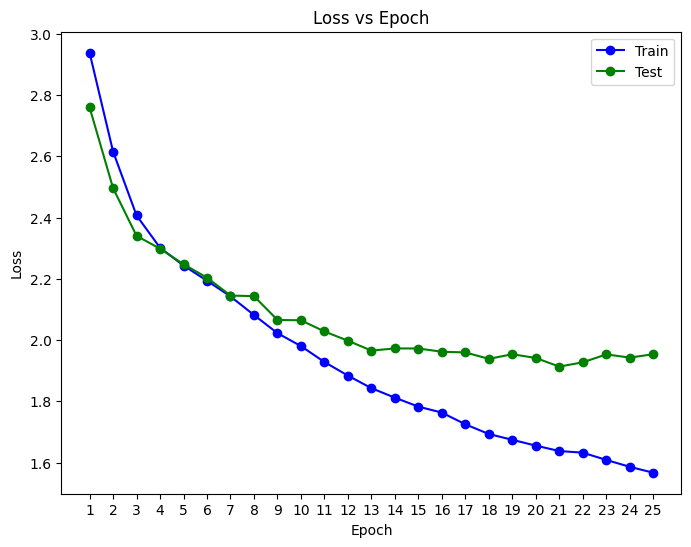

In [ ]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [ ]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,squash-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
2,apple-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
3,orange-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
4,tomato-diseased,0.890845,1.0,0.293942,0.298918,0.890845,1.0,0.442032,0.460257
5,grape-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
6,blueberry-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
7,grape-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
8,pepper-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
9,strawberry-diseased,0.022556,0.0,0.007673,0.000000,0.022556,0.0,0.011450,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.978370,0.953243,0.322714,0.349654,0.978370,0.953243,0.485340,0.511637
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.072222,0.000000,0.120370,0.000000,0.072222,0.000000,0.090278,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.955734,0.953243,0.352701,0.355956,0.955734,0.953243,0.515254,0.518351
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.956740,0.938160,0.358868,0.375831,0.956740,0.938160,0.521954,0.536670
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.959759,0.968326,0.361295,0.362200,0.959759,0.968326,0.524969,0.527202
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.967807,0.981146,0.358487,0.350768,0.967807,0.981146,0.523181,0.516783
5,grape-diseased,0.000000,0.006873,0.000000,0.076923,0.000000,0.006873,0.000000,0.012618
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.968310,0.970588,0.360352,0.355034,0.968310,0.970588,0.525239,0.519895
5,grape-diseased,0.048055,0.075601,0.189189,0.167939,0.048055,0.075601,0.076642,0.104265
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.964789,0.946455,0.367222,0.373179,0.964789,0.946455,0.531965,0.535295
5,grape-diseased,0.171625,0.271478,0.211864,0.247649,0.171625,0.271478,0.189633,0.259016
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.134644,0.002268,0.497207,0.111111,0.134644,0.002268,0.211905,0.004444
4,tomato-diseased,0.936117,0.957768,0.381900,0.369508,0.936117,0.957768,0.542486,0.533277
5,grape-diseased,0.354691,0.305842,0.260067,0.221393,0.354691,0.305842,0.300097,0.256854
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.691377,0.832200,0.447162,0.386723,0.691377,0.832200,0.543078,0.528058
4,tomato-diseased,0.870724,0.806938,0.432210,0.466028,0.870724,0.806938,0.577674,0.590834
5,grape-diseased,0.473684,0.460481,0.287900,0.258687,0.473684,0.460481,0.358131,0.331273
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.794251,0.770975,0.481210,0.513595,0.794251,0.770975,0.599315,0.616500
4,tomato-diseased,0.884306,0.848416,0.465695,0.459747,0.884306,0.848416,0.610099,0.596342
5,grape-diseased,0.572082,0.621993,0.276243,0.235065,0.572082,0.621993,0.372578,0.341188
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.188406,0.274725,0.419355,0.454545,0.188406,0.274725,0.260000,0.342466
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.797277,0.725624,0.478656,0.599251,0.797277,0.725624,0.598184,0.656410
4,tomato-diseased,0.886821,0.897436,0.466896,0.458221,0.886821,0.897436,0.611728,0.606679
5,grape-diseased,0.576659,0.556701,0.299643,0.274112,0.576659,0.556701,0.394366,0.367347
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.362319,0.230769,0.446429,0.428571,0.362319,0.230769,0.400000,0.300000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.813918,0.732426,0.486438,0.554031,0.813918,0.732426,0.608942,0.630859
4,tomato-diseased,0.897887,0.905731,0.484133,0.449140,0.897887,0.905731,0.629075,0.600500
5,grape-diseased,0.672769,0.591065,0.328492,0.289562,0.672769,0.591065,0.441441,0.388701
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.355072,0.351648,0.362963,0.333333,0.355072,0.351648,0.358974,0.342246
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.819970,0.802721,0.478799,0.478378,0.819970,0.802721,0.604573,0.599492
4,tomato-diseased,0.910463,0.856712,0.487608,0.490078,0.910463,0.856712,0.635088,0.623491
5,grape-diseased,0.610984,0.666667,0.334586,0.284457,0.610984,0.666667,0.432389,0.398767
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.398551,0.494505,0.333333,0.191489,0.398551,0.494505,0.363036,0.276074
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.863843,0.807256,0.491394,0.482385,0.863843,0.807256,0.626440,0.603902
4,tomato-diseased,0.906942,0.826546,0.501390,0.505535,0.906942,0.826546,0.645774,0.627361
5,grape-diseased,0.709382,0.673540,0.349887,0.289513,0.709382,0.673540,0.468632,0.404959
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.536232,0.175824,0.274074,0.390244,0.536232,0.175824,0.362745,0.242424
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.856278,0.804989,0.480068,0.491690,0.856278,0.804989,0.615217,0.610490
4,tomato-diseased,0.908451,0.889140,0.509881,0.477715,0.908451,0.889140,0.653165,0.621508
5,grape-diseased,0.684211,0.659794,0.365526,0.316310,0.684211,0.659794,0.476494,0.427617
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.007519,0.000000,0.250000,0.000000,0.007519,0.000000,0.014599,0.000000


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.615942,0.494505,0.298246,0.252809,0.615942,0.494505,0.401891,0.334572
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.869894,0.736961,0.474422,0.530179,0.869894,0.736961,0.613988,0.616698
4,tomato-diseased,0.906439,0.898190,0.512952,0.457725,0.906439,0.898190,0.655154,0.606415
5,grape-diseased,0.707094,0.611684,0.400259,0.302721,0.707094,0.611684,0.511166,0.405006
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.007519,0.000000,0.500000,0.000000,0.007519,0.000000,0.014815,0.000000


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.630435,0.362637,0.312950,0.311321,0.630435,0.362637,0.418269,0.335025
1,squash-diseased,0.004545,0.006803,0.333333,0.125000,0.004545,0.006803,0.008969,0.012903
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.863843,0.852608,0.482264,0.422947,0.863843,0.852608,0.618970,0.565414
4,tomato-diseased,0.920523,0.868024,0.519739,0.482600,0.920523,0.868024,0.664367,0.620318
5,grape-diseased,0.711670,0.580756,0.401809,0.335984,0.711670,0.580756,0.513625,0.425693
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.011236,0.008475,0.333333,0.333333,0.011236,0.008475,0.021739,0.016529
9,strawberry-diseased,0.007519,0.000000,0.166667,0.000000,0.007519,0.000000,0.014388,0.000000


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.681159,0.362637,0.293750,0.311321,0.681159,0.362637,0.410480,0.335025
1,squash-diseased,0.009091,0.020408,0.250000,0.214286,0.009091,0.020408,0.017544,0.037267
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.875946,0.841270,0.496569,0.427912,0.875946,0.841270,0.633826,0.567278
4,tomato-diseased,0.922535,0.832579,0.518665,0.511822,0.922535,0.832579,0.664012,0.633936
5,grape-diseased,0.716247,0.704467,0.427012,0.313936,0.716247,0.704467,0.535043,0.434322
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.008475,0.000000,0.200000,0.000000,0.008475,0.000000,0.016260
9,strawberry-diseased,0.022556,0.011236,0.136364,0.090909,0.022556,0.011236,0.038710,0.020000


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.681159,0.450549,0.311258,0.286713,0.681159,0.450549,0.427273,0.350427
1,squash-diseased,0.009091,0.006803,0.064516,0.083333,0.009091,0.006803,0.015936,0.012579
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.877458,0.861678,0.476582,0.438293,0.877458,0.861678,0.617678,0.581040
4,tomato-diseased,0.910966,0.882353,0.522504,0.478332,0.910966,0.882353,0.664100,0.620361
5,grape-diseased,0.734554,0.560137,0.450843,0.363029,0.734554,0.560137,0.558747,0.440541
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.045113,0.011236,0.193548,0.200000,0.045113,0.011236,0.073171,0.021277


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.746377,0.439560,0.332258,0.314961,0.746377,0.439560,0.459821,0.366972
1,squash-diseased,0.050000,0.020408,0.268293,0.111111,0.050000,0.020408,0.084291,0.034483
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.883510,0.811791,0.494496,0.477333,0.883510,0.811791,0.634093,0.601175
4,tomato-diseased,0.914990,0.883107,0.520756,0.475630,0.914990,0.883107,0.663747,0.618268
5,grape-diseased,0.732265,0.563574,0.445063,0.385882,0.732265,0.563574,0.553633,0.458101
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.005618,0.008475,0.083333,0.041667,0.005618,0.008475,0.010526,0.014085
9,strawberry-diseased,0.037594,0.022472,0.217391,0.090909,0.037594,0.022472,0.064103,0.036036


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.688406,0.406593,0.315615,0.282443,0.688406,0.406593,0.432802,0.333333
1,squash-diseased,0.027273,0.013605,0.142857,0.074074,0.027273,0.013605,0.045802,0.022989
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.869894,0.832200,0.498267,0.484169,0.869894,0.832200,0.633609,0.612177
4,tomato-diseased,0.919014,0.889140,0.528187,0.475979,0.919014,0.889140,0.670828,0.620037
5,grape-diseased,0.727689,0.529210,0.457554,0.374696,0.727689,0.529210,0.561837,0.438746
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.005618,0.000000,0.066667,0.000000,0.005618,0.000000,0.010363,0.000000
9,strawberry-diseased,0.120301,0.067416,0.228571,0.086957,0.120301,0.067416,0.157635,0.075949


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.681159,0.362637,0.319728,0.375000,0.681159,0.362637,0.435185,0.368715
1,squash-diseased,0.045455,0.020408,0.128205,0.065217,0.045455,0.020408,0.067114,0.031088
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.894100,0.825397,0.534358,0.455000,0.894100,0.825397,0.668930,0.586624
4,tomato-diseased,0.917505,0.851433,0.537102,0.499116,0.917505,0.851433,0.677563,0.629320
5,grape-diseased,0.757437,0.604811,0.515576,0.381779,0.757437,0.604811,0.613531,0.468085
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.022472,0.025424,0.181818,0.115385,0.022472,0.025424,0.040000,0.041667
9,strawberry-diseased,0.105263,0.000000,0.175000,0.000000,0.105263,0.000000,0.131455,0.000000


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.710145,0.483516,0.340278,0.243094,0.710145,0.483516,0.460094,0.323529
1,squash-diseased,0.100000,0.034014,0.271605,0.100000,0.100000,0.034014,0.146179,0.050761
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.883510,0.734694,0.545285,0.580645,0.883510,0.734694,0.674365,0.648649
4,tomato-diseased,0.915493,0.872549,0.543608,0.491504,0.915493,0.872549,0.682159,0.628804
5,grape-diseased,0.762014,0.690722,0.491150,0.353873,0.762014,0.690722,0.597309,0.467986
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.005618,0.016949,0.100000,0.117647,0.005618,0.016949,0.010638,0.029630
9,strawberry-diseased,0.127820,0.123596,0.207317,0.107843,0.127820,0.123596,0.158140,0.115183


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.673913,0.428571,0.359073,0.304688,0.673913,0.428571,0.468514,0.356164
1,squash-diseased,0.086364,0.115646,0.213483,0.229730,0.086364,0.115646,0.122977,0.153846
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.888048,0.752834,0.539522,0.596050,0.888048,0.752834,0.671241,0.665331
4,tomato-diseased,0.908954,0.884615,0.547908,0.495773,0.908954,0.884615,0.683693,0.635428
5,grape-diseased,0.762014,0.591065,0.509954,0.397229,0.762014,0.591065,0.611009,0.475138
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.011236,0.008475,0.064516,0.022222,0.011236,0.008475,0.019139,0.012270
9,strawberry-diseased,0.127820,0.089888,0.186813,0.140351,0.127820,0.089888,0.151786,0.109589


#### AUROC

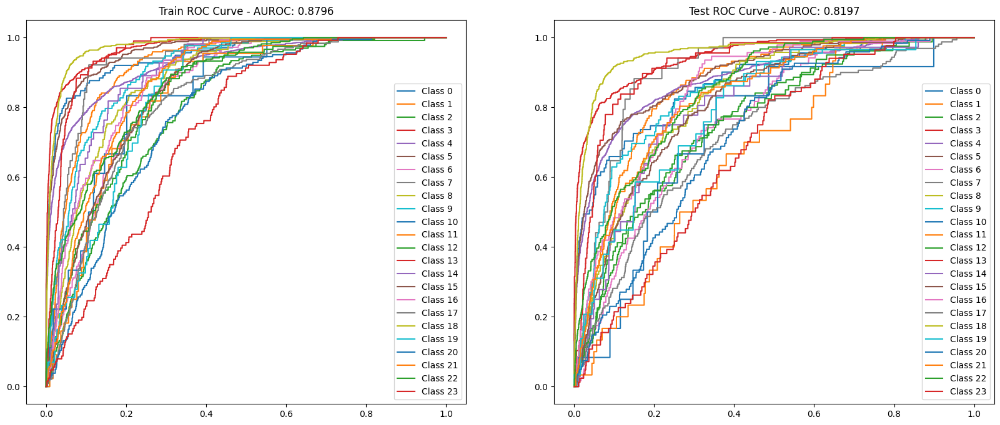

In [ ]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

#### Liberación de memoria

In [ ]:
del classifier_model_1

with torch.no_grad():
    torch.cuda.empty_cache()

# Partición #2

## Entrenamiento del Autoencoder

In [ ]:
autoencoder_model_2 = Autoencoder().to(device)

autoencoder_loss_fn_2 = nn.MSELoss()
autoencoder_optimizer_2 = torch.optim.Adam(autoencoder_model_2.parameters(), lr=learning_rate, amsgrad=True)

autoencoder_dataloader_2 = DataLoader(
    encoder_dataset_2, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_loss = []

start_time = time.time()
for epoch in range(epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    epoch_loss = train(autoencoder_dataloader_2, autoencoder_model_2, autoencoder_loss_fn_2, autoencoder_optimizer_2, unsupervised=True)
    train_loss.append(epoch_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 0.324645  [   32/27724]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 0.225826  [  352/27724]
Current Loss: 0.180595  [  672/27724]
Current Loss: 0.158934  [  992/27724]
Current Loss: 0.151552  [ 1312/27724]
Current Loss: 0.145713  [ 1632/27724]
Current Loss: 0.141841  [ 1952/27724]
Current Loss: 0.137610  [ 2272/27724]
Current Loss: 0.134311  [ 2592/27724]
Current Loss: 0.130421  [ 2912/27724]
Current Loss: 0.128857  [ 3232/27724]
Current Loss: 0.127698  [ 3552/27724]
Current Loss: 0.126133  [ 3872/27724]
Current Loss: 0.125078  [ 4192/27724]
Current Loss: 0.123715  [ 4512/27724]
Current Loss: 0.122080  [ 4832/27724]
Current Loss: 0.120929  [ 5152/27724]
Current Loss: 0.119187  [ 5472/27724]
Current Loss: 0.118841  [ 5792/27724]
Current Loss: 0.118301  [ 6112/27724]
Current Loss: 0.117895  [ 6432/27724]
Current Loss: 0.117149  [ 6752/27724]
Current Loss: 0.116617  [ 7072/27724]
Current Loss: 0.115871  [ 7392/27724]
Current Loss: 0.115600  [ 7712/27724]
Current Loss: 0.115092  [ 8032/27724]
Current Loss: 0.114807  [ 8352/27724]
Current Loss

### Evaluación del modelo

#### Curva de entrenamiento

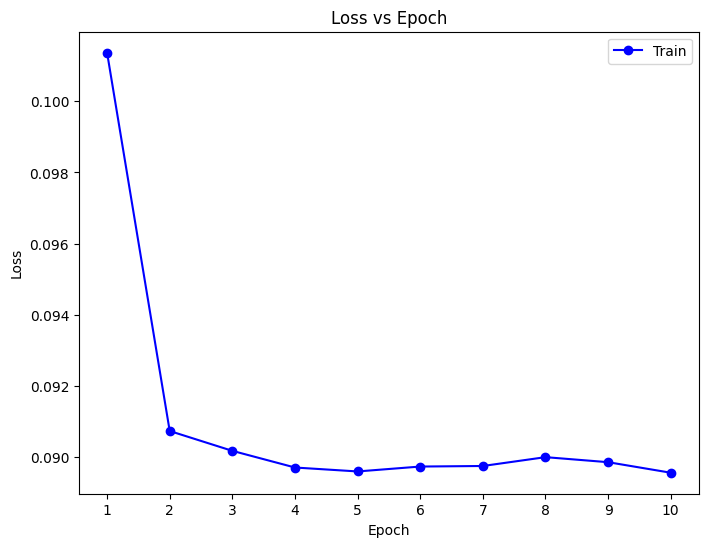

In [ ]:
epoch_list = [epoch+1 for epoch in range(epochs)]
show_learning_curve(train_loss, epoch_list=epoch_list)

#### Reconstrucción de imágenes

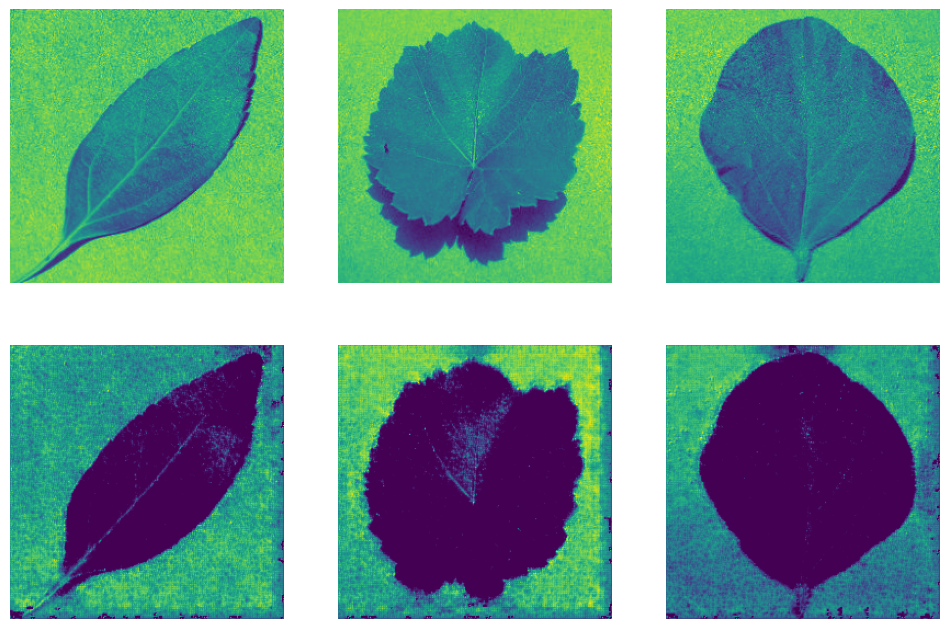

In [ ]:
test_dataloader_2 = DataLoader(
    test_dataset_2, batch_size=batch_size, shuffle=True)

reconstruct_image(autoencoder_model_2, test_dataloader_2, num_samples=3)

## Entrenamiento del Clasificador sin Autoencoder

In [ ]:
classifier_model_2 = Classifier(input_features=250).to(device)

classifier_loss_fn_2 = nn.CrossEntropyLoss()
classifier_optimizer_2 = torch.optim.Adam(classifier_model_2.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader_2 = DataLoader(
    train_dataset_2, batch_size=batch_size, shuffle=True)

classifier_test_dataloader_2 = DataLoader(
    test_dataset_2, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader_2, classifier_model_2, classifier_loss_fn_2, classifier_optimizer_2)
    test_loss = test(classifier_test_dataloader_2, classifier_model_2, classifier_loss_fn_2)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.080481  [   32/22179]
Current Loss: 3.022489  [  352/22179]
Current Loss: 3.018708  [  672/22179]
Current Loss: 2.978705  [  992/22179]
Current Loss: 2.984856  [ 1312/22179]
Current Loss: 2.967135  [ 1632/22179]
Current Loss: 2.950903  [ 1952/22179]
Current Loss: 2.939571  [ 2272/22179]
Current Loss: 2.927303  [ 2592/22179]
Current Loss: 2.914265  [ 2912/22179]
Current Loss: 2.905624  [ 3232/22179]
Current Loss: 2.898637  [ 3552/22179]
Current Loss: 2.895570  [ 3872/22179]
Current Loss: 2.890555  [ 4192/22179]
Current Loss: 2.891588  [ 4512/22179]
Current Loss: 2.887323  [ 4832/22179]
Current Loss: 2.873148  [ 5152/22179]
Current Loss: 2.869139  [ 5472/22179]
Current Loss: 2.861896  [ 5792/22179]
Current Loss: 2.855200  [ 6112/22179]
Current Loss: 2.849555  [ 6432/22179]
Current Loss: 2.838719  [ 6752/22179]
Current Loss: 2.831992  [ 7072/221

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.177858,0.393574,0.177858,0.245000
4,tomato-diseased,0.873868,0.404469,0.873868,0.552988
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.076478  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.286392  [  352/22179]
Current Loss: 2.357320  [  672/22179]
Current Loss: 2.352785  [  992/22179]
Current Loss: 2.359127  [ 1312/22179]
Current Loss: 2.337257  [ 1632/22179]
Current Loss: 2.345369  [ 1952/22179]
Current Loss: 2.348811  [ 2272/22179]
Current Loss: 2.341337  [ 2592/22179]
Current Loss: 2.342042  [ 2912/22179]
Current Loss: 2.332284  [ 3232/22179]
Current Loss: 2.326481  [ 3552/22179]
Current Loss: 2.310726  [ 3872/22179]
Current Loss: 2.312813  [ 4192/22179]
Current Loss: 2.314624  [ 4512/22179]
Current Loss: 2.309313  [ 4832/22179]
Current Loss: 2.314145  [ 5152/22179]
Current Loss: 2.309596  [ 5472/22179]
Current Loss: 2.309997  [ 5792/22179]
Current Loss: 2.302970  [ 6112/22179]
Current Loss: 2.309727  [ 6432/22179]
Current Loss: 2.308863  [ 6752/22179]
Current Loss: 2.305628  [ 7072/22179]
Current Loss: 2.302213  [ 7392/22179]
Current Loss: 2.294084  [ 7712/22179]
Current Loss: 2.294653  [ 8032/22179]
Current Loss: 2.302626  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.346642,0.533520,0.346642,0.420242
4,tomato-diseased,0.916113,0.405557,0.916113,0.562222
5,grape-diseased,0.250000,0.590909,0.250000,0.351351
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.192982  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.135454  [  352/22179]
Current Loss: 2.094778  [  672/22179]
Current Loss: 2.103809  [  992/22179]
Current Loss: 2.103452  [ 1312/22179]
Current Loss: 2.093123  [ 1632/22179]
Current Loss: 2.086770  [ 1952/22179]
Current Loss: 2.088704  [ 2272/22179]
Current Loss: 2.076765  [ 2592/22179]
Current Loss: 2.081684  [ 2912/22179]
Current Loss: 2.070054  [ 3232/22179]
Current Loss: 2.065468  [ 3552/22179]
Current Loss: 2.072274  [ 3872/22179]
Current Loss: 2.082634  [ 4192/22179]
Current Loss: 2.086089  [ 4512/22179]
Current Loss: 2.080871  [ 4832/22179]
Current Loss: 2.075460  [ 5152/22179]
Current Loss: 2.070624  [ 5472/22179]
Current Loss: 2.071407  [ 5792/22179]
Current Loss: 2.072267  [ 6112/22179]
Current Loss: 2.066276  [ 6432/22179]
Current Loss: 2.065610  [ 6752/22179]
Current Loss: 2.066375  [ 7072/22179]
Current Loss: 2.063859  [ 7392/22179]
Current Loss: 2.069268  [ 7712/22179]
Current Loss: 2.074534  [ 8032/22179]
Current Loss: 2.075286  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.544465,0.554529,0.544465,0.549451
4,tomato-diseased,0.858781,0.417792,0.858781,0.562117
5,grape-diseased,0.585165,0.467105,0.585165,0.519512
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.820851  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.983773  [  352/22179]
Current Loss: 2.019693  [  672/22179]
Current Loss: 2.012194  [  992/22179]
Current Loss: 1.993647  [ 1312/22179]
Current Loss: 1.970456  [ 1632/22179]
Current Loss: 1.991657  [ 1952/22179]
Current Loss: 1.986360  [ 2272/22179]
Current Loss: 2.001908  [ 2592/22179]
Current Loss: 1.993955  [ 2912/22179]
Current Loss: 1.993750  [ 3232/22179]
Current Loss: 1.998620  [ 3552/22179]
Current Loss: 2.006273  [ 3872/22179]
Current Loss: 2.002925  [ 4192/22179]
Current Loss: 1.994153  [ 4512/22179]
Current Loss: 1.986419  [ 4832/22179]
Current Loss: 1.986720  [ 5152/22179]
Current Loss: 1.989845  [ 5472/22179]
Current Loss: 1.987631  [ 5792/22179]
Current Loss: 1.983166  [ 6112/22179]
Current Loss: 1.984715  [ 6432/22179]
Current Loss: 1.987216  [ 6752/22179]
Current Loss: 1.987770  [ 7072/22179]
Current Loss: 1.989009  [ 7392/22179]
Current Loss: 1.987599  [ 7712/22179]
Current Loss: 1.990551  [ 8032/22179]
Current Loss: 1.988588  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.310345,0.492795,0.310345,0.380846
4,tomato-diseased,0.840676,0.407191,0.840676,0.548641
5,grape-diseased,0.730769,0.429725,0.730769,0.541200
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.307184  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.029124  [  352/22179]
Current Loss: 1.991223  [  672/22179]
Current Loss: 1.938318  [  992/22179]
Current Loss: 1.932772  [ 1312/22179]
Current Loss: 1.952770  [ 1632/22179]
Current Loss: 1.935210  [ 1952/22179]
Current Loss: 1.927819  [ 2272/22179]
Current Loss: 1.915284  [ 2592/22179]
Current Loss: 1.917223  [ 2912/22179]
Current Loss: 1.899196  [ 3232/22179]
Current Loss: 1.908796  [ 3552/22179]
Current Loss: 1.908885  [ 3872/22179]
Current Loss: 1.914757  [ 4192/22179]
Current Loss: 1.912532  [ 4512/22179]
Current Loss: 1.911503  [ 4832/22179]
Current Loss: 1.911601  [ 5152/22179]
Current Loss: 1.917271  [ 5472/22179]
Current Loss: 1.915710  [ 5792/22179]
Current Loss: 1.903643  [ 6112/22179]
Current Loss: 1.903206  [ 6432/22179]
Current Loss: 1.900367  [ 6752/22179]
Current Loss: 1.898908  [ 7072/22179]
Current Loss: 1.899241  [ 7392/22179]
Current Loss: 1.899799  [ 7712/22179]
Current Loss: 1.901015  [ 8032/22179]
Current Loss: 1.903917  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.289474,1.000000,0.289474,0.448980
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.578947,0.553819,0.578947,0.566105
4,tomato-diseased,0.839469,0.449144,0.839469,0.585191
5,grape-diseased,0.631868,0.647887,0.631868,0.639777
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.769007  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.849345  [  352/22179]
Current Loss: 1.770772  [  672/22179]
Current Loss: 1.765204  [  992/22179]
Current Loss: 1.773799  [ 1312/22179]
Current Loss: 1.742251  [ 1632/22179]
Current Loss: 1.751152  [ 1952/22179]
Current Loss: 1.747253  [ 2272/22179]
Current Loss: 1.759737  [ 2592/22179]
Current Loss: 1.763332  [ 2912/22179]
Current Loss: 1.769246  [ 3232/22179]
Current Loss: 1.763566  [ 3552/22179]
Current Loss: 1.782487  [ 3872/22179]
Current Loss: 1.795947  [ 4192/22179]
Current Loss: 1.798192  [ 4512/22179]
Current Loss: 1.801230  [ 4832/22179]
Current Loss: 1.804178  [ 5152/22179]
Current Loss: 1.811261  [ 5472/22179]
Current Loss: 1.821437  [ 5792/22179]
Current Loss: 1.822865  [ 6112/22179]
Current Loss: 1.823032  [ 6432/22179]
Current Loss: 1.825374  [ 6752/22179]
Current Loss: 1.828178  [ 7072/22179]
Current Loss: 1.832576  [ 7392/22179]
Current Loss: 1.826991  [ 7712/22179]
Current Loss: 1.832608  [ 8032/22179]
Current Loss: 1.828343  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.535088,0.734940,0.535088,0.619289
1,squash-diseased,0.005435,0.083333,0.005435,0.010204
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.615245,0.602131,0.615245,0.608618
4,tomato-diseased,0.841883,0.444692,0.841883,0.581977
5,grape-diseased,0.678571,0.628499,0.678571,0.652576
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.821083  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.839263  [  352/22179]
Current Loss: 1.876649  [  672/22179]
Current Loss: 1.828683  [  992/22179]
Current Loss: 1.833852  [ 1312/22179]
Current Loss: 1.822122  [ 1632/22179]
Current Loss: 1.832903  [ 1952/22179]
Current Loss: 1.842522  [ 2272/22179]
Current Loss: 1.835428  [ 2592/22179]
Current Loss: 1.837971  [ 2912/22179]
Current Loss: 1.817772  [ 3232/22179]
Current Loss: 1.813247  [ 3552/22179]
Current Loss: 1.813442  [ 3872/22179]
Current Loss: 1.806849  [ 4192/22179]
Current Loss: 1.814092  [ 4512/22179]
Current Loss: 1.800709  [ 4832/22179]
Current Loss: 1.805849  [ 5152/22179]
Current Loss: 1.814332  [ 5472/22179]
Current Loss: 1.812092  [ 5792/22179]
Current Loss: 1.812676  [ 6112/22179]
Current Loss: 1.811367  [ 6432/22179]
Current Loss: 1.808495  [ 6752/22179]
Current Loss: 1.802886  [ 7072/22179]
Current Loss: 1.800025  [ 7392/22179]
Current Loss: 1.806938  [ 7712/22179]
Current Loss: 1.810413  [ 8032/22179]
Current Loss: 1.808892  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.473684,0.843750,0.473684,0.606742
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.633394,0.556619,0.633394,0.592530
4,tomato-diseased,0.846711,0.426055,0.846711,0.566869
5,grape-diseased,0.519231,0.687273,0.519231,0.591549
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.870078  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.812534  [  352/22179]
Current Loss: 1.877145  [  672/22179]
Current Loss: 1.901581  [  992/22179]
Current Loss: 1.885644  [ 1312/22179]
Current Loss: 1.893104  [ 1632/22179]
Current Loss: 1.856265  [ 1952/22179]
Current Loss: 1.860138  [ 2272/22179]
Current Loss: 1.856115  [ 2592/22179]
Current Loss: 1.860987  [ 2912/22179]
Current Loss: 1.846189  [ 3232/22179]
Current Loss: 1.849830  [ 3552/22179]
Current Loss: 1.859787  [ 3872/22179]
Current Loss: 1.850533  [ 4192/22179]
Current Loss: 1.855069  [ 4512/22179]
Current Loss: 1.846024  [ 4832/22179]
Current Loss: 1.843573  [ 5152/22179]
Current Loss: 1.833742  [ 5472/22179]
Current Loss: 1.826234  [ 5792/22179]
Current Loss: 1.824543  [ 6112/22179]
Current Loss: 1.823243  [ 6432/22179]
Current Loss: 1.814360  [ 6752/22179]
Current Loss: 1.821470  [ 7072/22179]
Current Loss: 1.819819  [ 7392/22179]
Current Loss: 1.816971  [ 7712/22179]
Current Loss: 1.815914  [ 8032/22179]
Current Loss: 1.814771  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.517544,0.686047,0.517544,0.590000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.520871,0.661290,0.520871,0.582741
4,tomato-diseased,0.891973,0.434706,0.891973,0.584536
5,grape-diseased,0.601648,0.697452,0.601648,0.646018
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.416827  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.752681  [  352/22179]
Current Loss: 1.843513  [  672/22179]
Current Loss: 1.852511  [  992/22179]
Current Loss: 1.843527  [ 1312/22179]
Current Loss: 1.829281  [ 1632/22179]
Current Loss: 1.806504  [ 1952/22179]
Current Loss: 1.801648  [ 2272/22179]
Current Loss: 1.810504  [ 2592/22179]
Current Loss: 1.809574  [ 2912/22179]
Current Loss: 1.817989  [ 3232/22179]
Current Loss: 1.832338  [ 3552/22179]
Current Loss: 1.822940  [ 3872/22179]
Current Loss: 1.813163  [ 4192/22179]
Current Loss: 1.808827  [ 4512/22179]
Current Loss: 1.806553  [ 4832/22179]
Current Loss: 1.806688  [ 5152/22179]
Current Loss: 1.807927  [ 5472/22179]
Current Loss: 1.798053  [ 5792/22179]
Current Loss: 1.792466  [ 6112/22179]
Current Loss: 1.791644  [ 6432/22179]
Current Loss: 1.790013  [ 6752/22179]
Current Loss: 1.794688  [ 7072/22179]
Current Loss: 1.795055  [ 7392/22179]
Current Loss: 1.792022  [ 7712/22179]
Current Loss: 1.791367  [ 8032/22179]
Current Loss: 1.792745  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.482456,0.639535,0.482456,0.550000
1,squash-diseased,0.027174,0.178571,0.027174,0.047170
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.553539,0.699541,0.553539,0.618034
4,tomato-diseased,0.843693,0.453014,0.843693,0.589500
5,grape-diseased,0.758242,0.596112,0.758242,0.667473
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.588961  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.817633  [  352/22179]
Current Loss: 1.741113  [  672/22179]
Current Loss: 1.731102  [  992/22179]
Current Loss: 1.692191  [ 1312/22179]
Current Loss: 1.670032  [ 1632/22179]
Current Loss: 1.677600  [ 1952/22179]
Current Loss: 1.687782  [ 2272/22179]
Current Loss: 1.687503  [ 2592/22179]
Current Loss: 1.690945  [ 2912/22179]
Current Loss: 1.693264  [ 3232/22179]
Current Loss: 1.690258  [ 3552/22179]
Current Loss: 1.702883  [ 3872/22179]
Current Loss: 1.705530  [ 4192/22179]
Current Loss: 1.704716  [ 4512/22179]
Current Loss: 1.707966  [ 4832/22179]
Current Loss: 1.709161  [ 5152/22179]
Current Loss: 1.703346  [ 5472/22179]
Current Loss: 1.707695  [ 5792/22179]
Current Loss: 1.710808  [ 6112/22179]
Current Loss: 1.708867  [ 6432/22179]
Current Loss: 1.714492  [ 6752/22179]
Current Loss: 1.722506  [ 7072/22179]
Current Loss: 1.723097  [ 7392/22179]
Current Loss: 1.724471  [ 7712/22179]
Current Loss: 1.726958  [ 8032/22179]
Current Loss: 1.729200  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.517544,0.678161,0.517544,0.587065
1,squash-diseased,0.021739,0.333333,0.021739,0.040816
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.598911,0.657371,0.598911,0.626781
4,tomato-diseased,0.867833,0.449797,0.867833,0.592501
5,grape-diseased,0.645604,0.679191,0.645604,0.661972
6,blueberry-healthy,0.026667,0.444444,0.026667,0.050314
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.474052  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.686739  [  352/22179]
Current Loss: 1.677534  [  672/22179]
Current Loss: 1.701327  [  992/22179]
Current Loss: 1.702524  [ 1312/22179]
Current Loss: 1.727891  [ 1632/22179]
Current Loss: 1.742712  [ 1952/22179]
Current Loss: 1.745001  [ 2272/22179]
Current Loss: 1.737395  [ 2592/22179]
Current Loss: 1.724565  [ 2912/22179]
Current Loss: 1.716377  [ 3232/22179]
Current Loss: 1.704324  [ 3552/22179]
Current Loss: 1.702418  [ 3872/22179]
Current Loss: 1.702039  [ 4192/22179]
Current Loss: 1.700514  [ 4512/22179]
Current Loss: 1.700222  [ 4832/22179]
Current Loss: 1.690807  [ 5152/22179]
Current Loss: 1.687032  [ 5472/22179]
Current Loss: 1.692288  [ 5792/22179]
Current Loss: 1.697199  [ 6112/22179]
Current Loss: 1.690299  [ 6432/22179]
Current Loss: 1.690958  [ 6752/22179]
Current Loss: 1.691973  [ 7072/22179]
Current Loss: 1.692795  [ 7392/22179]
Current Loss: 1.694045  [ 7712/22179]
Current Loss: 1.699989  [ 8032/22179]
Current Loss: 1.697142  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.517544,0.595960,0.517544,0.553991
1,squash-diseased,0.021739,0.222222,0.021739,0.039604
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.573503,0.666667,0.573503,0.616585
4,tomato-diseased,0.838865,0.463333,0.838865,0.596951
5,grape-diseased,0.763736,0.575569,0.763736,0.656434
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.475056  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.717165  [  352/22179]
Current Loss: 1.683371  [  672/22179]
Current Loss: 1.671509  [  992/22179]
Current Loss: 1.670790  [ 1312/22179]
Current Loss: 1.689310  [ 1632/22179]
Current Loss: 1.689616  [ 1952/22179]
Current Loss: 1.680734  [ 2272/22179]
Current Loss: 1.679942  [ 2592/22179]
Current Loss: 1.675462  [ 2912/22179]
Current Loss: 1.672815  [ 3232/22179]
Current Loss: 1.684616  [ 3552/22179]
Current Loss: 1.680015  [ 3872/22179]
Current Loss: 1.681348  [ 4192/22179]
Current Loss: 1.688114  [ 4512/22179]
Current Loss: 1.691347  [ 4832/22179]
Current Loss: 1.682241  [ 5152/22179]
Current Loss: 1.686696  [ 5472/22179]
Current Loss: 1.692349  [ 5792/22179]
Current Loss: 1.686158  [ 6112/22179]
Current Loss: 1.684545  [ 6432/22179]
Current Loss: 1.684418  [ 6752/22179]
Current Loss: 1.678865  [ 7072/22179]
Current Loss: 1.678425  [ 7392/22179]
Current Loss: 1.674876  [ 7712/22179]
Current Loss: 1.671611  [ 8032/22179]
Current Loss: 1.670659  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.403509,0.807018,0.403509,0.538012
1,squash-diseased,0.027174,0.227273,0.027174,0.048544
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.691470,0.560294,0.691470,0.619009
4,tomato-diseased,0.819553,0.442489,0.819553,0.574693
5,grape-diseased,0.659341,0.666667,0.659341,0.662983
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.484740  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.502606  [  352/22179]
Current Loss: 1.539104  [  672/22179]
Current Loss: 1.585470  [  992/22179]
Current Loss: 1.595172  [ 1312/22179]
Current Loss: 1.594038  [ 1632/22179]
Current Loss: 1.613308  [ 1952/22179]
Current Loss: 1.587761  [ 2272/22179]
Current Loss: 1.603579  [ 2592/22179]
Current Loss: 1.608343  [ 2912/22179]
Current Loss: 1.610883  [ 3232/22179]
Current Loss: 1.603573  [ 3552/22179]
Current Loss: 1.602104  [ 3872/22179]
Current Loss: 1.611200  [ 4192/22179]
Current Loss: 1.616269  [ 4512/22179]
Current Loss: 1.630659  [ 4832/22179]
Current Loss: 1.632230  [ 5152/22179]
Current Loss: 1.621419  [ 5472/22179]
Current Loss: 1.618196  [ 5792/22179]
Current Loss: 1.614967  [ 6112/22179]
Current Loss: 1.616901  [ 6432/22179]
Current Loss: 1.615425  [ 6752/22179]
Current Loss: 1.616398  [ 7072/22179]
Current Loss: 1.618141  [ 7392/22179]
Current Loss: 1.618257  [ 7712/22179]
Current Loss: 1.614644  [ 8032/22179]
Current Loss: 1.617024  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.500000,0.647727,0.500000,0.564356
1,squash-diseased,0.086957,0.231884,0.086957,0.126482
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.722323,0.587021,0.722323,0.647681
4,tomato-diseased,0.805673,0.470236,0.805673,0.593861
5,grape-diseased,0.711538,0.628641,0.711538,0.667526
6,blueberry-healthy,0.073333,0.440000,0.073333,0.125714
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.609282  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.560408  [  352/22179]
Current Loss: 1.586339  [  672/22179]
Current Loss: 1.625546  [  992/22179]
Current Loss: 1.627482  [ 1312/22179]
Current Loss: 1.640429  [ 1632/22179]
Current Loss: 1.621124  [ 1952/22179]
Current Loss: 1.636632  [ 2272/22179]
Current Loss: 1.616906  [ 2592/22179]
Current Loss: 1.622005  [ 2912/22179]
Current Loss: 1.625243  [ 3232/22179]
Current Loss: 1.627567  [ 3552/22179]
Current Loss: 1.624276  [ 3872/22179]
Current Loss: 1.624602  [ 4192/22179]
Current Loss: 1.625060  [ 4512/22179]
Current Loss: 1.623078  [ 4832/22179]
Current Loss: 1.621093  [ 5152/22179]
Current Loss: 1.629247  [ 5472/22179]
Current Loss: 1.632432  [ 5792/22179]
Current Loss: 1.628553  [ 6112/22179]
Current Loss: 1.628464  [ 6432/22179]
Current Loss: 1.630497  [ 6752/22179]
Current Loss: 1.624236  [ 7072/22179]
Current Loss: 1.621832  [ 7392/22179]
Current Loss: 1.625901  [ 7712/22179]
Current Loss: 1.626817  [ 8032/22179]
Current Loss: 1.621112  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.447368,0.560440,0.447368,0.497561
1,squash-diseased,0.119565,0.268293,0.119565,0.165414
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.535390,0.583004,0.535390,0.558184
4,tomato-diseased,0.823778,0.457746,0.823778,0.588489
5,grape-diseased,0.703297,0.612440,0.703297,0.654731
6,blueberry-healthy,0.173333,0.337662,0.173333,0.229075
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.612524  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.640490  [  352/22179]
Current Loss: 1.609721  [  672/22179]
Current Loss: 1.598358  [  992/22179]
Current Loss: 1.576694  [ 1312/22179]
Current Loss: 1.557439  [ 1632/22179]
Current Loss: 1.564501  [ 1952/22179]
Current Loss: 1.575231  [ 2272/22179]
Current Loss: 1.581650  [ 2592/22179]
Current Loss: 1.601820  [ 2912/22179]
Current Loss: 1.599507  [ 3232/22179]
Current Loss: 1.613865  [ 3552/22179]
Current Loss: 1.613715  [ 3872/22179]
Current Loss: 1.608333  [ 4192/22179]
Current Loss: 1.613532  [ 4512/22179]
Current Loss: 1.603844  [ 4832/22179]
Current Loss: 1.593720  [ 5152/22179]
Current Loss: 1.591510  [ 5472/22179]
Current Loss: 1.592321  [ 5792/22179]
Current Loss: 1.584742  [ 6112/22179]
Current Loss: 1.581515  [ 6432/22179]
Current Loss: 1.588146  [ 6752/22179]
Current Loss: 1.598936  [ 7072/22179]
Current Loss: 1.607600  [ 7392/22179]
Current Loss: 1.607877  [ 7712/22179]
Current Loss: 1.604301  [ 8032/22179]
Current Loss: 1.605555  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.429825,0.662162,0.429825,0.521277
1,squash-diseased,0.097826,0.200000,0.097826,0.131387
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.535390,0.766234,0.535390,0.630342
4,tomato-diseased,0.857574,0.460765,0.857574,0.599452
5,grape-diseased,0.706044,0.625304,0.706044,0.663226
6,blueberry-healthy,0.020000,0.428571,0.020000,0.038217
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.740922  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.529374  [  352/22179]
Current Loss: 1.531856  [  672/22179]
Current Loss: 1.568501  [  992/22179]
Current Loss: 1.567362  [ 1312/22179]
Current Loss: 1.550239  [ 1632/22179]
Current Loss: 1.563572  [ 1952/22179]
Current Loss: 1.553808  [ 2272/22179]
Current Loss: 1.566864  [ 2592/22179]
Current Loss: 1.559096  [ 2912/22179]
Current Loss: 1.567590  [ 3232/22179]
Current Loss: 1.568281  [ 3552/22179]
Current Loss: 1.579248  [ 3872/22179]
Current Loss: 1.566725  [ 4192/22179]
Current Loss: 1.567011  [ 4512/22179]
Current Loss: 1.564067  [ 4832/22179]
Current Loss: 1.569853  [ 5152/22179]
Current Loss: 1.572613  [ 5472/22179]
Current Loss: 1.579811  [ 5792/22179]
Current Loss: 1.582760  [ 6112/22179]
Current Loss: 1.588547  [ 6432/22179]
Current Loss: 1.588578  [ 6752/22179]
Current Loss: 1.583934  [ 7072/22179]
Current Loss: 1.577408  [ 7392/22179]
Current Loss: 1.574819  [ 7712/22179]
Current Loss: 1.578685  [ 8032/22179]
Current Loss: 1.574845  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.491228,0.602151,0.491228,0.541063
1,squash-diseased,0.130435,0.230769,0.130435,0.166667
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.667877,0.602291,0.667877,0.633391
4,tomato-diseased,0.814725,0.470219,0.814725,0.596290
5,grape-diseased,0.708791,0.638614,0.708791,0.671875
6,blueberry-healthy,0.120000,0.439024,0.120000,0.188482
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.708999  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.721858  [  352/22179]
Current Loss: 1.605541  [  672/22179]
Current Loss: 1.571819  [  992/22179]
Current Loss: 1.593349  [ 1312/22179]
Current Loss: 1.600185  [ 1632/22179]
Current Loss: 1.592495  [ 1952/22179]
Current Loss: 1.583622  [ 2272/22179]
Current Loss: 1.596463  [ 2592/22179]
Current Loss: 1.593797  [ 2912/22179]
Current Loss: 1.587936  [ 3232/22179]
Current Loss: 1.583625  [ 3552/22179]
Current Loss: 1.576748  [ 3872/22179]
Current Loss: 1.573296  [ 4192/22179]
Current Loss: 1.568153  [ 4512/22179]
Current Loss: 1.562809  [ 4832/22179]
Current Loss: 1.557909  [ 5152/22179]
Current Loss: 1.570153  [ 5472/22179]
Current Loss: 1.572268  [ 5792/22179]
Current Loss: 1.566223  [ 6112/22179]
Current Loss: 1.568112  [ 6432/22179]
Current Loss: 1.558922  [ 6752/22179]
Current Loss: 1.558360  [ 7072/22179]
Current Loss: 1.556064  [ 7392/22179]
Current Loss: 1.554471  [ 7712/22179]
Current Loss: 1.556158  [ 8032/22179]
Current Loss: 1.553107  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.491228,0.583333,0.491228,0.533333
1,squash-diseased,0.173913,0.278261,0.173913,0.214047
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.716878,0.564286,0.716878,0.631495
4,tomato-diseased,0.790585,0.477231,0.790585,0.595184
5,grape-diseased,0.766484,0.568228,0.766484,0.652632
6,blueberry-healthy,0.193333,0.371795,0.193333,0.254386
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.687479  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.599992  [  352/22179]
Current Loss: 1.563896  [  672/22179]
Current Loss: 1.552981  [  992/22179]
Current Loss: 1.565835  [ 1312/22179]
Current Loss: 1.558664  [ 1632/22179]
Current Loss: 1.556361  [ 1952/22179]
Current Loss: 1.551630  [ 2272/22179]
Current Loss: 1.539662  [ 2592/22179]
Current Loss: 1.546311  [ 2912/22179]
Current Loss: 1.527381  [ 3232/22179]
Current Loss: 1.527064  [ 3552/22179]
Current Loss: 1.526736  [ 3872/22179]
Current Loss: 1.531654  [ 4192/22179]
Current Loss: 1.538844  [ 4512/22179]
Current Loss: 1.534747  [ 4832/22179]
Current Loss: 1.530279  [ 5152/22179]
Current Loss: 1.530510  [ 5472/22179]
Current Loss: 1.530941  [ 5792/22179]
Current Loss: 1.535574  [ 6112/22179]
Current Loss: 1.535602  [ 6432/22179]
Current Loss: 1.533685  [ 6752/22179]
Current Loss: 1.532555  [ 7072/22179]
Current Loss: 1.538509  [ 7392/22179]
Current Loss: 1.538346  [ 7712/22179]
Current Loss: 1.541747  [ 8032/22179]
Current Loss: 1.541299  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.482456,0.561224,0.482456,0.518868
1,squash-diseased,0.228261,0.323077,0.228261,0.267516
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.686025,0.569277,0.686025,0.622222
4,tomato-diseased,0.808690,0.479085,0.808690,0.601706
5,grape-diseased,0.717033,0.611241,0.717033,0.659924
6,blueberry-healthy,0.166667,0.446429,0.166667,0.242718
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.018018,0.500000,0.018018,0.034783


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.830440  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.518566  [  352/22179]
Current Loss: 1.501645  [  672/22179]
Current Loss: 1.505966  [  992/22179]
Current Loss: 1.532055  [ 1312/22179]
Current Loss: 1.534461  [ 1632/22179]
Current Loss: 1.555532  [ 1952/22179]
Current Loss: 1.552794  [ 2272/22179]
Current Loss: 1.539417  [ 2592/22179]
Current Loss: 1.525035  [ 2912/22179]
Current Loss: 1.524050  [ 3232/22179]
Current Loss: 1.527288  [ 3552/22179]
Current Loss: 1.526903  [ 3872/22179]
Current Loss: 1.522943  [ 4192/22179]
Current Loss: 1.514259  [ 4512/22179]
Current Loss: 1.531058  [ 4832/22179]
Current Loss: 1.531504  [ 5152/22179]
Current Loss: 1.537273  [ 5472/22179]
Current Loss: 1.531604  [ 5792/22179]
Current Loss: 1.533325  [ 6112/22179]
Current Loss: 1.535370  [ 6432/22179]
Current Loss: 1.532703  [ 6752/22179]
Current Loss: 1.533402  [ 7072/22179]
Current Loss: 1.535927  [ 7392/22179]
Current Loss: 1.543551  [ 7712/22179]
Current Loss: 1.541253  [ 8032/22179]
Current Loss: 1.535971  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.508772,0.666667,0.508772,0.577114
1,squash-diseased,0.244565,0.269461,0.244565,0.256410
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.725953,0.562588,0.725953,0.633914
4,tomato-diseased,0.816536,0.464470,0.816536,0.592123
5,grape-diseased,0.739011,0.588621,0.739011,0.655298
6,blueberry-healthy,0.086667,0.250000,0.086667,0.128713
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.050806  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.429820  [  352/22179]
Current Loss: 1.463968  [  672/22179]
Current Loss: 1.485274  [  992/22179]
Current Loss: 1.481605  [ 1312/22179]
Current Loss: 1.479525  [ 1632/22179]
Current Loss: 1.491617  [ 1952/22179]
Current Loss: 1.503258  [ 2272/22179]
Current Loss: 1.507503  [ 2592/22179]
Current Loss: 1.503494  [ 2912/22179]
Current Loss: 1.508085  [ 3232/22179]
Current Loss: 1.517015  [ 3552/22179]
Current Loss: 1.512103  [ 3872/22179]
Current Loss: 1.512852  [ 4192/22179]
Current Loss: 1.516618  [ 4512/22179]
Current Loss: 1.525768  [ 4832/22179]
Current Loss: 1.528705  [ 5152/22179]
Current Loss: 1.531805  [ 5472/22179]
Current Loss: 1.529015  [ 5792/22179]
Current Loss: 1.520924  [ 6112/22179]
Current Loss: 1.524233  [ 6432/22179]
Current Loss: 1.525566  [ 6752/22179]
Current Loss: 1.525707  [ 7072/22179]
Current Loss: 1.523044  [ 7392/22179]
Current Loss: 1.522851  [ 7712/22179]
Current Loss: 1.527420  [ 8032/22179]
Current Loss: 1.536663  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.456140,0.626506,0.456140,0.527919
1,squash-diseased,0.293478,0.296703,0.293478,0.295082
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.646098,0.628975,0.646098,0.637422
4,tomato-diseased,0.830416,0.480279,0.830416,0.608580
5,grape-diseased,0.722527,0.618824,0.722527,0.666667
6,blueberry-healthy,0.186667,0.378378,0.186667,0.250000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.009009,0.071429,0.009009,0.016000


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.246630  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.454640  [  352/22179]
Current Loss: 1.478450  [  672/22179]
Current Loss: 1.510799  [  992/22179]
Current Loss: 1.512895  [ 1312/22179]
Current Loss: 1.493472  [ 1632/22179]
Current Loss: 1.493837  [ 1952/22179]
Current Loss: 1.477105  [ 2272/22179]
Current Loss: 1.468143  [ 2592/22179]
Current Loss: 1.460541  [ 2912/22179]
Current Loss: 1.458154  [ 3232/22179]
Current Loss: 1.455876  [ 3552/22179]
Current Loss: 1.450807  [ 3872/22179]
Current Loss: 1.448342  [ 4192/22179]
Current Loss: 1.444663  [ 4512/22179]
Current Loss: 1.449608  [ 4832/22179]
Current Loss: 1.457492  [ 5152/22179]
Current Loss: 1.462051  [ 5472/22179]
Current Loss: 1.449591  [ 5792/22179]
Current Loss: 1.451635  [ 6112/22179]
Current Loss: 1.458356  [ 6432/22179]
Current Loss: 1.458308  [ 6752/22179]
Current Loss: 1.459072  [ 7072/22179]
Current Loss: 1.458772  [ 7392/22179]
Current Loss: 1.465156  [ 7712/22179]
Current Loss: 1.467729  [ 8032/22179]
Current Loss: 1.477677  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.482456,0.611111,0.482456,0.539216
1,squash-diseased,0.402174,0.218289,0.402174,0.282983
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.667877,0.586922,0.667877,0.624788
4,tomato-diseased,0.783947,0.475650,0.783947,0.592069
5,grape-diseased,0.640110,0.649025,0.640110,0.644537
6,blueberry-healthy,0.246667,0.303279,0.246667,0.272059
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.036036,0.117647,0.036036,0.055172


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.251289  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.534033  [  352/22179]
Current Loss: 1.556035  [  672/22179]
Current Loss: 1.534886  [  992/22179]
Current Loss: 1.509969  [ 1312/22179]
Current Loss: 1.483752  [ 1632/22179]
Current Loss: 1.505833  [ 1952/22179]
Current Loss: 1.489395  [ 2272/22179]
Current Loss: 1.486917  [ 2592/22179]
Current Loss: 1.493006  [ 2912/22179]
Current Loss: 1.471905  [ 3232/22179]
Current Loss: 1.462991  [ 3552/22179]
Current Loss: 1.468600  [ 3872/22179]
Current Loss: 1.458599  [ 4192/22179]
Current Loss: 1.453247  [ 4512/22179]
Current Loss: 1.456803  [ 4832/22179]
Current Loss: 1.460563  [ 5152/22179]
Current Loss: 1.464130  [ 5472/22179]
Current Loss: 1.464689  [ 5792/22179]
Current Loss: 1.465136  [ 6112/22179]
Current Loss: 1.463328  [ 6432/22179]
Current Loss: 1.462877  [ 6752/22179]
Current Loss: 1.467630  [ 7072/22179]
Current Loss: 1.464696  [ 7392/22179]
Current Loss: 1.465734  [ 7712/22179]
Current Loss: 1.469922  [ 8032/22179]
Current Loss: 1.467459  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.535088,0.603960,0.535088,0.567442
1,squash-diseased,0.304348,0.259259,0.304348,0.280000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.664247,0.642105,0.664247,0.652988
4,tomato-diseased,0.843693,0.471819,0.843693,0.605195
5,grape-diseased,0.653846,0.664804,0.653846,0.659280
6,blueberry-healthy,0.226667,0.395349,0.226667,0.288136
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.036036,0.153846,0.036036,0.058394


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.525171  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.340861  [  352/22179]
Current Loss: 1.390477  [  672/22179]
Current Loss: 1.389345  [  992/22179]
Current Loss: 1.384876  [ 1312/22179]
Current Loss: 1.422148  [ 1632/22179]
Current Loss: 1.430864  [ 1952/22179]
Current Loss: 1.429856  [ 2272/22179]
Current Loss: 1.439701  [ 2592/22179]
Current Loss: 1.426651  [ 2912/22179]
Current Loss: 1.423557  [ 3232/22179]
Current Loss: 1.420517  [ 3552/22179]
Current Loss: 1.418088  [ 3872/22179]
Current Loss: 1.417397  [ 4192/22179]
Current Loss: 1.420747  [ 4512/22179]
Current Loss: 1.424701  [ 4832/22179]
Current Loss: 1.425067  [ 5152/22179]
Current Loss: 1.431594  [ 5472/22179]
Current Loss: 1.430745  [ 5792/22179]
Current Loss: 1.427956  [ 6112/22179]
Current Loss: 1.431910  [ 6432/22179]
Current Loss: 1.434914  [ 6752/22179]
Current Loss: 1.437972  [ 7072/22179]
Current Loss: 1.432943  [ 7392/22179]
Current Loss: 1.436039  [ 7712/22179]
Current Loss: 1.433056  [ 8032/22179]
Current Loss: 1.432357  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.508772,0.644444,0.508772,0.568627
1,squash-diseased,0.353261,0.250965,0.353261,0.293454
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.466425,0.758112,0.466425,0.577528
4,tomato-diseased,0.823174,0.472299,0.823174,0.600220
5,grape-diseased,0.747253,0.570231,0.747253,0.646849
6,blueberry-healthy,0.180000,0.313953,0.180000,0.228814
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.006757,0.125000,0.006757,0.012821
9,strawberry-diseased,0.036036,0.173913,0.036036,0.059701


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.389169  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.568885  [  352/22179]
Current Loss: 1.536573  [  672/22179]
Current Loss: 1.530268  [  992/22179]
Current Loss: 1.509923  [ 1312/22179]
Current Loss: 1.483387  [ 1632/22179]
Current Loss: 1.478203  [ 1952/22179]
Current Loss: 1.465469  [ 2272/22179]
Current Loss: 1.462159  [ 2592/22179]
Current Loss: 1.455821  [ 2912/22179]
Current Loss: 1.453001  [ 3232/22179]
Current Loss: 1.442147  [ 3552/22179]
Current Loss: 1.449336  [ 3872/22179]
Current Loss: 1.450626  [ 4192/22179]
Current Loss: 1.452601  [ 4512/22179]
Current Loss: 1.449891  [ 4832/22179]
Current Loss: 1.439246  [ 5152/22179]
Current Loss: 1.437880  [ 5472/22179]
Current Loss: 1.438882  [ 5792/22179]
Current Loss: 1.436203  [ 6112/22179]
Current Loss: 1.435207  [ 6432/22179]
Current Loss: 1.432216  [ 6752/22179]
Current Loss: 1.429323  [ 7072/22179]
Current Loss: 1.432779  [ 7392/22179]
Current Loss: 1.430565  [ 7712/22179]
Current Loss: 1.432318  [ 8032/22179]
Current Loss: 1.436094  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.491228,0.643678,0.491228,0.557214
1,squash-diseased,0.336957,0.253061,0.336957,0.289044
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.682396,0.601600,0.682396,0.639456
4,tomato-diseased,0.776705,0.492161,0.776705,0.602528
5,grape-diseased,0.788462,0.521818,0.788462,0.628009
6,blueberry-healthy,0.193333,0.318681,0.193333,0.240664
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.036036,0.095238,0.036036,0.052288


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.530134  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.548379  [  352/22179]
Current Loss: 1.465888  [  672/22179]
Current Loss: 1.470323  [  992/22179]
Current Loss: 1.434601  [ 1312/22179]
Current Loss: 1.437987  [ 1632/22179]
Current Loss: 1.445947  [ 1952/22179]
Current Loss: 1.450464  [ 2272/22179]
Current Loss: 1.451692  [ 2592/22179]
Current Loss: 1.449448  [ 2912/22179]
Current Loss: 1.449625  [ 3232/22179]
Current Loss: 1.429604  [ 3552/22179]
Current Loss: 1.431016  [ 3872/22179]
Current Loss: 1.431040  [ 4192/22179]
Current Loss: 1.424079  [ 4512/22179]
Current Loss: 1.421861  [ 4832/22179]
Current Loss: 1.421470  [ 5152/22179]
Current Loss: 1.419828  [ 5472/22179]
Current Loss: 1.422320  [ 5792/22179]
Current Loss: 1.430810  [ 6112/22179]
Current Loss: 1.432969  [ 6432/22179]
Current Loss: 1.432181  [ 6752/22179]
Current Loss: 1.433581  [ 7072/22179]
Current Loss: 1.438399  [ 7392/22179]
Current Loss: 1.437835  [ 7712/22179]
Current Loss: 1.436374  [ 8032/22179]
Current Loss: 1.436670  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.526316,0.566038,0.526316,0.545455
1,squash-diseased,0.288043,0.253589,0.288043,0.269720
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.573503,0.682505,0.573503,0.623274
4,tomato-diseased,0.828002,0.477051,0.828002,0.605339
5,grape-diseased,0.719780,0.617925,0.719780,0.664975
6,blueberry-healthy,0.206667,0.356322,0.206667,0.261603
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.013514,0.046512,0.013514,0.020942
9,strawberry-diseased,0.045045,0.119048,0.045045,0.065359


Training time: 29.044 minutes


### Evaluación del modelo

#### Curva de entrenamiento

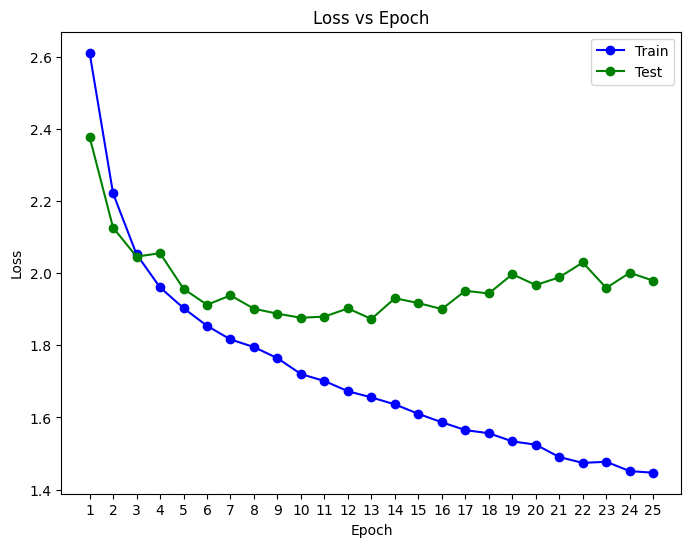

In [ ]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [ ]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.272810,0.177858,0.205963,0.393574,0.272810,0.177858,0.234720,0.245000
4,tomato-diseased,0.736080,0.873868,0.422265,0.404469,0.736080,0.873868,0.536663,0.552988
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.067568,0.000000,0.058939,0.000000,0.067568,0.000000,0.062959,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.219246,0.346642,0.448468,0.533520,0.219246,0.346642,0.294512,0.420242
4,tomato-diseased,0.890297,0.916113,0.404220,0.405557,0.890297,0.916113,0.556001,0.562222
5,grape-diseased,0.181443,0.250000,0.586667,0.590909,0.181443,0.250000,0.277165,0.351351
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.444394,0.544465,0.510960,0.554529,0.444394,0.544465,0.475358,0.549451
4,tomato-diseased,0.880640,0.858781,0.427765,0.417792,0.880640,0.858781,0.575826,0.562117
5,grape-diseased,0.518213,0.585165,0.578221,0.467105,0.518213,0.585165,0.546575,0.519512
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.547435,0.310345,0.558592,0.492795,0.547435,0.310345,0.552957,0.380846
4,tomato-diseased,0.870379,0.840676,0.434697,0.407191,0.870379,0.840676,0.579815,0.548641
5,grape-diseased,0.592440,0.730769,0.595304,0.429725,0.592440,0.730769,0.593868,0.541200
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.078775,0.289474,0.972973,1.000000,0.078775,0.289474,0.145749,0.448980
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.550159,0.578947,0.602386,0.553819,0.550159,0.578947,0.575089,0.566105
4,tomato-diseased,0.882601,0.839469,0.435453,0.449144,0.882601,0.839469,0.583180,0.585191
5,grape-diseased,0.654983,0.631868,0.630291,0.647887,0.654983,0.631868,0.642400,0.639777
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.319475,0.535088,0.890244,0.734940,0.319475,0.535088,0.470209,0.619289
1,squash-diseased,0.002725,0.005435,0.666667,0.083333,0.002725,0.005435,0.005427,0.010204
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.563323,0.615245,0.618953,0.602131,0.563323,0.615245,0.589829,0.608618
4,tomato-diseased,0.888637,0.841883,0.447153,0.444692,0.888637,0.841883,0.594939,0.581977
5,grape-diseased,0.713402,0.678571,0.641533,0.628499,0.713402,0.678571,0.675561,0.652576
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.396061,0.473684,0.804444,0.843750,0.396061,0.473684,0.530792,0.606742
1,squash-diseased,0.009537,0.000000,0.134615,0.000000,0.009537,0.000000,0.017812,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.565592,0.633394,0.637993,0.556619,0.565592,0.633394,0.599615,0.592530
4,tomato-diseased,0.886827,0.846711,0.448523,0.426055,0.886827,0.846711,0.595743,0.566869
5,grape-diseased,0.698282,0.519231,0.672402,0.687273,0.698282,0.519231,0.685098,0.591549
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.400438,0.517544,0.768908,0.686047,0.400438,0.517544,0.526619,0.590000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.595552,0.520871,0.663968,0.661290,0.595552,0.520871,0.627901,0.582741
4,tomato-diseased,0.884261,0.891973,0.453034,0.434706,0.884261,0.891973,0.599121,0.584536
5,grape-diseased,0.683161,0.601648,0.668910,0.697452,0.683161,0.601648,0.675961,0.646018
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.420131,0.482456,0.735632,0.639535,0.420131,0.482456,0.534819,0.550000
1,squash-diseased,0.012262,0.027174,0.300000,0.178571,0.012262,0.027174,0.023560,0.047170
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.591466,0.553539,0.667520,0.699541,0.591466,0.553539,0.627196,0.618034
4,tomato-diseased,0.887128,0.843693,0.460917,0.453014,0.887128,0.843693,0.606645,0.589500
5,grape-diseased,0.729897,0.758242,0.689163,0.596112,0.729897,0.758242,0.708945,0.667473
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.439825,0.517544,0.744444,0.678161,0.439825,0.517544,0.552957,0.587065
1,squash-diseased,0.020436,0.021739,0.192308,0.333333,0.020436,0.021739,0.036946,0.040816
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.627326,0.598911,0.681124,0.657371,0.627326,0.598911,0.653119,0.626781
4,tomato-diseased,0.890146,0.867833,0.464927,0.449797,0.890146,0.867833,0.610821,0.592501
5,grape-diseased,0.751203,0.645604,0.670964,0.679191,0.751203,0.645604,0.708820,0.661972
6,blueberry-healthy,0.006656,0.026667,0.500000,0.444444,0.006656,0.026667,0.013136,0.050314
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.437637,0.517544,0.727273,0.595960,0.437637,0.517544,0.546448,0.553991
1,squash-diseased,0.058583,0.021739,0.288591,0.222222,0.058583,0.021739,0.097395,0.039604
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.606446,0.573503,0.681981,0.666667,0.606446,0.573503,0.641999,0.616585
4,tomato-diseased,0.891354,0.838865,0.464752,0.463333,0.891354,0.838865,0.610953,0.596951
5,grape-diseased,0.759450,0.763736,0.692790,0.575569,0.759450,0.763736,0.724590,0.656434
6,blueberry-healthy,0.021631,0.000000,0.433333,0.000000,0.021631,0.000000,0.041204,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.448578,0.403509,0.726950,0.807018,0.448578,0.403509,0.554804,0.538012
1,squash-diseased,0.053134,0.027174,0.234940,0.227273,0.053134,0.027174,0.086667,0.048544
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.615524,0.691470,0.691484,0.560294,0.615524,0.691470,0.651297,0.619009
4,tomato-diseased,0.892712,0.819553,0.469226,0.442489,0.892712,0.819553,0.615129,0.574693
5,grape-diseased,0.782818,0.659341,0.706138,0.666667,0.782818,0.659341,0.742503,0.662983
6,blueberry-healthy,0.044925,0.000000,0.350649,0.000000,0.044925,0.000000,0.079646,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.439825,0.500000,0.744444,0.647727,0.439825,0.500000,0.552957,0.564356
1,squash-diseased,0.072207,0.086957,0.263682,0.231884,0.072207,0.086957,0.113369,0.126482
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.632774,0.722323,0.703330,0.587021,0.632774,0.722323,0.666189,0.647681
4,tomato-diseased,0.895730,0.805673,0.469286,0.470236,0.895730,0.805673,0.615895,0.593861
5,grape-diseased,0.775945,0.711538,0.714557,0.628641,0.775945,0.711538,0.743987,0.667526
6,blueberry-healthy,0.049917,0.073333,0.340909,0.440000,0.049917,0.073333,0.087083,0.125714
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.485777,0.447368,0.720779,0.560440,0.485777,0.447368,0.580392,0.497561
1,squash-diseased,0.117166,0.119565,0.325758,0.268293,0.117166,0.119565,0.172345,0.165414
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.646391,0.535390,0.699754,0.583004,0.646391,0.535390,0.672015,0.558184
4,tomato-diseased,0.897691,0.823778,0.477333,0.457746,0.897691,0.823778,0.623258,0.588489
5,grape-diseased,0.778694,0.703297,0.707683,0.612440,0.778694,0.703297,0.741492,0.654731
6,blueberry-healthy,0.129784,0.173333,0.408377,0.337662,0.129784,0.173333,0.196970,0.229075
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.483589,0.429825,0.708333,0.662162,0.483589,0.429825,0.574772,0.521277
1,squash-diseased,0.153951,0.097826,0.302949,0.200000,0.153951,0.097826,0.204155,0.131387
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.666364,0.535390,0.695076,0.766234,0.666364,0.535390,0.680417,0.630342
4,tomato-diseased,0.893164,0.857574,0.483460,0.460765,0.893164,0.857574,0.627345,0.599452
5,grape-diseased,0.804124,0.706044,0.719557,0.625304,0.804124,0.706044,0.759494,0.663226
6,blueberry-healthy,0.116473,0.020000,0.353535,0.428571,0.116473,0.020000,0.175219,0.038217
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.470460,0.491228,0.707237,0.602151,0.470460,0.491228,0.565046,0.541063
1,squash-diseased,0.197548,0.130435,0.332569,0.230769,0.197548,0.130435,0.247863,0.166667
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.655470,0.667877,0.699952,0.602291,0.655470,0.667877,0.676981,0.633391
4,tomato-diseased,0.893919,0.814725,0.483947,0.470219,0.893919,0.814725,0.627941,0.596290
5,grape-diseased,0.810309,0.708791,0.729579,0.638614,0.810309,0.708791,0.767828,0.671875
6,blueberry-healthy,0.139767,0.120000,0.380091,0.439024,0.139767,0.120000,0.204380,0.188482
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.501094,0.491228,0.738710,0.583333,0.501094,0.491228,0.597132,0.533333
1,squash-diseased,0.174387,0.173913,0.311436,0.278261,0.174387,0.173913,0.223581,0.214047
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.672719,0.716878,0.708075,0.564286,0.672719,0.716878,0.689944,0.631495
4,tomato-diseased,0.899502,0.790585,0.491143,0.477231,0.899502,0.790585,0.635366,0.595184
5,grape-diseased,0.812371,0.766484,0.734618,0.568228,0.812371,0.766484,0.771540,0.652632
6,blueberry-healthy,0.171381,0.193333,0.399225,0.371795,0.171381,0.193333,0.239814,0.254386
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.004505,0.000000,0.500000,0.000000,0.004505,0.000000,0.008929,0.000000


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.507659,0.482456,0.711656,0.561224,0.507659,0.482456,0.592593,0.518868
1,squash-diseased,0.262943,0.228261,0.327674,0.323077,0.262943,0.228261,0.291761,0.267516
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.661371,0.686025,0.714917,0.569277,0.661371,0.686025,0.687102,0.622222
4,tomato-diseased,0.901011,0.808690,0.495067,0.479085,0.901011,0.808690,0.639020,0.601706
5,grape-diseased,0.809622,0.717033,0.715240,0.611241,0.809622,0.717033,0.759510,0.659924
6,blueberry-healthy,0.188020,0.166667,0.385666,0.446429,0.188020,0.166667,0.252796,0.242718
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.011261,0.018018,0.227273,0.500000,0.011261,0.018018,0.021459,0.034783


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.503282,0.508772,0.721003,0.666667,0.503282,0.508772,0.592784,0.577114
1,squash-diseased,0.336512,0.244565,0.353868,0.269461,0.336512,0.244565,0.344972,0.256410
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.682705,0.725953,0.711111,0.562588,0.682705,0.725953,0.696619,0.633914
4,tomato-diseased,0.895126,0.816536,0.501268,0.464470,0.895126,0.816536,0.642652,0.592123
5,grape-diseased,0.816495,0.739011,0.735148,0.588621,0.816495,0.739011,0.773689,0.655298
6,blueberry-healthy,0.202995,0.086667,0.422145,0.250000,0.202995,0.086667,0.274157,0.128713
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.005076,0.000000,0.200000,0.000000,0.005076,0.000000,0.009901,0.000000
9,strawberry-diseased,0.015766,0.000000,0.175000,0.000000,0.015766,0.000000,0.028926,0.000000


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.518600,0.456140,0.784768,0.626506,0.518600,0.456140,0.624506,0.527919
1,squash-diseased,0.341962,0.293478,0.348611,0.296703,0.341962,0.293478,0.345254,0.295082
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.672719,0.646098,0.705378,0.628975,0.672719,0.646098,0.688662,0.637422
4,tomato-diseased,0.894372,0.830416,0.500718,0.480279,0.894372,0.830416,0.642006,0.608580
5,grape-diseased,0.823368,0.722527,0.734969,0.618824,0.823368,0.722527,0.776661,0.666667
6,blueberry-healthy,0.209651,0.186667,0.403846,0.378378,0.209651,0.186667,0.276013,0.250000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.006768,0.000000,0.190476,0.000000,0.006768,0.000000,0.013072,0.000000
9,strawberry-diseased,0.018018,0.009009,0.142857,0.071429,0.018018,0.009009,0.032000,0.016000


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.518600,0.482456,0.766990,0.611111,0.518600,0.482456,0.618799,0.539216
1,squash-diseased,0.348774,0.402174,0.344549,0.218289,0.348774,0.402174,0.346649,0.282983
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.687245,0.667877,0.709798,0.586922,0.687245,0.667877,0.698339,0.624788
4,tomato-diseased,0.895126,0.783947,0.511512,0.475650,0.895126,0.783947,0.651010,0.592069
5,grape-diseased,0.836426,0.640110,0.734460,0.649025,0.836426,0.640110,0.782134,0.644537
6,blueberry-healthy,0.236273,0.246667,0.410405,0.303279,0.236273,0.246667,0.299894,0.272059
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.010152,0.000000,0.272727,0.000000,0.010152,0.000000,0.019576,0.000000
9,strawberry-diseased,0.047297,0.036036,0.244186,0.117647,0.047297,0.036036,0.079245,0.055172


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.525164,0.535088,0.733945,0.603960,0.525164,0.535088,0.612245,0.567442
1,squash-diseased,0.419619,0.304348,0.343367,0.259259,0.419619,0.304348,0.377682,0.280000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.694054,0.664247,0.714820,0.642105,0.694054,0.664247,0.704284,0.652988
4,tomato-diseased,0.890448,0.843693,0.517632,0.471819,0.890448,0.843693,0.654685,0.605195
5,grape-diseased,0.832990,0.653846,0.734991,0.664804,0.832990,0.653846,0.780928,0.659280
6,blueberry-healthy,0.276206,0.226667,0.443850,0.395349,0.276206,0.226667,0.340513,0.288136
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.020305,0.000000,0.324324,0.000000,0.020305,0.000000,0.038217,0.000000
9,strawberry-diseased,0.083333,0.036036,0.318966,0.153846,0.083333,0.036036,0.132143,0.058394


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.518600,0.508772,0.782178,0.644444,0.518600,0.508772,0.623684,0.568627
1,squash-diseased,0.434605,0.353261,0.366246,0.250965,0.434605,0.353261,0.397508,0.293454
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.705402,0.466425,0.713826,0.758112,0.705402,0.466425,0.709589,0.577528
4,tomato-diseased,0.890750,0.823174,0.516358,0.472299,0.890750,0.823174,0.653746,0.600220
5,grape-diseased,0.818557,0.747253,0.743446,0.570231,0.818557,0.747253,0.779195,0.646849
6,blueberry-healthy,0.262895,0.180000,0.420213,0.313953,0.262895,0.180000,0.323439,0.228814
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.008460,0.006757,0.142857,0.125000,0.008460,0.006757,0.015974,0.012821
9,strawberry-diseased,0.092342,0.036036,0.232955,0.173913,0.092342,0.036036,0.132258,0.059701


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.547046,0.491228,0.806452,0.643678,0.547046,0.491228,0.651890,0.557214
1,squash-diseased,0.427793,0.336957,0.358447,0.253061,0.427793,0.336957,0.390062,0.289044
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.703586,0.682396,0.721266,0.601600,0.703586,0.682396,0.712316,0.639456
4,tomato-diseased,0.896182,0.776705,0.523999,0.492161,0.896182,0.776705,0.661322,0.602528
5,grape-diseased,0.848797,0.788462,0.715113,0.521818,0.848797,0.788462,0.776241,0.628009
6,blueberry-healthy,0.256240,0.193333,0.451613,0.318681,0.256240,0.193333,0.326964,0.240664
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.015228,0.000000,0.140625,0.000000,0.015228,0.000000,0.027481,0.000000
9,strawberry-diseased,0.155405,0.036036,0.278226,0.095238,0.155405,0.036036,0.199422,0.052288


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.566740,0.526316,0.792049,0.566038,0.566740,0.526316,0.660714,0.545455
1,squash-diseased,0.475477,0.288043,0.377706,0.253589,0.475477,0.288043,0.420989,0.269720
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.687245,0.573503,0.721640,0.682505,0.687245,0.573503,0.704022,0.623274
4,tomato-diseased,0.896031,0.828002,0.525999,0.477051,0.896031,0.828002,0.662871,0.605339
5,grape-diseased,0.839863,0.719780,0.726948,0.617925,0.839863,0.719780,0.779337,0.664975
6,blueberry-healthy,0.256240,0.206667,0.431373,0.356322,0.256240,0.206667,0.321503,0.261603
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.025381,0.013514,0.234375,0.046512,0.025381,0.013514,0.045802,0.020942
9,strawberry-diseased,0.177928,0.045045,0.312253,0.119048,0.177928,0.045045,0.226686,0.065359


#### AUROC

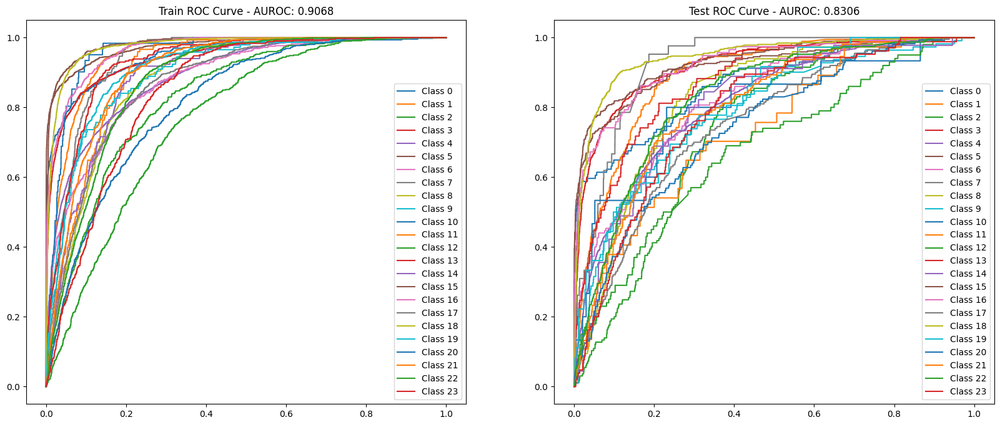

In [ ]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

#### Liberación de memoria

In [ ]:
del classifier_model_2

with torch.no_grad():
    torch.cuda.empty_cache()

## Entrenamiento del Clasificador con Autoencoder congelado

In [ ]:
classifier_model_2 = Classifier(input_features=27, encoder_model=autoencoder_model_2, freeze_weights=True).to(device)

classifier_loss_fn_2 = nn.CrossEntropyLoss()
classifier_optimizer_2 = torch.optim.Adam(classifier_model_2.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader_2 = DataLoader(
    train_dataset_2, batch_size=batch_size, shuffle=True)

classifier_test_dataloader_2 = DataLoader(
    test_dataset_2, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader_2, classifier_model_2, classifier_loss_fn_2, classifier_optimizer_2)
    test_loss = test(classifier_test_dataloader_2, classifier_model_2, classifier_loss_fn_2)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.280966  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.302655  [  352/22179]
Current Loss: 3.310764  [  672/22179]
Current Loss: 3.300272  [  992/22179]
Current Loss: 3.290119  [ 1312/22179]
Current Loss: 3.280236  [ 1632/22179]
Current Loss: 3.277072  [ 1952/22179]
Current Loss: 3.272970  [ 2272/22179]
Current Loss: 3.270026  [ 2592/22179]
Current Loss: 3.263498  [ 2912/22179]
Current Loss: 3.260034  [ 3232/22179]
Current Loss: 3.253269  [ 3552/22179]
Current Loss: 3.247518  [ 3872/22179]
Current Loss: 3.242520  [ 4192/22179]
Current Loss: 3.236773  [ 4512/22179]
Current Loss: 3.230042  [ 4832/22179]
Current Loss: 3.226302  [ 5152/22179]
Current Loss: 3.218292  [ 5472/22179]
Current Loss: 3.214716  [ 5792/22179]
Current Loss: 3.208070  [ 6112/22179]
Current Loss: 3.202658  [ 6432/22179]
Current Loss: 3.195481  [ 6752/22179]
Current Loss: 3.188297  [ 7072/22179]
Current Loss: 3.182898  [ 7392/22179]
Current Loss: 3.172675  [ 7712/22179]
Current Loss: 3.162319  [ 8032/22179]
Current Loss: 3.152051  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.999397,0.299457,0.999397,0.460832
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.006757,0.250000,0.006757,0.013158
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.416117  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.667909  [  352/22179]
Current Loss: 2.662076  [  672/22179]
Current Loss: 2.626794  [  992/22179]
Current Loss: 2.620523  [ 1312/22179]
Current Loss: 2.600695  [ 1632/22179]
Current Loss: 2.579968  [ 1952/22179]
Current Loss: 2.591878  [ 2272/22179]
Current Loss: 2.591180  [ 2592/22179]
Current Loss: 2.585575  [ 2912/22179]
Current Loss: 2.574531  [ 3232/22179]
Current Loss: 2.579128  [ 3552/22179]
Current Loss: 2.576378  [ 3872/22179]
Current Loss: 2.572508  [ 4192/22179]
Current Loss: 2.574646  [ 4512/22179]
Current Loss: 2.585844  [ 4832/22179]
Current Loss: 2.587310  [ 5152/22179]
Current Loss: 2.585611  [ 5472/22179]
Current Loss: 2.586580  [ 5792/22179]
Current Loss: 2.584312  [ 6112/22179]
Current Loss: 2.590353  [ 6432/22179]
Current Loss: 2.584573  [ 6752/22179]
Current Loss: 2.586483  [ 7072/22179]
Current Loss: 2.586350  [ 7392/22179]
Current Loss: 2.583704  [ 7712/22179]
Current Loss: 2.584934  [ 8032/22179]
Current Loss: 2.582318  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.998190,0.301440,0.998190,0.463046
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.013514,0.117647,0.013514,0.024242
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.480641  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.401470  [  352/22179]
Current Loss: 2.475395  [  672/22179]
Current Loss: 2.503274  [  992/22179]
Current Loss: 2.499886  [ 1312/22179]
Current Loss: 2.492475  [ 1632/22179]
Current Loss: 2.494945  [ 1952/22179]
Current Loss: 2.496340  [ 2272/22179]
Current Loss: 2.505042  [ 2592/22179]
Current Loss: 2.517621  [ 2912/22179]
Current Loss: 2.517097  [ 3232/22179]
Current Loss: 2.524427  [ 3552/22179]
Current Loss: 2.522255  [ 3872/22179]
Current Loss: 2.525762  [ 4192/22179]
Current Loss: 2.526191  [ 4512/22179]
Current Loss: 2.519823  [ 4832/22179]
Current Loss: 2.513720  [ 5152/22179]
Current Loss: 2.517750  [ 5472/22179]
Current Loss: 2.519337  [ 5792/22179]
Current Loss: 2.518255  [ 6112/22179]
Current Loss: 2.517853  [ 6432/22179]
Current Loss: 2.519242  [ 6752/22179]
Current Loss: 2.525278  [ 7072/22179]
Current Loss: 2.529079  [ 7392/22179]
Current Loss: 2.528399  [ 7712/22179]
Current Loss: 2.527036  [ 8032/22179]
Current Loss: 2.530706  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.990344,0.309273,0.990344,0.471349
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.114865,0.093407,0.114865,0.103030
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.594177  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.535476  [  352/22179]
Current Loss: 2.513963  [  672/22179]
Current Loss: 2.512145  [  992/22179]
Current Loss: 2.511792  [ 1312/22179]
Current Loss: 2.494925  [ 1632/22179]
Current Loss: 2.497448  [ 1952/22179]
Current Loss: 2.502543  [ 2272/22179]
Current Loss: 2.507531  [ 2592/22179]
Current Loss: 2.510810  [ 2912/22179]
Current Loss: 2.519543  [ 3232/22179]
Current Loss: 2.518228  [ 3552/22179]
Current Loss: 2.531108  [ 3872/22179]
Current Loss: 2.524887  [ 4192/22179]
Current Loss: 2.524399  [ 4512/22179]
Current Loss: 2.528833  [ 4832/22179]
Current Loss: 2.522244  [ 5152/22179]
Current Loss: 2.525594  [ 5472/22179]
Current Loss: 2.524897  [ 5792/22179]
Current Loss: 2.526556  [ 6112/22179]
Current Loss: 2.522437  [ 6432/22179]
Current Loss: 2.519689  [ 6752/22179]
Current Loss: 2.518608  [ 7072/22179]
Current Loss: 2.518785  [ 7392/22179]
Current Loss: 2.517313  [ 7712/22179]
Current Loss: 2.520611  [ 8032/22179]
Current Loss: 2.516421  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.990344,0.310091,0.990344,0.472298
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.047297,0.112903,0.047297,0.066667
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.555705  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.479186  [  352/22179]
Current Loss: 2.480154  [  672/22179]
Current Loss: 2.469279  [  992/22179]
Current Loss: 2.488220  [ 1312/22179]
Current Loss: 2.493411  [ 1632/22179]
Current Loss: 2.479578  [ 1952/22179]
Current Loss: 2.482880  [ 2272/22179]
Current Loss: 2.494663  [ 2592/22179]
Current Loss: 2.500774  [ 2912/22179]
Current Loss: 2.493731  [ 3232/22179]
Current Loss: 2.492198  [ 3552/22179]
Current Loss: 2.488735  [ 3872/22179]
Current Loss: 2.484423  [ 4192/22179]
Current Loss: 2.479090  [ 4512/22179]
Current Loss: 2.471540  [ 4832/22179]
Current Loss: 2.479061  [ 5152/22179]
Current Loss: 2.480593  [ 5472/22179]
Current Loss: 2.482300  [ 5792/22179]
Current Loss: 2.483772  [ 6112/22179]
Current Loss: 2.489593  [ 6432/22179]
Current Loss: 2.490274  [ 6752/22179]
Current Loss: 2.489407  [ 7072/22179]
Current Loss: 2.488116  [ 7392/22179]
Current Loss: 2.489000  [ 7712/22179]
Current Loss: 2.487813  [ 8032/22179]
Current Loss: 2.490326  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.975860,0.336454,0.975860,0.500387
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.701545  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.550917  [  352/22179]
Current Loss: 2.524252  [  672/22179]
Current Loss: 2.526973  [  992/22179]
Current Loss: 2.530248  [ 1312/22179]
Current Loss: 2.511375  [ 1632/22179]
Current Loss: 2.502434  [ 1952/22179]
Current Loss: 2.495976  [ 2272/22179]
Current Loss: 2.503457  [ 2592/22179]
Current Loss: 2.495136  [ 2912/22179]
Current Loss: 2.485275  [ 3232/22179]
Current Loss: 2.484009  [ 3552/22179]
Current Loss: 2.485273  [ 3872/22179]
Current Loss: 2.487056  [ 4192/22179]
Current Loss: 2.483477  [ 4512/22179]
Current Loss: 2.482453  [ 4832/22179]
Current Loss: 2.480570  [ 5152/22179]
Current Loss: 2.479315  [ 5472/22179]
Current Loss: 2.474557  [ 5792/22179]
Current Loss: 2.473391  [ 6112/22179]
Current Loss: 2.473619  [ 6432/22179]
Current Loss: 2.473838  [ 6752/22179]
Current Loss: 2.472180  [ 7072/22179]
Current Loss: 2.475356  [ 7392/22179]
Current Loss: 2.477071  [ 7712/22179]
Current Loss: 2.474633  [ 8032/22179]
Current Loss: 2.476057  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.953530,0.372817,0.953530,0.536048
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.467575  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.556532  [  352/22179]
Current Loss: 2.536422  [  672/22179]
Current Loss: 2.498454  [  992/22179]
Current Loss: 2.476516  [ 1312/22179]
Current Loss: 2.468451  [ 1632/22179]
Current Loss: 2.472493  [ 1952/22179]
Current Loss: 2.460880  [ 2272/22179]
Current Loss: 2.463878  [ 2592/22179]
Current Loss: 2.460661  [ 2912/22179]
Current Loss: 2.466327  [ 3232/22179]
Current Loss: 2.462734  [ 3552/22179]
Current Loss: 2.457990  [ 3872/22179]
Current Loss: 2.454432  [ 4192/22179]
Current Loss: 2.455762  [ 4512/22179]
Current Loss: 2.447969  [ 4832/22179]
Current Loss: 2.447120  [ 5152/22179]
Current Loss: 2.439642  [ 5472/22179]
Current Loss: 2.439699  [ 5792/22179]
Current Loss: 2.443874  [ 6112/22179]
Current Loss: 2.442320  [ 6432/22179]
Current Loss: 2.440676  [ 6752/22179]
Current Loss: 2.440598  [ 7072/22179]
Current Loss: 2.438067  [ 7392/22179]
Current Loss: 2.438519  [ 7712/22179]
Current Loss: 2.438949  [ 8032/22179]
Current Loss: 2.438805  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.934218,0.386807,0.934218,0.547093
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.048996  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.378011  [  352/22179]
Current Loss: 2.458086  [  672/22179]
Current Loss: 2.428697  [  992/22179]
Current Loss: 2.433662  [ 1312/22179]
Current Loss: 2.423236  [ 1632/22179]
Current Loss: 2.430747  [ 1952/22179]
Current Loss: 2.432053  [ 2272/22179]
Current Loss: 2.434729  [ 2592/22179]
Current Loss: 2.436779  [ 2912/22179]
Current Loss: 2.436233  [ 3232/22179]
Current Loss: 2.436714  [ 3552/22179]
Current Loss: 2.434191  [ 3872/22179]
Current Loss: 2.436710  [ 4192/22179]
Current Loss: 2.437656  [ 4512/22179]
Current Loss: 2.432820  [ 4832/22179]
Current Loss: 2.428503  [ 5152/22179]
Current Loss: 2.426375  [ 5472/22179]
Current Loss: 2.426096  [ 5792/22179]
Current Loss: 2.430434  [ 6112/22179]
Current Loss: 2.429891  [ 6432/22179]
Current Loss: 2.427786  [ 6752/22179]
Current Loss: 2.426873  [ 7072/22179]
Current Loss: 2.425784  [ 7392/22179]
Current Loss: 2.424532  [ 7712/22179]
Current Loss: 2.423685  [ 8032/22179]
Current Loss: 2.425619  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.954737,0.370058,0.954737,0.533378
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.334156  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.413428  [  352/22179]
Current Loss: 2.449860  [  672/22179]
Current Loss: 2.437249  [  992/22179]
Current Loss: 2.408841  [ 1312/22179]
Current Loss: 2.406334  [ 1632/22179]
Current Loss: 2.417249  [ 1952/22179]
Current Loss: 2.425692  [ 2272/22179]
Current Loss: 2.422303  [ 2592/22179]
Current Loss: 2.411264  [ 2912/22179]
Current Loss: 2.403955  [ 3232/22179]
Current Loss: 2.403840  [ 3552/22179]
Current Loss: 2.405109  [ 3872/22179]
Current Loss: 2.403129  [ 4192/22179]
Current Loss: 2.406233  [ 4512/22179]
Current Loss: 2.403871  [ 4832/22179]
Current Loss: 2.406134  [ 5152/22179]
Current Loss: 2.402287  [ 5472/22179]
Current Loss: 2.398182  [ 5792/22179]
Current Loss: 2.398299  [ 6112/22179]
Current Loss: 2.394094  [ 6432/22179]
Current Loss: 2.389769  [ 6752/22179]
Current Loss: 2.383485  [ 7072/22179]
Current Loss: 2.377410  [ 7392/22179]
Current Loss: 2.374491  [ 7712/22179]
Current Loss: 2.373953  [ 8032/22179]
Current Loss: 2.374569  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.916113,0.391338,0.916113,0.548410
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.586346  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.423032  [  352/22179]
Current Loss: 2.435949  [  672/22179]
Current Loss: 2.383955  [  992/22179]
Current Loss: 2.352347  [ 1312/22179]
Current Loss: 2.343452  [ 1632/22179]
Current Loss: 2.328968  [ 1952/22179]
Current Loss: 2.326027  [ 2272/22179]
Current Loss: 2.325405  [ 2592/22179]
Current Loss: 2.329956  [ 2912/22179]
Current Loss: 2.338727  [ 3232/22179]
Current Loss: 2.343855  [ 3552/22179]
Current Loss: 2.343459  [ 3872/22179]
Current Loss: 2.338597  [ 4192/22179]
Current Loss: 2.337212  [ 4512/22179]
Current Loss: 2.343111  [ 4832/22179]
Current Loss: 2.341829  [ 5152/22179]
Current Loss: 2.342712  [ 5472/22179]
Current Loss: 2.333616  [ 5792/22179]
Current Loss: 2.330049  [ 6112/22179]
Current Loss: 2.327838  [ 6432/22179]
Current Loss: 2.330232  [ 6752/22179]
Current Loss: 2.327679  [ 7072/22179]
Current Loss: 2.330346  [ 7392/22179]
Current Loss: 2.329836  [ 7712/22179]
Current Loss: 2.330451  [ 8032/22179]
Current Loss: 2.327499  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.969825,0.360718,0.969825,0.525851
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.795134  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.185264  [  352/22179]
Current Loss: 2.243186  [  672/22179]
Current Loss: 2.292444  [  992/22179]
Current Loss: 2.301564  [ 1312/22179]
Current Loss: 2.306159  [ 1632/22179]
Current Loss: 2.291865  [ 1952/22179]
Current Loss: 2.292353  [ 2272/22179]
Current Loss: 2.294399  [ 2592/22179]
Current Loss: 2.307978  [ 2912/22179]
Current Loss: 2.291641  [ 3232/22179]
Current Loss: 2.288077  [ 3552/22179]
Current Loss: 2.290652  [ 3872/22179]
Current Loss: 2.293380  [ 4192/22179]
Current Loss: 2.294244  [ 4512/22179]
Current Loss: 2.288013  [ 4832/22179]
Current Loss: 2.287226  [ 5152/22179]
Current Loss: 2.287686  [ 5472/22179]
Current Loss: 2.292722  [ 5792/22179]
Current Loss: 2.287714  [ 6112/22179]
Current Loss: 2.288173  [ 6432/22179]
Current Loss: 2.281834  [ 6752/22179]
Current Loss: 2.276926  [ 7072/22179]
Current Loss: 2.277659  [ 7392/22179]
Current Loss: 2.277386  [ 7712/22179]
Current Loss: 2.274720  [ 8032/22179]
Current Loss: 2.277126  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.975860,0.353752,0.975860,0.519268
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.452102  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.310359  [  352/22179]
Current Loss: 2.326663  [  672/22179]
Current Loss: 2.316036  [  992/22179]
Current Loss: 2.298427  [ 1312/22179]
Current Loss: 2.301149  [ 1632/22179]
Current Loss: 2.296878  [ 1952/22179]
Current Loss: 2.291398  [ 2272/22179]
Current Loss: 2.292586  [ 2592/22179]
Current Loss: 2.281450  [ 2912/22179]
Current Loss: 2.277184  [ 3232/22179]
Current Loss: 2.283569  [ 3552/22179]
Current Loss: 2.282172  [ 3872/22179]
Current Loss: 2.279885  [ 4192/22179]
Current Loss: 2.272625  [ 4512/22179]
Current Loss: 2.268939  [ 4832/22179]
Current Loss: 2.267130  [ 5152/22179]
Current Loss: 2.265942  [ 5472/22179]
Current Loss: 2.259470  [ 5792/22179]
Current Loss: 2.254993  [ 6112/22179]
Current Loss: 2.259762  [ 6432/22179]
Current Loss: 2.251418  [ 6752/22179]
Current Loss: 2.248140  [ 7072/22179]
Current Loss: 2.252690  [ 7392/22179]
Current Loss: 2.252981  [ 7712/22179]
Current Loss: 2.252470  [ 8032/22179]
Current Loss: 2.251536  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.971635,0.359857,0.971635,0.525200
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.167172  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.131887  [  352/22179]
Current Loss: 2.188876  [  672/22179]
Current Loss: 2.222540  [  992/22179]
Current Loss: 2.237246  [ 1312/22179]
Current Loss: 2.230267  [ 1632/22179]
Current Loss: 2.217637  [ 1952/22179]
Current Loss: 2.218577  [ 2272/22179]
Current Loss: 2.221482  [ 2592/22179]
Current Loss: 2.228838  [ 2912/22179]
Current Loss: 2.225377  [ 3232/22179]
Current Loss: 2.225782  [ 3552/22179]
Current Loss: 2.231985  [ 3872/22179]
Current Loss: 2.240004  [ 4192/22179]
Current Loss: 2.237321  [ 4512/22179]
Current Loss: 2.242993  [ 4832/22179]
Current Loss: 2.243904  [ 5152/22179]
Current Loss: 2.249248  [ 5472/22179]
Current Loss: 2.249636  [ 5792/22179]
Current Loss: 2.250494  [ 6112/22179]
Current Loss: 2.247148  [ 6432/22179]
Current Loss: 2.250275  [ 6752/22179]
Current Loss: 2.253315  [ 7072/22179]
Current Loss: 2.250915  [ 7392/22179]
Current Loss: 2.251050  [ 7712/22179]
Current Loss: 2.252635  [ 8032/22179]
Current Loss: 2.252359  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.023593,0.245283,0.023593,0.043046
4,tomato-diseased,0.969221,0.354447,0.969221,0.519069
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.084195  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.303245  [  352/22179]
Current Loss: 2.250189  [  672/22179]
Current Loss: 2.235479  [  992/22179]
Current Loss: 2.207815  [ 1312/22179]
Current Loss: 2.187603  [ 1632/22179]
Current Loss: 2.206851  [ 1952/22179]
Current Loss: 2.208913  [ 2272/22179]
Current Loss: 2.209230  [ 2592/22179]
Current Loss: 2.200382  [ 2912/22179]
Current Loss: 2.204484  [ 3232/22179]
Current Loss: 2.206960  [ 3552/22179]
Current Loss: 2.213478  [ 3872/22179]
Current Loss: 2.213024  [ 4192/22179]
Current Loss: 2.218149  [ 4512/22179]
Current Loss: 2.224230  [ 4832/22179]
Current Loss: 2.227715  [ 5152/22179]
Current Loss: 2.229913  [ 5472/22179]
Current Loss: 2.232144  [ 5792/22179]
Current Loss: 2.234238  [ 6112/22179]
Current Loss: 2.230841  [ 6432/22179]
Current Loss: 2.231713  [ 6752/22179]
Current Loss: 2.232667  [ 7072/22179]
Current Loss: 2.234691  [ 7392/22179]
Current Loss: 2.233695  [ 7712/22179]
Current Loss: 2.234742  [ 8032/22179]
Current Loss: 2.232442  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.965600,0.357942,0.965600,0.522278
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.534354  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.259853  [  352/22179]
Current Loss: 2.258398  [  672/22179]
Current Loss: 2.235944  [  992/22179]
Current Loss: 2.262538  [ 1312/22179]
Current Loss: 2.256213  [ 1632/22179]
Current Loss: 2.260905  [ 1952/22179]
Current Loss: 2.239654  [ 2272/22179]
Current Loss: 2.242588  [ 2592/22179]
Current Loss: 2.237548  [ 2912/22179]
Current Loss: 2.232920  [ 3232/22179]
Current Loss: 2.234820  [ 3552/22179]
Current Loss: 2.232963  [ 3872/22179]
Current Loss: 2.230197  [ 4192/22179]
Current Loss: 2.222210  [ 4512/22179]
Current Loss: 2.221798  [ 4832/22179]
Current Loss: 2.220726  [ 5152/22179]
Current Loss: 2.221652  [ 5472/22179]
Current Loss: 2.225849  [ 5792/22179]
Current Loss: 2.227061  [ 6112/22179]
Current Loss: 2.230706  [ 6432/22179]
Current Loss: 2.232266  [ 6752/22179]
Current Loss: 2.230491  [ 7072/22179]
Current Loss: 2.225321  [ 7392/22179]
Current Loss: 2.217906  [ 7712/22179]
Current Loss: 2.221993  [ 8032/22179]
Current Loss: 2.220984  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.001815,0.125000,0.001815,0.003578
4,tomato-diseased,0.966204,0.356491,0.966204,0.520820
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.031932  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.180650  [  352/22179]
Current Loss: 2.210477  [  672/22179]
Current Loss: 2.233137  [  992/22179]
Current Loss: 2.247558  [ 1312/22179]
Current Loss: 2.241612  [ 1632/22179]
Current Loss: 2.249703  [ 1952/22179]
Current Loss: 2.256986  [ 2272/22179]
Current Loss: 2.262759  [ 2592/22179]
Current Loss: 2.268093  [ 2912/22179]
Current Loss: 2.277006  [ 3232/22179]
Current Loss: 2.274367  [ 3552/22179]
Current Loss: 2.274202  [ 3872/22179]
Current Loss: 2.280916  [ 4192/22179]
Current Loss: 2.276881  [ 4512/22179]
Current Loss: 2.270999  [ 4832/22179]
Current Loss: 2.265568  [ 5152/22179]
Current Loss: 2.261305  [ 5472/22179]
Current Loss: 2.266741  [ 5792/22179]
Current Loss: 2.262567  [ 6112/22179]
Current Loss: 2.257110  [ 6432/22179]
Current Loss: 2.259060  [ 6752/22179]
Current Loss: 2.258462  [ 7072/22179]
Current Loss: 2.258223  [ 7392/22179]
Current Loss: 2.259192  [ 7712/22179]
Current Loss: 2.260857  [ 8032/22179]
Current Loss: 2.263647  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.007260,0.333333,0.007260,0.014210
4,tomato-diseased,0.971032,0.358272,0.971032,0.523422
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.300785  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.167697  [  352/22179]
Current Loss: 2.211920  [  672/22179]
Current Loss: 2.219909  [  992/22179]
Current Loss: 2.237060  [ 1312/22179]
Current Loss: 2.241315  [ 1632/22179]
Current Loss: 2.233122  [ 1952/22179]
Current Loss: 2.241437  [ 2272/22179]
Current Loss: 2.222634  [ 2592/22179]
Current Loss: 2.216806  [ 2912/22179]
Current Loss: 2.209069  [ 3232/22179]
Current Loss: 2.216647  [ 3552/22179]
Current Loss: 2.217410  [ 3872/22179]
Current Loss: 2.213963  [ 4192/22179]
Current Loss: 2.226311  [ 4512/22179]
Current Loss: 2.227986  [ 4832/22179]
Current Loss: 2.228863  [ 5152/22179]
Current Loss: 2.231839  [ 5472/22179]
Current Loss: 2.231130  [ 5792/22179]
Current Loss: 2.234391  [ 6112/22179]
Current Loss: 2.239249  [ 6432/22179]
Current Loss: 2.242241  [ 6752/22179]
Current Loss: 2.246915  [ 7072/22179]
Current Loss: 2.245128  [ 7392/22179]
Current Loss: 2.245327  [ 7712/22179]
Current Loss: 2.246636  [ 8032/22179]
Current Loss: 2.247887  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.056261,0.289720,0.056261,0.094225
4,tomato-diseased,0.958358,0.354148,0.958358,0.517180
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.245303  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.280849  [  352/22179]
Current Loss: 2.297729  [  672/22179]
Current Loss: 2.266219  [  992/22179]
Current Loss: 2.267537  [ 1312/22179]
Current Loss: 2.258803  [ 1632/22179]
Current Loss: 2.230305  [ 1952/22179]
Current Loss: 2.224758  [ 2272/22179]
Current Loss: 2.228241  [ 2592/22179]
Current Loss: 2.230051  [ 2912/22179]
Current Loss: 2.215102  [ 3232/22179]
Current Loss: 2.223169  [ 3552/22179]
Current Loss: 2.231379  [ 3872/22179]
Current Loss: 2.231371  [ 4192/22179]
Current Loss: 2.234532  [ 4512/22179]
Current Loss: 2.238819  [ 4832/22179]
Current Loss: 2.231792  [ 5152/22179]
Current Loss: 2.230272  [ 5472/22179]
Current Loss: 2.230550  [ 5792/22179]
Current Loss: 2.242473  [ 6112/22179]
Current Loss: 2.245099  [ 6432/22179]
Current Loss: 2.241537  [ 6752/22179]
Current Loss: 2.244313  [ 7072/22179]
Current Loss: 2.242147  [ 7392/22179]
Current Loss: 2.246276  [ 7712/22179]
Current Loss: 2.243737  [ 8032/22179]
Current Loss: 2.239073  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.165154,0.395652,0.165154,0.233035
4,tomato-diseased,0.934822,0.370486,0.934822,0.530661
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.236907  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.286476  [  352/22179]
Current Loss: 2.285012  [  672/22179]
Current Loss: 2.285704  [  992/22179]
Current Loss: 2.261277  [ 1312/22179]
Current Loss: 2.290692  [ 1632/22179]
Current Loss: 2.292144  [ 1952/22179]
Current Loss: 2.295778  [ 2272/22179]
Current Loss: 2.291525  [ 2592/22179]
Current Loss: 2.280631  [ 2912/22179]
Current Loss: 2.282704  [ 3232/22179]
Current Loss: 2.281791  [ 3552/22179]
Current Loss: 2.283074  [ 3872/22179]
Current Loss: 2.280612  [ 4192/22179]
Current Loss: 2.270946  [ 4512/22179]
Current Loss: 2.266805  [ 4832/22179]
Current Loss: 2.266013  [ 5152/22179]
Current Loss: 2.262867  [ 5472/22179]
Current Loss: 2.262048  [ 5792/22179]
Current Loss: 2.259672  [ 6112/22179]
Current Loss: 2.255680  [ 6432/22179]
Current Loss: 2.261325  [ 6752/22179]
Current Loss: 2.260262  [ 7072/22179]
Current Loss: 2.261168  [ 7392/22179]
Current Loss: 2.259270  [ 7712/22179]
Current Loss: 2.259472  [ 8032/22179]
Current Loss: 2.261631  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.014519,0.258065,0.014519,0.027491
4,tomato-diseased,0.940857,0.368558,0.940857,0.529642
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.042034  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.194008  [  352/22179]
Current Loss: 2.170969  [  672/22179]
Current Loss: 2.207487  [  992/22179]
Current Loss: 2.195105  [ 1312/22179]
Current Loss: 2.183188  [ 1632/22179]
Current Loss: 2.205124  [ 1952/22179]
Current Loss: 2.209891  [ 2272/22179]
Current Loss: 2.208360  [ 2592/22179]
Current Loss: 2.216320  [ 2912/22179]
Current Loss: 2.213660  [ 3232/22179]
Current Loss: 2.221501  [ 3552/22179]
Current Loss: 2.221664  [ 3872/22179]
Current Loss: 2.225534  [ 4192/22179]
Current Loss: 2.225981  [ 4512/22179]
Current Loss: 2.227142  [ 4832/22179]
Current Loss: 2.235897  [ 5152/22179]
Current Loss: 2.240194  [ 5472/22179]
Current Loss: 2.239970  [ 5792/22179]
Current Loss: 2.246297  [ 6112/22179]
Current Loss: 2.241687  [ 6432/22179]
Current Loss: 2.242070  [ 6752/22179]
Current Loss: 2.241196  [ 7072/22179]
Current Loss: 2.244820  [ 7392/22179]
Current Loss: 2.247379  [ 7712/22179]
Current Loss: 2.247941  [ 8032/22179]
Current Loss: 2.252417  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.186933,0.402344,0.186933,0.255266
4,tomato-diseased,0.941460,0.360277,0.941460,0.521129
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.335555  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.155575  [  352/22179]
Current Loss: 2.126825  [  672/22179]
Current Loss: 2.159209  [  992/22179]
Current Loss: 2.164881  [ 1312/22179]
Current Loss: 2.160453  [ 1632/22179]
Current Loss: 2.178559  [ 1952/22179]
Current Loss: 2.187203  [ 2272/22179]
Current Loss: 2.214387  [ 2592/22179]
Current Loss: 2.216054  [ 2912/22179]
Current Loss: 2.219863  [ 3232/22179]
Current Loss: 2.225717  [ 3552/22179]
Current Loss: 2.226859  [ 3872/22179]
Current Loss: 2.229840  [ 4192/22179]
Current Loss: 2.224588  [ 4512/22179]
Current Loss: 2.220815  [ 4832/22179]
Current Loss: 2.219559  [ 5152/22179]
Current Loss: 2.221859  [ 5472/22179]
Current Loss: 2.220775  [ 5792/22179]
Current Loss: 2.217912  [ 6112/22179]
Current Loss: 2.219291  [ 6432/22179]
Current Loss: 2.228707  [ 6752/22179]
Current Loss: 2.227332  [ 7072/22179]
Current Loss: 2.225620  [ 7392/22179]
Current Loss: 2.228338  [ 7712/22179]
Current Loss: 2.227498  [ 8032/22179]
Current Loss: 2.231388  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.023593,0.250000,0.023593,0.043118
4,tomato-diseased,0.951117,0.363301,0.951117,0.525771
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.142247  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.214922  [  352/22179]
Current Loss: 2.209882  [  672/22179]
Current Loss: 2.239408  [  992/22179]
Current Loss: 2.258549  [ 1312/22179]
Current Loss: 2.253658  [ 1632/22179]
Current Loss: 2.240963  [ 1952/22179]
Current Loss: 2.236594  [ 2272/22179]
Current Loss: 2.235237  [ 2592/22179]
Current Loss: 2.231546  [ 2912/22179]
Current Loss: 2.214802  [ 3232/22179]
Current Loss: 2.215848  [ 3552/22179]
Current Loss: 2.222461  [ 3872/22179]
Current Loss: 2.219584  [ 4192/22179]
Current Loss: 2.221528  [ 4512/22179]
Current Loss: 2.220043  [ 4832/22179]
Current Loss: 2.222784  [ 5152/22179]
Current Loss: 2.218622  [ 5472/22179]
Current Loss: 2.221415  [ 5792/22179]
Current Loss: 2.220964  [ 6112/22179]
Current Loss: 2.220425  [ 6432/22179]
Current Loss: 2.222756  [ 6752/22179]
Current Loss: 2.222935  [ 7072/22179]
Current Loss: 2.223475  [ 7392/22179]
Current Loss: 2.229341  [ 7712/22179]
Current Loss: 2.229112  [ 8032/22179]
Current Loss: 2.233070  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.029038,0.266667,0.029038,0.052373
4,tomato-diseased,0.956548,0.361048,0.956548,0.524227
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.065591  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.197953  [  352/22179]
Current Loss: 2.177749  [  672/22179]
Current Loss: 2.170041  [  992/22179]
Current Loss: 2.170740  [ 1312/22179]
Current Loss: 2.205986  [ 1632/22179]
Current Loss: 2.196602  [ 1952/22179]
Current Loss: 2.199628  [ 2272/22179]
Current Loss: 2.209067  [ 2592/22179]
Current Loss: 2.210613  [ 2912/22179]
Current Loss: 2.205023  [ 3232/22179]
Current Loss: 2.188475  [ 3552/22179]
Current Loss: 2.198452  [ 3872/22179]
Current Loss: 2.198690  [ 4192/22179]
Current Loss: 2.205730  [ 4512/22179]
Current Loss: 2.206127  [ 4832/22179]
Current Loss: 2.207191  [ 5152/22179]
Current Loss: 2.208846  [ 5472/22179]
Current Loss: 2.208312  [ 5792/22179]
Current Loss: 2.208280  [ 6112/22179]
Current Loss: 2.212468  [ 6432/22179]
Current Loss: 2.220601  [ 6752/22179]
Current Loss: 2.217251  [ 7072/22179]
Current Loss: 2.221828  [ 7392/22179]
Current Loss: 2.226416  [ 7712/22179]
Current Loss: 2.225063  [ 8032/22179]
Current Loss: 2.225529  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.045372,0.263158,0.045372,0.077399
4,tomato-diseased,0.962583,0.356186,0.962583,0.519967
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.130026  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.251320  [  352/22179]
Current Loss: 2.264666  [  672/22179]
Current Loss: 2.257423  [  992/22179]
Current Loss: 2.241724  [ 1312/22179]
Current Loss: 2.220432  [ 1632/22179]
Current Loss: 2.211836  [ 1952/22179]
Current Loss: 2.211950  [ 2272/22179]
Current Loss: 2.208631  [ 2592/22179]
Current Loss: 2.214909  [ 2912/22179]
Current Loss: 2.213852  [ 3232/22179]
Current Loss: 2.220258  [ 3552/22179]
Current Loss: 2.219227  [ 3872/22179]
Current Loss: 2.222998  [ 4192/22179]
Current Loss: 2.223813  [ 4512/22179]
Current Loss: 2.231598  [ 4832/22179]
Current Loss: 2.233688  [ 5152/22179]
Current Loss: 2.228618  [ 5472/22179]
Current Loss: 2.224223  [ 5792/22179]
Current Loss: 2.227732  [ 6112/22179]
Current Loss: 2.228231  [ 6432/22179]
Current Loss: 2.223057  [ 6752/22179]
Current Loss: 2.223188  [ 7072/22179]
Current Loss: 2.227521  [ 7392/22179]
Current Loss: 2.226787  [ 7712/22179]
Current Loss: 2.229177  [ 8032/22179]
Current Loss: 2.226209  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.030853,0.239437,0.030853,0.054662
4,tomato-diseased,0.952927,0.361245,0.952927,0.523889
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.715375  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.264848  [  352/22179]
Current Loss: 2.186843  [  672/22179]
Current Loss: 2.235131  [  992/22179]
Current Loss: 2.224879  [ 1312/22179]
Current Loss: 2.213297  [ 1632/22179]
Current Loss: 2.212379  [ 1952/22179]
Current Loss: 2.217559  [ 2272/22179]
Current Loss: 2.222226  [ 2592/22179]
Current Loss: 2.220406  [ 2912/22179]
Current Loss: 2.224739  [ 3232/22179]
Current Loss: 2.225303  [ 3552/22179]
Current Loss: 2.225575  [ 3872/22179]
Current Loss: 2.222085  [ 4192/22179]
Current Loss: 2.229561  [ 4512/22179]
Current Loss: 2.226583  [ 4832/22179]
Current Loss: 2.223692  [ 5152/22179]
Current Loss: 2.223066  [ 5472/22179]
Current Loss: 2.226904  [ 5792/22179]
Current Loss: 2.229196  [ 6112/22179]
Current Loss: 2.233022  [ 6432/22179]
Current Loss: 2.230820  [ 6752/22179]
Current Loss: 2.232787  [ 7072/22179]
Current Loss: 2.234476  [ 7392/22179]
Current Loss: 2.242334  [ 7712/22179]
Current Loss: 2.240571  [ 8032/22179]
Current Loss: 2.238041  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.023593,0.254902,0.023593,0.043189
4,tomato-diseased,0.976463,0.344989,0.976463,0.509847
5,grape-diseased,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


Training time: 33.446 minutes


### Evaluación del modelo

#### Curva de entrenamiento

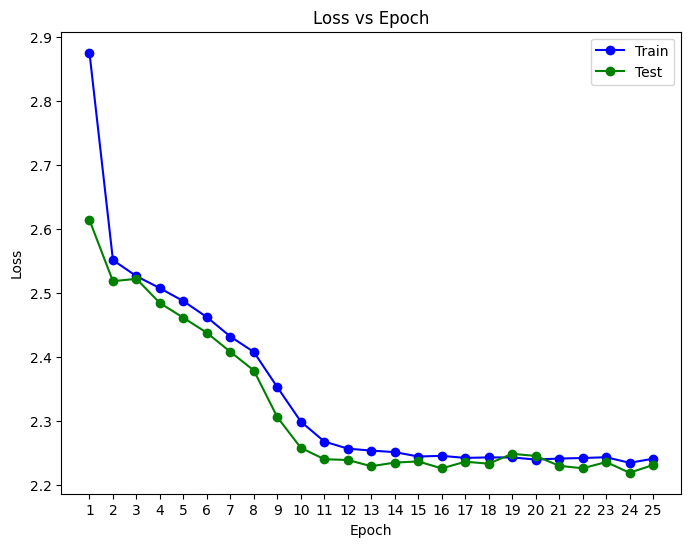

In [ ]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [ ]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.553795,0.999397,0.305757,0.299457,0.553795,0.999397,0.393988,0.460832
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.011844,0.006757,0.043478,0.250000,0.011844,0.006757,0.018617,0.013158
9,strawberry-diseased,0.063063,0.000000,0.035806,0.000000,0.063063,0.000000,0.045677,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.996378,0.998190,0.301796,0.301440,0.996378,0.998190,0.463271,0.463046
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.006768,0.013514,0.056338,0.117647,0.006768,0.013514,0.012085,0.024242
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.993511,0.990344,0.303662,0.309273,0.993511,0.990344,0.465152,0.471349
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.028765,0.114865,0.066406,0.093407,0.028765,0.114865,0.040142,0.103030
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.988381,0.990344,0.309927,0.310091,0.988381,0.990344,0.471885,0.472298
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.072758,0.047297,0.090526,0.112903,0.072758,0.047297,0.080675,0.066667
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.973895,0.975860,0.326058,0.336454,0.973895,0.975860,0.488551,0.500387
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.035533,0.000000,0.076642,0.000000,0.035533,0.000000,0.048555,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.960917,0.953530,0.346558,0.372817,0.960917,0.953530,0.509399,0.536048
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.950656,0.934218,0.362736,0.386807,0.950656,0.934218,0.525109,0.547093
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.938283,0.954737,0.370914,0.370058,0.938283,0.954737,0.531657,0.533378
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.926513,0.916113,0.374117,0.391338,0.926513,0.916113,0.533009,0.548410
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.939641,0.969825,0.367743,0.360718,0.939641,0.969825,0.528608,0.525851
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,tomato-diseased,0.955183,0.975860,0.356018,0.353752,0.955183,0.975860,0.518704,0.519268
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.004085,0.000000,0.214286,0.000000,0.004085,0.000000,0.008018,0.000000
4,tomato-diseased,0.958805,0.971635,0.354932,0.359857,0.958805,0.971635,0.518081,0.525200
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.011802,0.023593,0.313253,0.245283,0.011802,0.023593,0.022747,0.043046
4,tomato-diseased,0.957447,0.969221,0.354291,0.354447,0.957447,0.969221,0.517199,0.519069
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.032229,0.000000,0.310044,0.000000,0.032229,0.000000,0.058388,0.000000
4,tomato-diseased,0.950505,0.965600,0.352984,0.357942,0.950505,0.965600,0.514792,0.522278
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.024512,0.001815,0.281250,0.125000,0.024512,0.001815,0.045094,0.003578
4,tomato-diseased,0.952015,0.966204,0.353564,0.356491,0.952015,0.966204,0.515631,0.520820
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.042669,0.007260,0.333333,0.333333,0.042669,0.007260,0.075654,0.014210
4,tomato-diseased,0.950505,0.971032,0.354095,0.358272,0.950505,0.971032,0.515973,0.523422
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.042215,0.056261,0.306931,0.289720,0.042215,0.056261,0.074222,0.094225
4,tomato-diseased,0.956994,0.958358,0.354440,0.354148,0.956994,0.958358,0.517292,0.517180
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.078529,0.165154,0.358178,0.395652,0.078529,0.165154,0.128816,0.233035
4,tomato-diseased,0.948997,0.934822,0.354950,0.370486,0.948997,0.934822,0.516656,0.530661
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.058103,0.014519,0.325700,0.258065,0.058103,0.014519,0.098613,0.027491
4,tomato-diseased,0.949751,0.940857,0.355433,0.368558,0.949751,0.940857,0.517280,0.529642
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.081707,0.186933,0.348837,0.402344,0.081707,0.186933,0.132402,0.255266
4,tomato-diseased,0.944319,0.941460,0.355044,0.360277,0.944319,0.941460,0.516060,0.521129
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.096686,0.023593,0.341894,0.250000,0.096686,0.023593,0.150743,0.043118
4,tomato-diseased,0.942508,0.951117,0.356202,0.363301,0.942508,0.951117,0.517010,0.525771
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.086700,0.029038,0.331023,0.266667,0.086700,0.029038,0.137410,0.052373
4,tomato-diseased,0.943112,0.956548,0.356207,0.361048,0.943112,0.956548,0.517106,0.524227
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.099410,0.045372,0.337442,0.263158,0.099410,0.045372,0.153576,0.077399
4,tomato-diseased,0.934510,0.962583,0.357419,0.356186,0.934510,0.962583,0.517074,0.519967
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.107581,0.030853,0.358548,0.239437,0.107581,0.030853,0.165503,0.054662
4,tomato-diseased,0.943866,0.952927,0.355559,0.361245,0.943866,0.952927,0.516537,0.523889
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.083976,0.023593,0.351044,0.254902,0.083976,0.023593,0.135531,0.043189
4,tomato-diseased,0.942055,0.976463,0.354978,0.344989,0.942055,0.976463,0.515652,0.509847
5,grape-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


#### AUROC

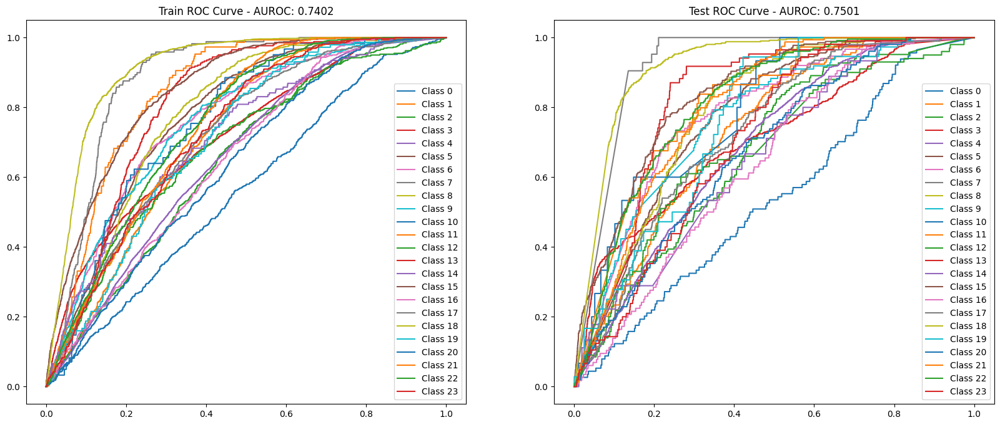

In [ ]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

#### Liberación de memoria

In [ ]:
del classifier_model_2

with torch.no_grad():
    torch.cuda.empty_cache()

## Entrenamiento del Clasificador con Autoencoder sin congelar

In [57]:
classifier_model_2 = Classifier(input_features=27, encoder_model=autoencoder_model_2, freeze_weights=False).to(device)

classifier_loss_fn_2 = nn.CrossEntropyLoss()
classifier_optimizer_2 = torch.optim.Adam(classifier_model_2.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader_2 = DataLoader(
    train_dataset_2, batch_size=batch_size, shuffle=True)

classifier_test_dataloader_2 = DataLoader(
    test_dataset_2, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [58]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader_2, classifier_model_2, classifier_loss_fn_2, classifier_optimizer_2)
    test_loss = test(classifier_test_dataloader_2, classifier_model_2, classifier_loss_fn_2)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.085797  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.061032  [  352/22179]
Current Loss: 3.052829  [  672/22179]
Current Loss: 3.065760  [  992/22179]
Current Loss: 3.039840  [ 1312/22179]
Current Loss: 3.044200  [ 1632/22179]
Current Loss: 3.037532  [ 1952/22179]
Current Loss: 3.023267  [ 2272/22179]
Current Loss: 3.003923  [ 2592/22179]
Current Loss: 3.006570  [ 2912/22179]
Current Loss: 3.002489  [ 3232/22179]
Current Loss: 2.992826  [ 3552/22179]
Current Loss: 2.986228  [ 3872/22179]
Current Loss: 2.975321  [ 4192/22179]
Current Loss: 2.966604  [ 4512/22179]
Current Loss: 2.960594  [ 4832/22179]
Current Loss: 2.944416  [ 5152/22179]
Current Loss: 2.934738  [ 5472/22179]
Current Loss: 2.920971  [ 5792/22179]
Current Loss: 2.910006  [ 6112/22179]
Current Loss: 2.902010  [ 6432/22179]
Current Loss: 2.892884  [ 6752/22179]
Current Loss: 2.878219  [ 7072/22179]
Current Loss: 2.864710  [ 7392/22179]
Current Loss: 2.851332  [ 7712/22179]
Current Loss: 2.838760  [ 8032/22179]
Current Loss: 2.828094  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.001815,0.006369,0.001815,0.002825
4,tomato-diseased,0.942667,0.389235,0.942667,0.550970
5,grape-diseased,0.120879,0.200913,0.120879,0.150943
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.317014  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.350012  [  352/22179]
Current Loss: 2.304767  [  672/22179]
Current Loss: 2.268302  [  992/22179]
Current Loss: 2.272902  [ 1312/22179]
Current Loss: 2.262046  [ 1632/22179]
Current Loss: 2.213916  [ 1952/22179]
Current Loss: 2.206308  [ 2272/22179]
Current Loss: 2.208533  [ 2592/22179]
Current Loss: 2.185721  [ 2912/22179]
Current Loss: 2.189867  [ 3232/22179]
Current Loss: 2.190443  [ 3552/22179]
Current Loss: 2.190158  [ 3872/22179]
Current Loss: 2.189085  [ 4192/22179]
Current Loss: 2.193548  [ 4512/22179]
Current Loss: 2.193209  [ 4832/22179]
Current Loss: 2.184048  [ 5152/22179]
Current Loss: 2.176545  [ 5472/22179]
Current Loss: 2.170927  [ 5792/22179]
Current Loss: 2.163472  [ 6112/22179]
Current Loss: 2.162457  [ 6432/22179]
Current Loss: 2.161204  [ 6752/22179]
Current Loss: 2.160451  [ 7072/22179]
Current Loss: 2.163113  [ 7392/22179]
Current Loss: 2.160418  [ 7712/22179]
Current Loss: 2.159695  [ 8032/22179]
Current Loss: 2.156006  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.638838,0.630824,0.638838,0.634806
4,tomato-diseased,0.928183,0.426630,0.928183,0.584569
5,grape-diseased,0.074176,0.142857,0.074176,0.097649
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.713273  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.893536  [  352/22179]
Current Loss: 1.966749  [  672/22179]
Current Loss: 1.988035  [  992/22179]
Current Loss: 2.000217  [ 1312/22179]
Current Loss: 1.999086  [ 1632/22179]
Current Loss: 1.982237  [ 1952/22179]
Current Loss: 1.990312  [ 2272/22179]
Current Loss: 1.984985  [ 2592/22179]
Current Loss: 1.983507  [ 2912/22179]
Current Loss: 1.971256  [ 3232/22179]
Current Loss: 1.972666  [ 3552/22179]
Current Loss: 1.974600  [ 3872/22179]
Current Loss: 1.973723  [ 4192/22179]
Current Loss: 1.973844  [ 4512/22179]
Current Loss: 1.975522  [ 4832/22179]
Current Loss: 1.977715  [ 5152/22179]
Current Loss: 1.974100  [ 5472/22179]
Current Loss: 1.979992  [ 5792/22179]
Current Loss: 1.979682  [ 6112/22179]
Current Loss: 1.978645  [ 6432/22179]
Current Loss: 1.973572  [ 6752/22179]
Current Loss: 1.978677  [ 7072/22179]
Current Loss: 1.973920  [ 7392/22179]
Current Loss: 1.968526  [ 7712/22179]
Current Loss: 1.964776  [ 8032/22179]
Current Loss: 1.963345  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.551724,0.620408,0.551724,0.584054
4,tomato-diseased,0.952323,0.407331,0.952323,0.570602
5,grape-diseased,0.173077,0.336898,0.173077,0.228675
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.081081,0.155172,0.081081,0.106509


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.798549  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.874426  [  352/22179]
Current Loss: 1.877246  [  672/22179]
Current Loss: 1.916633  [  992/22179]
Current Loss: 1.871487  [ 1312/22179]
Current Loss: 1.865895  [ 1632/22179]
Current Loss: 1.854999  [ 1952/22179]
Current Loss: 1.863771  [ 2272/22179]
Current Loss: 1.866900  [ 2592/22179]
Current Loss: 1.864871  [ 2912/22179]
Current Loss: 1.863424  [ 3232/22179]
Current Loss: 1.869935  [ 3552/22179]
Current Loss: 1.877980  [ 3872/22179]
Current Loss: 1.883733  [ 4192/22179]
Current Loss: 1.881853  [ 4512/22179]
Current Loss: 1.882598  [ 4832/22179]
Current Loss: 1.885983  [ 5152/22179]
Current Loss: 1.883073  [ 5472/22179]
Current Loss: 1.885544  [ 5792/22179]
Current Loss: 1.886267  [ 6112/22179]
Current Loss: 1.878091  [ 6432/22179]
Current Loss: 1.877022  [ 6752/22179]
Current Loss: 1.876354  [ 7072/22179]
Current Loss: 1.871391  [ 7392/22179]
Current Loss: 1.874145  [ 7712/22179]
Current Loss: 1.871703  [ 8032/22179]
Current Loss: 1.868238  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.307018,0.945946,0.307018,0.463576
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.756806,0.629909,0.756806,0.687551
4,tomato-diseased,0.887145,0.458658,0.887145,0.604689
5,grape-diseased,0.178571,0.252918,0.178571,0.209340
6,blueberry-healthy,0.026667,0.500000,0.026667,0.050633
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.261261,0.263636,0.261261,0.262443


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.680000  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.748611  [  352/22179]
Current Loss: 1.826197  [  672/22179]
Current Loss: 1.844691  [  992/22179]
Current Loss: 1.830599  [ 1312/22179]
Current Loss: 1.829037  [ 1632/22179]
Current Loss: 1.812049  [ 1952/22179]
Current Loss: 1.812258  [ 2272/22179]
Current Loss: 1.803149  [ 2592/22179]
Current Loss: 1.806109  [ 2912/22179]
Current Loss: 1.809860  [ 3232/22179]
Current Loss: 1.811165  [ 3552/22179]
Current Loss: 1.824300  [ 3872/22179]
Current Loss: 1.823732  [ 4192/22179]
Current Loss: 1.818797  [ 4512/22179]
Current Loss: 1.806993  [ 4832/22179]
Current Loss: 1.807227  [ 5152/22179]
Current Loss: 1.804741  [ 5472/22179]
Current Loss: 1.806146  [ 5792/22179]
Current Loss: 1.806118  [ 6112/22179]
Current Loss: 1.808900  [ 6432/22179]
Current Loss: 1.808435  [ 6752/22179]
Current Loss: 1.815610  [ 7072/22179]
Current Loss: 1.811604  [ 7392/22179]
Current Loss: 1.814892  [ 7712/22179]
Current Loss: 1.809360  [ 8032/22179]
Current Loss: 1.808718  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.535088,0.762500,0.535088,0.628866
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.705989,0.684859,0.705989,0.695264
4,tomato-diseased,0.866023,0.481544,0.866023,0.618935
5,grape-diseased,0.277473,0.321656,0.277473,0.297935
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.423423,0.229268,0.423423,0.297468


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.055502  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.652363  [  352/22179]
Current Loss: 1.759088  [  672/22179]
Current Loss: 1.775974  [  992/22179]
Current Loss: 1.772051  [ 1312/22179]
Current Loss: 1.784961  [ 1632/22179]
Current Loss: 1.791987  [ 1952/22179]
Current Loss: 1.797024  [ 2272/22179]
Current Loss: 1.799716  [ 2592/22179]
Current Loss: 1.804575  [ 2912/22179]
Current Loss: 1.793096  [ 3232/22179]
Current Loss: 1.780826  [ 3552/22179]
Current Loss: 1.786304  [ 3872/22179]
Current Loss: 1.784062  [ 4192/22179]
Current Loss: 1.794305  [ 4512/22179]
Current Loss: 1.793339  [ 4832/22179]
Current Loss: 1.789920  [ 5152/22179]
Current Loss: 1.785388  [ 5472/22179]
Current Loss: 1.787482  [ 5792/22179]
Current Loss: 1.783714  [ 6112/22179]
Current Loss: 1.780668  [ 6432/22179]
Current Loss: 1.775699  [ 6752/22179]
Current Loss: 1.777867  [ 7072/22179]
Current Loss: 1.778109  [ 7392/22179]
Current Loss: 1.775884  [ 7712/22179]
Current Loss: 1.777765  [ 8032/22179]
Current Loss: 1.778058  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.596491,0.635514,0.596491,0.615385
1,squash-diseased,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.568058,0.874302,0.568058,0.688669
4,tomato-diseased,0.820760,0.502773,0.820760,0.623567
5,grape-diseased,0.340659,0.295943,0.340659,0.316731
6,blueberry-healthy,0.106667,0.355556,0.106667,0.164103
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.378378,0.215385,0.378378,0.274510


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.196838  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.815192  [  352/22179]
Current Loss: 1.783400  [  672/22179]
Current Loss: 1.748365  [  992/22179]
Current Loss: 1.732323  [ 1312/22179]
Current Loss: 1.708849  [ 1632/22179]
Current Loss: 1.723408  [ 1952/22179]
Current Loss: 1.720676  [ 2272/22179]
Current Loss: 1.734141  [ 2592/22179]
Current Loss: 1.736852  [ 2912/22179]
Current Loss: 1.737670  [ 3232/22179]
Current Loss: 1.747043  [ 3552/22179]
Current Loss: 1.752874  [ 3872/22179]
Current Loss: 1.746750  [ 4192/22179]
Current Loss: 1.744570  [ 4512/22179]
Current Loss: 1.751892  [ 4832/22179]
Current Loss: 1.759720  [ 5152/22179]
Current Loss: 1.754110  [ 5472/22179]
Current Loss: 1.751532  [ 5792/22179]
Current Loss: 1.756707  [ 6112/22179]
Current Loss: 1.753141  [ 6432/22179]
Current Loss: 1.756181  [ 6752/22179]
Current Loss: 1.760636  [ 7072/22179]
Current Loss: 1.762664  [ 7392/22179]
Current Loss: 1.763037  [ 7712/22179]
Current Loss: 1.757625  [ 8032/22179]
Current Loss: 1.754655  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.561404,0.790123,0.561404,0.656410
1,squash-diseased,0.103261,0.365385,0.103261,0.161017
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.751361,0.747292,0.751361,0.749321
4,tomato-diseased,0.886542,0.471287,0.886542,0.615417
5,grape-diseased,0.381868,0.342365,0.381868,0.361039
6,blueberry-healthy,0.033333,0.357143,0.033333,0.060976
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.207207,0.230000,0.207207,0.218009


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.418703  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.697709  [  352/22179]
Current Loss: 1.716077  [  672/22179]
Current Loss: 1.757386  [  992/22179]
Current Loss: 1.759006  [ 1312/22179]
Current Loss: 1.745311  [ 1632/22179]
Current Loss: 1.738306  [ 1952/22179]
Current Loss: 1.728332  [ 2272/22179]
Current Loss: 1.728241  [ 2592/22179]
Current Loss: 1.714532  [ 2912/22179]
Current Loss: 1.709256  [ 3232/22179]
Current Loss: 1.714006  [ 3552/22179]
Current Loss: 1.728276  [ 3872/22179]
Current Loss: 1.727249  [ 4192/22179]
Current Loss: 1.732374  [ 4512/22179]
Current Loss: 1.730791  [ 4832/22179]
Current Loss: 1.733631  [ 5152/22179]
Current Loss: 1.732383  [ 5472/22179]
Current Loss: 1.738724  [ 5792/22179]
Current Loss: 1.743839  [ 6112/22179]
Current Loss: 1.745611  [ 6432/22179]
Current Loss: 1.743925  [ 6752/22179]
Current Loss: 1.741427  [ 7072/22179]
Current Loss: 1.745712  [ 7392/22179]
Current Loss: 1.740901  [ 7712/22179]
Current Loss: 1.735358  [ 8032/22179]
Current Loss: 1.729604  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.675439,0.562044,0.675439,0.613546
1,squash-diseased,0.092391,0.386364,0.092391,0.149123
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.758621,0.741135,0.758621,0.749776
4,tomato-diseased,0.884731,0.480183,0.884731,0.622505
5,grape-diseased,0.423077,0.364066,0.423077,0.391360
6,blueberry-healthy,0.140000,0.403846,0.140000,0.207921
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.360360,0.243902,0.360360,0.290909


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.522183  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.646771  [  352/22179]
Current Loss: 1.673620  [  672/22179]
Current Loss: 1.643171  [  992/22179]
Current Loss: 1.656060  [ 1312/22179]
Current Loss: 1.666820  [ 1632/22179]
Current Loss: 1.655903  [ 1952/22179]
Current Loss: 1.664197  [ 2272/22179]
Current Loss: 1.653259  [ 2592/22179]
Current Loss: 1.672653  [ 2912/22179]
Current Loss: 1.678033  [ 3232/22179]
Current Loss: 1.671762  [ 3552/22179]
Current Loss: 1.670540  [ 3872/22179]
Current Loss: 1.663591  [ 4192/22179]
Current Loss: 1.669713  [ 4512/22179]
Current Loss: 1.669906  [ 4832/22179]
Current Loss: 1.674050  [ 5152/22179]
Current Loss: 1.674467  [ 5472/22179]
Current Loss: 1.677454  [ 5792/22179]
Current Loss: 1.684346  [ 6112/22179]
Current Loss: 1.686142  [ 6432/22179]
Current Loss: 1.688499  [ 6752/22179]
Current Loss: 1.689076  [ 7072/22179]
Current Loss: 1.690399  [ 7392/22179]
Current Loss: 1.688802  [ 7712/22179]
Current Loss: 1.686562  [ 8032/22179]
Current Loss: 1.684987  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.649123,0.654867,0.649123,0.651982
1,squash-diseased,0.293478,0.242152,0.293478,0.265356
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.758621,0.793169,0.758621,0.775510
4,tomato-diseased,0.783343,0.546526,0.783343,0.643849
5,grape-diseased,0.409341,0.425714,0.409341,0.417367
6,blueberry-healthy,0.166667,0.347222,0.166667,0.225225
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.513514,0.201413,0.513514,0.289340


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.712713  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.633103  [  352/22179]
Current Loss: 1.678231  [  672/22179]
Current Loss: 1.681962  [  992/22179]
Current Loss: 1.687472  [ 1312/22179]
Current Loss: 1.691916  [ 1632/22179]
Current Loss: 1.688533  [ 1952/22179]
Current Loss: 1.684946  [ 2272/22179]
Current Loss: 1.670941  [ 2592/22179]
Current Loss: 1.686077  [ 2912/22179]
Current Loss: 1.681368  [ 3232/22179]
Current Loss: 1.685311  [ 3552/22179]
Current Loss: 1.682470  [ 3872/22179]
Current Loss: 1.687389  [ 4192/22179]
Current Loss: 1.685421  [ 4512/22179]
Current Loss: 1.681263  [ 4832/22179]
Current Loss: 1.677658  [ 5152/22179]
Current Loss: 1.683427  [ 5472/22179]
Current Loss: 1.681002  [ 5792/22179]
Current Loss: 1.682231  [ 6112/22179]
Current Loss: 1.676826  [ 6432/22179]
Current Loss: 1.681461  [ 6752/22179]
Current Loss: 1.686410  [ 7072/22179]
Current Loss: 1.687740  [ 7392/22179]
Current Loss: 1.682248  [ 7712/22179]
Current Loss: 1.685655  [ 8032/22179]
Current Loss: 1.685096  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.412281,0.903846,0.412281,0.566265
1,squash-diseased,0.152174,0.224000,0.152174,0.181230
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.589837,0.942029,0.589837,0.725446
4,tomato-diseased,0.869040,0.500870,0.869040,0.635481
5,grape-diseased,0.398352,0.444785,0.398352,0.420290
6,blueberry-healthy,0.113333,0.242857,0.113333,0.154545
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.450450,0.221239,0.450450,0.296736


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.757401  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.776022  [  352/22179]
Current Loss: 1.687542  [  672/22179]
Current Loss: 1.642261  [  992/22179]
Current Loss: 1.612186  [ 1312/22179]
Current Loss: 1.582429  [ 1632/22179]
Current Loss: 1.600471  [ 1952/22179]
Current Loss: 1.610492  [ 2272/22179]
Current Loss: 1.606458  [ 2592/22179]
Current Loss: 1.619452  [ 2912/22179]
Current Loss: 1.617090  [ 3232/22179]
Current Loss: 1.612792  [ 3552/22179]
Current Loss: 1.611388  [ 3872/22179]
Current Loss: 1.602912  [ 4192/22179]
Current Loss: 1.601083  [ 4512/22179]
Current Loss: 1.602361  [ 4832/22179]
Current Loss: 1.601449  [ 5152/22179]
Current Loss: 1.608212  [ 5472/22179]
Current Loss: 1.608913  [ 5792/22179]
Current Loss: 1.605358  [ 6112/22179]
Current Loss: 1.602607  [ 6432/22179]
Current Loss: 1.604529  [ 6752/22179]
Current Loss: 1.604489  [ 7072/22179]
Current Loss: 1.607323  [ 7392/22179]
Current Loss: 1.607148  [ 7712/22179]
Current Loss: 1.611796  [ 8032/22179]
Current Loss: 1.616605  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.543860,0.688889,0.543860,0.607843
1,squash-diseased,0.048913,0.250000,0.048913,0.081818
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.749546,0.770522,0.749546,0.759890
4,tomato-diseased,0.835244,0.538941,0.835244,0.655148
5,grape-diseased,0.390110,0.455128,0.390110,0.420118
6,blueberry-healthy,0.413333,0.288372,0.413333,0.339726
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.013514,0.222222,0.013514,0.025478
9,strawberry-diseased,0.378378,0.285714,0.378378,0.325581


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.163479  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.616932  [  352/22179]
Current Loss: 1.589702  [  672/22179]
Current Loss: 1.553471  [  992/22179]
Current Loss: 1.549252  [ 1312/22179]
Current Loss: 1.528282  [ 1632/22179]
Current Loss: 1.549999  [ 1952/22179]
Current Loss: 1.566519  [ 2272/22179]
Current Loss: 1.568416  [ 2592/22179]
Current Loss: 1.588582  [ 2912/22179]
Current Loss: 1.589893  [ 3232/22179]
Current Loss: 1.584499  [ 3552/22179]
Current Loss: 1.580932  [ 3872/22179]
Current Loss: 1.591591  [ 4192/22179]
Current Loss: 1.585115  [ 4512/22179]
Current Loss: 1.585616  [ 4832/22179]
Current Loss: 1.583931  [ 5152/22179]
Current Loss: 1.573397  [ 5472/22179]
Current Loss: 1.570267  [ 5792/22179]
Current Loss: 1.572126  [ 6112/22179]
Current Loss: 1.579748  [ 6432/22179]
Current Loss: 1.575788  [ 6752/22179]
Current Loss: 1.582638  [ 7072/22179]
Current Loss: 1.586555  [ 7392/22179]
Current Loss: 1.584304  [ 7712/22179]
Current Loss: 1.588089  [ 8032/22179]
Current Loss: 1.588882  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.578947,0.776471,0.578947,0.663317
1,squash-diseased,0.239130,0.307692,0.239130,0.269113
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.686025,0.868966,0.686025,0.766734
4,tomato-diseased,0.883524,0.500171,0.883524,0.638743
5,grape-diseased,0.497253,0.475066,0.497253,0.485906
6,blueberry-healthy,0.260000,0.309524,0.260000,0.282609
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.020270,0.272727,0.020270,0.037736
9,strawberry-diseased,0.351351,0.250000,0.351351,0.292135


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.750336  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.579189  [  352/22179]
Current Loss: 1.577101  [  672/22179]
Current Loss: 1.585204  [  992/22179]
Current Loss: 1.574260  [ 1312/22179]
Current Loss: 1.557115  [ 1632/22179]
Current Loss: 1.549474  [ 1952/22179]
Current Loss: 1.537888  [ 2272/22179]
Current Loss: 1.556325  [ 2592/22179]
Current Loss: 1.559862  [ 2912/22179]
Current Loss: 1.566111  [ 3232/22179]
Current Loss: 1.562316  [ 3552/22179]
Current Loss: 1.560759  [ 3872/22179]
Current Loss: 1.567615  [ 4192/22179]
Current Loss: 1.562535  [ 4512/22179]
Current Loss: 1.570129  [ 4832/22179]
Current Loss: 1.565826  [ 5152/22179]
Current Loss: 1.564058  [ 5472/22179]
Current Loss: 1.570169  [ 5792/22179]
Current Loss: 1.564891  [ 6112/22179]
Current Loss: 1.572641  [ 6432/22179]
Current Loss: 1.567271  [ 6752/22179]
Current Loss: 1.567534  [ 7072/22179]
Current Loss: 1.569685  [ 7392/22179]
Current Loss: 1.571515  [ 7712/22179]
Current Loss: 1.576288  [ 8032/22179]
Current Loss: 1.575218  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.596491,0.612613,0.596491,0.604444
1,squash-diseased,0.190217,0.250000,0.190217,0.216049
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.671506,0.885167,0.671506,0.763674
4,tomato-diseased,0.823174,0.560625,0.823174,0.666993
5,grape-diseased,0.557692,0.497549,0.557692,0.525907
6,blueberry-healthy,0.440000,0.311321,0.440000,0.364641
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.054054,0.275862,0.054054,0.090395
9,strawberry-diseased,0.441441,0.252577,0.441441,0.321311


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.313621  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.558838  [  352/22179]
Current Loss: 1.613456  [  672/22179]
Current Loss: 1.542731  [  992/22179]
Current Loss: 1.528275  [ 1312/22179]
Current Loss: 1.530876  [ 1632/22179]
Current Loss: 1.534276  [ 1952/22179]
Current Loss: 1.535044  [ 2272/22179]
Current Loss: 1.547981  [ 2592/22179]
Current Loss: 1.533486  [ 2912/22179]
Current Loss: 1.521574  [ 3232/22179]
Current Loss: 1.519700  [ 3552/22179]
Current Loss: 1.521892  [ 3872/22179]
Current Loss: 1.522884  [ 4192/22179]
Current Loss: 1.527176  [ 4512/22179]
Current Loss: 1.524831  [ 4832/22179]
Current Loss: 1.526824  [ 5152/22179]
Current Loss: 1.530700  [ 5472/22179]
Current Loss: 1.531396  [ 5792/22179]
Current Loss: 1.525563  [ 6112/22179]
Current Loss: 1.528737  [ 6432/22179]
Current Loss: 1.524799  [ 6752/22179]
Current Loss: 1.529515  [ 7072/22179]
Current Loss: 1.531111  [ 7392/22179]
Current Loss: 1.531466  [ 7712/22179]
Current Loss: 1.537156  [ 8032/22179]
Current Loss: 1.543097  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.692982,0.622047,0.692982,0.655602
1,squash-diseased,0.277174,0.361702,0.277174,0.313846
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.813067,0.717949,0.813067,0.762553
4,tomato-diseased,0.745926,0.594231,0.745926,0.661493
5,grape-diseased,0.596154,0.439271,0.596154,0.505827
6,blueberry-healthy,0.533333,0.325203,0.533333,0.404040
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.067568,0.333333,0.067568,0.112360
9,strawberry-diseased,0.288288,0.307692,0.288288,0.297674


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.520477  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.425510  [  352/22179]
Current Loss: 1.450607  [  672/22179]
Current Loss: 1.474598  [  992/22179]
Current Loss: 1.486608  [ 1312/22179]
Current Loss: 1.493836  [ 1632/22179]
Current Loss: 1.488795  [ 1952/22179]
Current Loss: 1.492196  [ 2272/22179]
Current Loss: 1.497200  [ 2592/22179]
Current Loss: 1.499129  [ 2912/22179]
Current Loss: 1.495880  [ 3232/22179]
Current Loss: 1.508037  [ 3552/22179]
Current Loss: 1.505937  [ 3872/22179]
Current Loss: 1.508121  [ 4192/22179]
Current Loss: 1.516108  [ 4512/22179]
Current Loss: 1.512285  [ 4832/22179]
Current Loss: 1.519012  [ 5152/22179]
Current Loss: 1.508174  [ 5472/22179]
Current Loss: 1.514659  [ 5792/22179]
Current Loss: 1.522148  [ 6112/22179]
Current Loss: 1.516067  [ 6432/22179]
Current Loss: 1.519672  [ 6752/22179]
Current Loss: 1.520280  [ 7072/22179]
Current Loss: 1.523505  [ 7392/22179]
Current Loss: 1.524173  [ 7712/22179]
Current Loss: 1.529215  [ 8032/22179]
Current Loss: 1.533309  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.587719,0.697917,0.587719,0.638095
1,squash-diseased,0.277174,0.312883,0.277174,0.293948
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.686025,0.851351,0.686025,0.759799
4,tomato-diseased,0.854556,0.537790,0.854556,0.660140
5,grape-diseased,0.510989,0.603896,0.510989,0.553571
6,blueberry-healthy,0.373333,0.327485,0.373333,0.348910
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.128378,0.275362,0.128378,0.175115
9,strawberry-diseased,0.441441,0.252577,0.441441,0.321311


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.402269  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.480660  [  352/22179]
Current Loss: 1.537052  [  672/22179]
Current Loss: 1.506437  [  992/22179]
Current Loss: 1.497429  [ 1312/22179]
Current Loss: 1.510679  [ 1632/22179]
Current Loss: 1.504728  [ 1952/22179]
Current Loss: 1.521684  [ 2272/22179]
Current Loss: 1.524009  [ 2592/22179]
Current Loss: 1.520987  [ 2912/22179]
Current Loss: 1.518414  [ 3232/22179]
Current Loss: 1.523433  [ 3552/22179]
Current Loss: 1.518711  [ 3872/22179]
Current Loss: 1.511642  [ 4192/22179]
Current Loss: 1.511226  [ 4512/22179]
Current Loss: 1.504763  [ 4832/22179]
Current Loss: 1.500287  [ 5152/22179]
Current Loss: 1.503796  [ 5472/22179]
Current Loss: 1.501129  [ 5792/22179]
Current Loss: 1.494202  [ 6112/22179]
Current Loss: 1.495190  [ 6432/22179]
Current Loss: 1.510107  [ 6752/22179]
Current Loss: 1.513929  [ 7072/22179]
Current Loss: 1.511897  [ 7392/22179]
Current Loss: 1.506895  [ 7712/22179]
Current Loss: 1.510517  [ 8032/22179]
Current Loss: 1.511809  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.614035,0.666667,0.614035,0.639269
1,squash-diseased,0.282609,0.460177,0.282609,0.350168
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.764065,0.786916,0.764065,0.775322
4,tomato-diseased,0.856367,0.530467,0.856367,0.655125
5,grape-diseased,0.557692,0.565460,0.557692,0.561549
6,blueberry-healthy,0.560000,0.277228,0.560000,0.370861
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.114865,0.265625,0.114865,0.160377
9,strawberry-diseased,0.441441,0.257895,0.441441,0.325581


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.690750  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.629023  [  352/22179]
Current Loss: 1.560416  [  672/22179]
Current Loss: 1.506850  [  992/22179]
Current Loss: 1.518896  [ 1312/22179]
Current Loss: 1.472966  [ 1632/22179]
Current Loss: 1.475994  [ 1952/22179]
Current Loss: 1.480158  [ 2272/22179]
Current Loss: 1.490278  [ 2592/22179]
Current Loss: 1.494727  [ 2912/22179]
Current Loss: 1.491077  [ 3232/22179]
Current Loss: 1.505385  [ 3552/22179]
Current Loss: 1.510257  [ 3872/22179]
Current Loss: 1.515268  [ 4192/22179]
Current Loss: 1.517585  [ 4512/22179]
Current Loss: 1.519182  [ 4832/22179]
Current Loss: 1.518699  [ 5152/22179]
Current Loss: 1.510904  [ 5472/22179]
Current Loss: 1.507280  [ 5792/22179]
Current Loss: 1.514686  [ 6112/22179]
Current Loss: 1.522320  [ 6432/22179]
Current Loss: 1.522115  [ 6752/22179]
Current Loss: 1.519530  [ 7072/22179]
Current Loss: 1.519225  [ 7392/22179]
Current Loss: 1.514970  [ 7712/22179]
Current Loss: 1.513220  [ 8032/22179]
Current Loss: 1.513296  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.578947,0.687500,0.578947,0.628571
1,squash-diseased,0.364130,0.426752,0.364130,0.392962
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.695100,0.882488,0.695100,0.777665
4,tomato-diseased,0.861195,0.538084,0.861195,0.662335
5,grape-diseased,0.571429,0.560647,0.571429,0.565986
6,blueberry-healthy,0.500000,0.304878,0.500000,0.378788
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.094595,0.378378,0.094595,0.151351
9,strawberry-diseased,0.369369,0.280822,0.369369,0.319066


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.296042  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.611563  [  352/22179]
Current Loss: 1.550663  [  672/22179]
Current Loss: 1.518651  [  992/22179]
Current Loss: 1.470427  [ 1312/22179]
Current Loss: 1.468481  [ 1632/22179]
Current Loss: 1.470078  [ 1952/22179]
Current Loss: 1.468338  [ 2272/22179]
Current Loss: 1.463937  [ 2592/22179]
Current Loss: 1.453783  [ 2912/22179]
Current Loss: 1.461731  [ 3232/22179]
Current Loss: 1.454007  [ 3552/22179]
Current Loss: 1.458478  [ 3872/22179]
Current Loss: 1.470834  [ 4192/22179]
Current Loss: 1.465315  [ 4512/22179]
Current Loss: 1.460181  [ 4832/22179]
Current Loss: 1.468800  [ 5152/22179]
Current Loss: 1.474254  [ 5472/22179]
Current Loss: 1.480622  [ 5792/22179]
Current Loss: 1.479707  [ 6112/22179]
Current Loss: 1.482356  [ 6432/22179]
Current Loss: 1.490319  [ 6752/22179]
Current Loss: 1.484171  [ 7072/22179]
Current Loss: 1.480390  [ 7392/22179]
Current Loss: 1.480326  [ 7712/22179]
Current Loss: 1.481908  [ 8032/22179]
Current Loss: 1.484728  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.596491,0.723404,0.596491,0.653846
1,squash-diseased,0.288043,0.368056,0.288043,0.323171
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.827586,0.713615,0.827586,0.766387
4,tomato-diseased,0.847314,0.544397,0.847314,0.662890
5,grape-diseased,0.574176,0.609329,0.574176,0.591231
6,blueberry-healthy,0.400000,0.384615,0.400000,0.392157
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.060811,0.257143,0.060811,0.098361
9,strawberry-diseased,0.288288,0.296296,0.288288,0.292237


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.415328  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.546210  [  352/22179]
Current Loss: 1.551394  [  672/22179]
Current Loss: 1.535284  [  992/22179]
Current Loss: 1.514946  [ 1312/22179]
Current Loss: 1.524407  [ 1632/22179]
Current Loss: 1.521344  [ 1952/22179]
Current Loss: 1.489442  [ 2272/22179]
Current Loss: 1.481501  [ 2592/22179]
Current Loss: 1.480902  [ 2912/22179]
Current Loss: 1.476881  [ 3232/22179]
Current Loss: 1.478064  [ 3552/22179]
Current Loss: 1.469178  [ 3872/22179]
Current Loss: 1.473238  [ 4192/22179]
Current Loss: 1.474268  [ 4512/22179]
Current Loss: 1.474384  [ 4832/22179]
Current Loss: 1.482705  [ 5152/22179]
Current Loss: 1.485965  [ 5472/22179]
Current Loss: 1.489261  [ 5792/22179]
Current Loss: 1.486228  [ 6112/22179]
Current Loss: 1.485498  [ 6432/22179]
Current Loss: 1.485605  [ 6752/22179]
Current Loss: 1.490520  [ 7072/22179]
Current Loss: 1.492144  [ 7392/22179]
Current Loss: 1.493386  [ 7712/22179]
Current Loss: 1.493032  [ 8032/22179]
Current Loss: 1.493531  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.535088,0.693182,0.535088,0.603960
1,squash-diseased,0.320652,0.433824,0.320652,0.368750
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.836661,0.640278,0.836661,0.725413
4,tomato-diseased,0.762221,0.574091,0.762221,0.654913
5,grape-diseased,0.574176,0.600575,0.574176,0.587079
6,blueberry-healthy,0.493333,0.344186,0.493333,0.405479
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.067568,0.322581,0.067568,0.111732
9,strawberry-diseased,0.351351,0.284672,0.351351,0.314516


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.233173  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.413834  [  352/22179]
Current Loss: 1.409352  [  672/22179]
Current Loss: 1.443115  [  992/22179]
Current Loss: 1.454800  [ 1312/22179]
Current Loss: 1.448491  [ 1632/22179]
Current Loss: 1.451940  [ 1952/22179]
Current Loss: 1.476801  [ 2272/22179]
Current Loss: 1.465953  [ 2592/22179]
Current Loss: 1.462997  [ 2912/22179]
Current Loss: 1.463565  [ 3232/22179]
Current Loss: 1.448045  [ 3552/22179]
Current Loss: 1.456852  [ 3872/22179]
Current Loss: 1.471215  [ 4192/22179]
Current Loss: 1.474331  [ 4512/22179]
Current Loss: 1.476066  [ 4832/22179]
Current Loss: 1.474236  [ 5152/22179]
Current Loss: 1.469841  [ 5472/22179]
Current Loss: 1.475676  [ 5792/22179]
Current Loss: 1.475623  [ 6112/22179]
Current Loss: 1.476973  [ 6432/22179]
Current Loss: 1.473471  [ 6752/22179]
Current Loss: 1.478175  [ 7072/22179]
Current Loss: 1.473681  [ 7392/22179]
Current Loss: 1.473037  [ 7712/22179]
Current Loss: 1.466509  [ 8032/22179]
Current Loss: 1.468654  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.631579,0.605042,0.631579,0.618026
1,squash-diseased,0.336957,0.369048,0.336957,0.352273
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.762250,0.795455,0.762250,0.778499
4,tomato-diseased,0.812915,0.559850,0.812915,0.663057
5,grape-diseased,0.601648,0.576316,0.601648,0.588710
6,blueberry-healthy,0.446667,0.398810,0.446667,0.421384
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.114865,0.242857,0.114865,0.155963
9,strawberry-diseased,0.243243,0.321429,0.243243,0.276923


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.521898  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.464883  [  352/22179]
Current Loss: 1.464859  [  672/22179]
Current Loss: 1.469453  [  992/22179]
Current Loss: 1.460940  [ 1312/22179]
Current Loss: 1.464770  [ 1632/22179]
Current Loss: 1.471196  [ 1952/22179]
Current Loss: 1.468668  [ 2272/22179]
Current Loss: 1.466224  [ 2592/22179]
Current Loss: 1.460043  [ 2912/22179]
Current Loss: 1.454481  [ 3232/22179]
Current Loss: 1.447319  [ 3552/22179]
Current Loss: 1.458541  [ 3872/22179]
Current Loss: 1.469142  [ 4192/22179]
Current Loss: 1.470081  [ 4512/22179]
Current Loss: 1.473585  [ 4832/22179]
Current Loss: 1.471626  [ 5152/22179]
Current Loss: 1.479169  [ 5472/22179]
Current Loss: 1.474012  [ 5792/22179]
Current Loss: 1.474770  [ 6112/22179]
Current Loss: 1.472377  [ 6432/22179]
Current Loss: 1.468384  [ 6752/22179]
Current Loss: 1.467846  [ 7072/22179]
Current Loss: 1.469060  [ 7392/22179]
Current Loss: 1.472422  [ 7712/22179]
Current Loss: 1.474094  [ 8032/22179]
Current Loss: 1.474619  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.447368,0.836066,0.447368,0.582857
1,squash-diseased,0.445652,0.358079,0.445652,0.397094
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.794918,0.765734,0.794918,0.780053
4,tomato-diseased,0.847314,0.556260,0.847314,0.671610
5,grape-diseased,0.483516,0.745763,0.483516,0.586667
6,blueberry-healthy,0.460000,0.325472,0.460000,0.381215
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.108108,0.173913,0.108108,0.133333
9,strawberry-diseased,0.315315,0.246479,0.315315,0.276680


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.563956  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.529459  [  352/22179]
Current Loss: 1.527113  [  672/22179]
Current Loss: 1.503187  [  992/22179]
Current Loss: 1.454156  [ 1312/22179]
Current Loss: 1.454611  [ 1632/22179]
Current Loss: 1.444905  [ 1952/22179]
Current Loss: 1.434637  [ 2272/22179]
Current Loss: 1.448875  [ 2592/22179]
Current Loss: 1.443157  [ 2912/22179]
Current Loss: 1.429570  [ 3232/22179]
Current Loss: 1.428832  [ 3552/22179]
Current Loss: 1.425787  [ 3872/22179]
Current Loss: 1.427017  [ 4192/22179]
Current Loss: 1.435103  [ 4512/22179]
Current Loss: 1.433902  [ 4832/22179]
Current Loss: 1.440797  [ 5152/22179]
Current Loss: 1.443385  [ 5472/22179]
Current Loss: 1.443269  [ 5792/22179]
Current Loss: 1.441375  [ 6112/22179]
Current Loss: 1.439924  [ 6432/22179]
Current Loss: 1.441406  [ 6752/22179]
Current Loss: 1.444825  [ 7072/22179]
Current Loss: 1.440007  [ 7392/22179]
Current Loss: 1.438314  [ 7712/22179]
Current Loss: 1.437887  [ 8032/22179]
Current Loss: 1.438491  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.605263,0.690000,0.605263,0.644860
1,squash-diseased,0.375000,0.396552,0.375000,0.385475
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.784029,0.778378,0.784029,0.781193
4,tomato-diseased,0.822571,0.558607,0.822571,0.665365
5,grape-diseased,0.653846,0.562648,0.653846,0.604828
6,blueberry-healthy,0.446667,0.396450,0.446667,0.420063
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.081081,0.193548,0.081081,0.114286
9,strawberry-diseased,0.216216,0.296296,0.216216,0.250000


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.393799  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.370683  [  352/22179]
Current Loss: 1.386936  [  672/22179]
Current Loss: 1.380599  [  992/22179]
Current Loss: 1.406908  [ 1312/22179]
Current Loss: 1.417185  [ 1632/22179]
Current Loss: 1.447835  [ 1952/22179]
Current Loss: 1.447290  [ 2272/22179]
Current Loss: 1.448128  [ 2592/22179]
Current Loss: 1.462338  [ 2912/22179]
Current Loss: 1.473646  [ 3232/22179]
Current Loss: 1.463850  [ 3552/22179]
Current Loss: 1.461126  [ 3872/22179]
Current Loss: 1.468649  [ 4192/22179]
Current Loss: 1.464600  [ 4512/22179]
Current Loss: 1.458053  [ 4832/22179]
Current Loss: 1.453760  [ 5152/22179]
Current Loss: 1.451164  [ 5472/22179]
Current Loss: 1.442158  [ 5792/22179]
Current Loss: 1.443491  [ 6112/22179]
Current Loss: 1.442655  [ 6432/22179]
Current Loss: 1.445717  [ 6752/22179]
Current Loss: 1.446749  [ 7072/22179]
Current Loss: 1.445344  [ 7392/22179]
Current Loss: 1.443210  [ 7712/22179]
Current Loss: 1.447575  [ 8032/22179]
Current Loss: 1.446725  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.561404,0.711111,0.561404,0.627451
1,squash-diseased,0.364130,0.387283,0.364130,0.375350
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.765880,0.817829,0.765880,0.791003
4,tomato-diseased,0.853953,0.541316,0.853953,0.662608
5,grape-diseased,0.574176,0.645062,0.574176,0.607558
6,blueberry-healthy,0.533333,0.306513,0.533333,0.389294
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.094595,0.200000,0.094595,0.128440
9,strawberry-diseased,0.369369,0.336066,0.369369,0.351931


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 1.662704  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.398899  [  352/22179]
Current Loss: 1.395931  [  672/22179]
Current Loss: 1.472336  [  992/22179]
Current Loss: 1.464695  [ 1312/22179]
Current Loss: 1.479746  [ 1632/22179]
Current Loss: 1.470816  [ 1952/22179]
Current Loss: 1.439990  [ 2272/22179]
Current Loss: 1.439781  [ 2592/22179]
Current Loss: 1.437036  [ 2912/22179]
Current Loss: 1.439556  [ 3232/22179]
Current Loss: 1.434212  [ 3552/22179]
Current Loss: 1.434140  [ 3872/22179]
Current Loss: 1.435862  [ 4192/22179]
Current Loss: 1.448707  [ 4512/22179]
Current Loss: 1.453591  [ 4832/22179]
Current Loss: 1.450460  [ 5152/22179]
Current Loss: 1.443534  [ 5472/22179]
Current Loss: 1.444670  [ 5792/22179]
Current Loss: 1.444555  [ 6112/22179]
Current Loss: 1.442551  [ 6432/22179]
Current Loss: 1.434979  [ 6752/22179]
Current Loss: 1.427280  [ 7072/22179]
Current Loss: 1.429113  [ 7392/22179]
Current Loss: 1.428354  [ 7712/22179]
Current Loss: 1.429303  [ 8032/22179]
Current Loss: 1.428729  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.596491,0.641509,0.596491,0.618182
1,squash-diseased,0.402174,0.364532,0.402174,0.382429
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.811252,0.719807,0.811252,0.762799
4,tomato-diseased,0.804466,0.583370,0.804466,0.676306
5,grape-diseased,0.675824,0.621212,0.675824,0.647368
6,blueberry-healthy,0.406667,0.342697,0.406667,0.371951
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.020270,0.115385,0.020270,0.034483
9,strawberry-diseased,0.360360,0.258065,0.360360,0.300752


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.053698  [   32/22179]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 1.425290  [  352/22179]
Current Loss: 1.427131  [  672/22179]
Current Loss: 1.434181  [  992/22179]
Current Loss: 1.437320  [ 1312/22179]
Current Loss: 1.440177  [ 1632/22179]
Current Loss: 1.424175  [ 1952/22179]
Current Loss: 1.402875  [ 2272/22179]
Current Loss: 1.381180  [ 2592/22179]
Current Loss: 1.373855  [ 2912/22179]
Current Loss: 1.389908  [ 3232/22179]
Current Loss: 1.397267  [ 3552/22179]
Current Loss: 1.397347  [ 3872/22179]
Current Loss: 1.392696  [ 4192/22179]
Current Loss: 1.384923  [ 4512/22179]
Current Loss: 1.387809  [ 4832/22179]
Current Loss: 1.397428  [ 5152/22179]
Current Loss: 1.394613  [ 5472/22179]
Current Loss: 1.397207  [ 5792/22179]
Current Loss: 1.395710  [ 6112/22179]
Current Loss: 1.407739  [ 6432/22179]
Current Loss: 1.408168  [ 6752/22179]
Current Loss: 1.406514  [ 7072/22179]
Current Loss: 1.407222  [ 7392/22179]
Current Loss: 1.412760  [ 7712/22179]
Current Loss: 1.411481  [ 8032/22179]
Current Loss: 1.411346  [ 8352/22179]
Current Loss

,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.552632,0.670213,0.552632,0.605769
1,squash-diseased,0.472826,0.399083,0.472826,0.432836
2,apple-healthy,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.715064,0.843683,0.715064,0.774067
4,tomato-diseased,0.855160,0.564542,0.855160,0.680106
5,grape-diseased,0.623626,0.610215,0.623626,0.616848
6,blueberry-healthy,0.500000,0.340909,0.500000,0.405405
7,grape-healthy,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.060811,0.200000,0.060811,0.093264
9,strawberry-diseased,0.432432,0.279070,0.432432,0.339223


Training time: 33.202 minutes


### Evaluación del modelo

#### Curva de entrenamiento

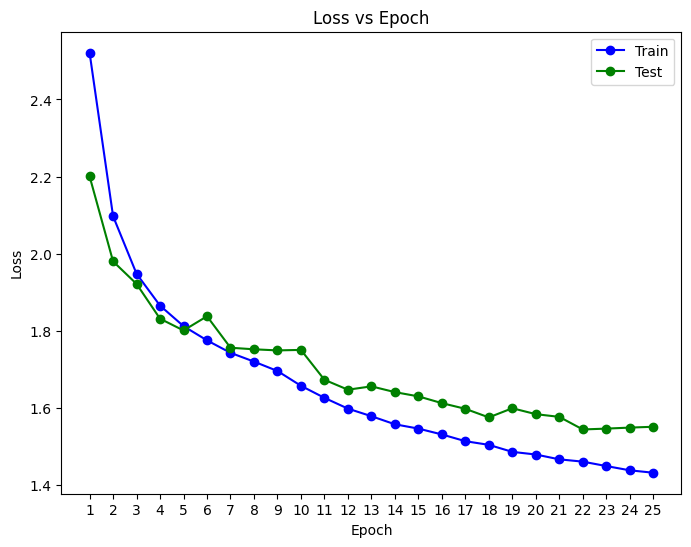

In [59]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [60]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.031775,0.001815,0.153509,0.006369,0.031775,0.001815,0.052651,0.002825
4,tomato-diseased,0.687340,0.942667,0.375113,0.389235,0.687340,0.942667,0.485349,0.550970
5,grape-diseased,0.049485,0.120879,0.096904,0.200913,0.049485,0.120879,0.065514,0.150943
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.404902,0.638838,0.467016,0.630824,0.404902,0.638838,0.433747,0.634806
4,tomato-diseased,0.904029,0.928183,0.409865,0.426630,0.904029,0.928183,0.564018,0.584569
5,grape-diseased,0.096907,0.074176,0.130435,0.142857,0.096907,0.074176,0.111199,0.097649
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.645483,0.551724,0.556120,0.620408,0.645483,0.551724,0.597479,0.584054
4,tomato-diseased,0.919722,0.952323,0.424029,0.407331,0.919722,0.952323,0.580449,0.570602
5,grape-diseased,0.109966,0.173077,0.165289,0.336898,0.109966,0.173077,0.132068,0.228675
6,blueberry-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.006757,0.081081,0.428571,0.155172,0.006757,0.081081,0.013304,0.106509


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.039387,0.307018,0.947368,0.945946,0.039387,0.307018,0.075630,0.463576
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.674989,0.756806,0.552583,0.629909,0.674989,0.756806,0.607683,0.687551
4,tomato-diseased,0.905085,0.887145,0.446081,0.458658,0.905085,0.887145,0.597619,0.604689
5,grape-diseased,0.136082,0.178571,0.228637,0.252918,0.136082,0.178571,0.170616,0.209340
6,blueberry-healthy,0.008319,0.026667,0.294118,0.500000,0.008319,0.026667,0.016181,0.050633
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.157658,0.261261,0.265152,0.263636,0.157658,0.261261,0.197740,0.262443


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.402626,0.535088,0.751020,0.762500,0.402626,0.535088,0.524217,0.628866
1,squash-diseased,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.678620,0.705989,0.621880,0.684859,0.678620,0.705989,0.649012,0.695264
4,tomato-diseased,0.891052,0.866023,0.465621,0.481544,0.891052,0.866023,0.611632,0.618935
5,grape-diseased,0.220619,0.277473,0.268619,0.321656,0.220619,0.277473,0.242264,0.297935
6,blueberry-healthy,0.046589,0.000000,0.451613,0.000000,0.046589,0.000000,0.084465,0.000000
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.286036,0.423423,0.249020,0.229268,0.286036,0.423423,0.266247,0.297468


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.553611,0.596491,0.578947,0.635514,0.553611,0.596491,0.565996,0.615385
1,squash-diseased,0.001362,0.000000,0.166667,0.000000,0.001362,0.000000,0.002703,0.000000
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.686791,0.568058,0.692132,0.874302,0.686791,0.568058,0.689451,0.688669
4,tomato-diseased,0.879885,0.820760,0.480036,0.502773,0.879885,0.820760,0.621178,0.623567
5,grape-diseased,0.283162,0.340659,0.289326,0.295943,0.283162,0.340659,0.286210,0.316731
6,blueberry-healthy,0.078203,0.106667,0.447619,0.355556,0.078203,0.106667,0.133144,0.164103
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.310811,0.378378,0.247756,0.215385,0.310811,0.378378,0.275724,0.274510


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.590810,0.561404,0.581897,0.790123,0.590810,0.561404,0.586319,0.656410
1,squash-diseased,0.047684,0.103261,0.312500,0.365385,0.047684,0.103261,0.082742,0.161017
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.688152,0.751361,0.729899,0.747292,0.688152,0.751361,0.708411,0.749321
4,tomato-diseased,0.877018,0.886542,0.489762,0.471287,0.877018,0.886542,0.628528,0.615417
5,grape-diseased,0.345017,0.381868,0.313358,0.342365,0.345017,0.381868,0.328427,0.361039
6,blueberry-healthy,0.134775,0.033333,0.433155,0.357143,0.134775,0.033333,0.205584,0.060976
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.310811,0.207207,0.242958,0.230000,0.310811,0.207207,0.272727,0.218009


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.619256,0.675439,0.615217,0.562044,0.619256,0.675439,0.617230,0.613546
1,squash-diseased,0.073569,0.092391,0.248848,0.386364,0.073569,0.092391,0.113565,0.149123
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.688606,0.758621,0.763847,0.741135,0.688606,0.758621,0.724278,0.749776
4,tomato-diseased,0.875660,0.884731,0.502163,0.480183,0.875660,0.884731,0.638288,0.622505
5,grape-diseased,0.394502,0.423077,0.335476,0.364066,0.394502,0.423077,0.362603,0.391360
6,blueberry-healthy,0.179700,0.140000,0.480000,0.403846,0.179700,0.140000,0.261501,0.207921
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.367117,0.360360,0.252322,0.243902,0.367117,0.360360,0.299083,0.290909


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.571116,0.649123,0.649254,0.654867,0.571116,0.649123,0.607683,0.651982
1,squash-diseased,0.177112,0.293478,0.287611,0.242152,0.177112,0.293478,0.219224,0.265356
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.703132,0.758621,0.769116,0.793169,0.703132,0.758621,0.734645,0.775510
4,tomato-diseased,0.872491,0.783343,0.509068,0.546526,0.872491,0.783343,0.642980,0.643849
5,grape-diseased,0.455670,0.409341,0.363288,0.425714,0.455670,0.409341,0.404268,0.417367
6,blueberry-healthy,0.173045,0.166667,0.416000,0.347222,0.173045,0.166667,0.244418,0.225225
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.324324,0.513514,0.252632,0.201413,0.324324,0.513514,0.284024,0.289340


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.509847,0.412281,0.751613,0.903846,0.509847,0.412281,0.607562,0.566265
1,squash-diseased,0.282016,0.152174,0.303075,0.224000,0.282016,0.152174,0.292167,0.181230
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.705856,0.589837,0.802374,0.942029,0.705856,0.589837,0.751026,0.725446
4,tomato-diseased,0.871888,0.869040,0.517928,0.500870,0.871888,0.869040,0.649834,0.635481
5,grape-diseased,0.460481,0.398352,0.387731,0.444785,0.460481,0.398352,0.420987,0.420290
6,blueberry-healthy,0.321131,0.113333,0.352190,0.242857,0.321131,0.113333,0.335944,0.154545
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,strawberry-diseased,0.351351,0.450450,0.259567,0.221239,0.351351,0.450450,0.298565,0.296736


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.527352,0.543860,0.737003,0.688889,0.527352,0.543860,0.614796,0.607843
1,squash-diseased,0.175749,0.048913,0.355372,0.250000,0.175749,0.048913,0.235187,0.081818
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.697685,0.749546,0.799272,0.770522,0.697685,0.749546,0.745032,0.759890
4,tomato-diseased,0.862985,0.835244,0.526272,0.538941,0.862985,0.835244,0.653824,0.655148
5,grape-diseased,0.482474,0.390110,0.419104,0.455128,0.482474,0.390110,0.448562,0.420118
6,blueberry-healthy,0.349418,0.413333,0.344262,0.288372,0.349418,0.413333,0.346821,0.339726
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.001692,0.013514,0.200000,0.222222,0.001692,0.013514,0.003356,0.025478
9,strawberry-diseased,0.400901,0.378378,0.245856,0.285714,0.400901,0.378378,0.304795,0.325581


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.514223,0.578947,0.709970,0.776471,0.514223,0.578947,0.596447,0.663317
1,squash-diseased,0.196185,0.239130,0.370180,0.307692,0.196185,0.239130,0.256456,0.269113
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.713572,0.686025,0.797565,0.868966,0.713572,0.686025,0.753234,0.766734
4,tomato-diseased,0.860269,0.883524,0.534202,0.500171,0.860269,0.883524,0.659113,0.638743
5,grape-diseased,0.496220,0.497253,0.442402,0.475066,0.496220,0.497253,0.467768,0.485906
6,blueberry-healthy,0.387687,0.260000,0.352496,0.309524,0.387687,0.260000,0.369255,0.282609
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.018613,0.020270,0.392857,0.272727,0.018613,0.020270,0.035541,0.037736
9,strawberry-diseased,0.416667,0.351351,0.279456,0.250000,0.416667,0.351351,0.334539,0.292135


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.549234,0.596491,0.758308,0.612613,0.549234,0.596491,0.637056,0.604444
1,squash-diseased,0.239782,0.190217,0.383442,0.250000,0.239782,0.190217,0.295054,0.216049
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.709941,0.671506,0.795119,0.885167,0.709941,0.671506,0.750120,0.763674
4,tomato-diseased,0.859212,0.823174,0.540279,0.560625,0.859212,0.823174,0.663404,0.666993
5,grape-diseased,0.526460,0.557692,0.462560,0.497549,0.526460,0.557692,0.492446,0.525907
6,blueberry-healthy,0.391015,0.440000,0.358232,0.311321,0.391015,0.440000,0.373906,0.364641
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.011844,0.054054,0.212121,0.275862,0.011844,0.054054,0.022436,0.090395
9,strawberry-diseased,0.360360,0.441441,0.256410,0.252577,0.360360,0.441441,0.299625,0.321311


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.538293,0.692982,0.754601,0.622047,0.538293,0.692982,0.628352,0.655602
1,squash-diseased,0.276567,0.277174,0.444201,0.361702,0.276567,0.277174,0.340890,0.313846
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.722651,0.813067,0.796000,0.717949,0.722651,0.813067,0.757554,0.762553
4,tomato-diseased,0.867210,0.745926,0.542477,0.594231,0.867210,0.745926,0.667441,0.661493
5,grape-diseased,0.524399,0.596154,0.475389,0.439271,0.524399,0.596154,0.498693,0.505827
6,blueberry-healthy,0.405990,0.533333,0.355685,0.325203,0.405990,0.533333,0.379176,0.404040
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.027073,0.067568,0.210526,0.333333,0.027073,0.067568,0.047976,0.112360
9,strawberry-diseased,0.425676,0.288288,0.270000,0.307692,0.425676,0.288288,0.330420,0.297674


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.538293,0.587719,0.713043,0.697917,0.538293,0.587719,0.613466,0.638095
1,squash-diseased,0.271117,0.277174,0.428879,0.312883,0.271117,0.277174,0.332220,0.293948
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.722197,0.686025,0.806795,0.851351,0.722197,0.686025,0.762156,0.759799
4,tomato-diseased,0.869322,0.854556,0.546792,0.537790,0.869322,0.854556,0.671328,0.660140
5,grape-diseased,0.540206,0.510989,0.504493,0.603896,0.540206,0.510989,0.521739,0.553571
6,blueberry-healthy,0.429285,0.373333,0.366999,0.327485,0.429285,0.373333,0.395706,0.348910
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.054146,0.128378,0.288288,0.275362,0.054146,0.128378,0.091168,0.175115
9,strawberry-diseased,0.396396,0.441441,0.282051,0.252577,0.396396,0.441441,0.329588,0.321311


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.551422,0.614035,0.692308,0.666667,0.551422,0.614035,0.613886,0.639269
1,squash-diseased,0.311989,0.282609,0.456175,0.460177,0.311989,0.282609,0.370550,0.350168
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.725374,0.764065,0.800200,0.786916,0.725374,0.764065,0.760952,0.775322
4,tomato-diseased,0.864645,0.856367,0.540158,0.530467,0.864645,0.856367,0.664926,0.655125
5,grape-diseased,0.553265,0.557692,0.528215,0.565460,0.553265,0.557692,0.540450,0.561549
6,blueberry-healthy,0.384359,0.560000,0.355932,0.277228,0.384359,0.560000,0.369600,0.370861
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.064298,0.114865,0.271429,0.265625,0.064298,0.114865,0.103967,0.160377
9,strawberry-diseased,0.369369,0.441441,0.279863,0.257895,0.369369,0.441441,0.318447,0.325581


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.540481,0.578947,0.703704,0.687500,0.540481,0.578947,0.611386,0.628571
1,squash-diseased,0.328338,0.364130,0.453008,0.426752,0.328338,0.364130,0.380727,0.392962
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.729006,0.695100,0.789577,0.882488,0.729006,0.695100,0.758084,0.777665
4,tomato-diseased,0.859967,0.861195,0.548139,0.538084,0.859967,0.861195,0.669525,0.662335
5,grape-diseased,0.582818,0.571429,0.551365,0.560647,0.582818,0.571429,0.566656,0.565986
6,blueberry-healthy,0.424293,0.500000,0.376106,0.304878,0.424293,0.500000,0.398749,0.378788
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.096447,0.094595,0.303191,0.378378,0.096447,0.094595,0.146341,0.151351
9,strawberry-diseased,0.391892,0.369369,0.281553,0.280822,0.391892,0.369369,0.327684,0.319066


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.549234,0.596491,0.740413,0.723404,0.549234,0.596491,0.630653,0.653846
1,squash-diseased,0.358311,0.288043,0.479927,0.368056,0.358311,0.288043,0.410296,0.323171
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.728552,0.827586,0.800100,0.713615,0.728552,0.827586,0.762651,0.766387
4,tomato-diseased,0.859816,0.847314,0.549841,0.544397,0.859816,0.847314,0.670748,0.662890
5,grape-diseased,0.591753,0.574176,0.560547,0.609329,0.591753,0.574176,0.575727,0.591231
6,blueberry-healthy,0.457571,0.400000,0.380360,0.384615,0.457571,0.400000,0.415408,0.392157
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.087986,0.060811,0.320988,0.257143,0.087986,0.060811,0.138114,0.098361
9,strawberry-diseased,0.355856,0.288288,0.282143,0.296296,0.355856,0.288288,0.314741,0.292237


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.560175,0.535088,0.719101,0.693182,0.560175,0.535088,0.629766,0.603960
1,squash-diseased,0.396458,0.320652,0.488255,0.433824,0.396458,0.320652,0.437594,0.368750
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.745801,0.836661,0.784623,0.640278,0.745801,0.836661,0.764720,0.725413
4,tomato-diseased,0.855138,0.762221,0.553202,0.574091,0.855138,0.762221,0.671804,0.654913
5,grape-diseased,0.589003,0.574176,0.563445,0.600575,0.589003,0.574176,0.575941,0.587079
6,blueberry-healthy,0.419301,0.493333,0.364162,0.344186,0.419301,0.493333,0.389791,0.405479
7,grape-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,pepper-healthy,0.101523,0.067568,0.307692,0.322581,0.101523,0.067568,0.152672,0.111732
9,strawberry-diseased,0.346847,0.351351,0.279492,0.284672,0.346847,0.351351,0.309548,0.314516


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.518600,0.631579,0.726994,0.605042,0.518600,0.631579,0.605364,0.618026
1,squash-diseased,0.378747,0.336957,0.486865,0.369048,0.378747,0.336957,0.426054,0.352273
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.738084,0.762250,0.781355,0.795455,0.738084,0.762250,0.759104,0.778499
4,tomato-diseased,0.857703,0.812915,0.550455,0.559850,0.857703,0.812915,0.670560,0.663057
5,grape-diseased,0.610997,0.601648,0.578776,0.576316,0.610997,0.601648,0.594450,0.588710
6,blueberry-healthy,0.422629,0.446667,0.374080,0.398810,0.422629,0.446667,0.396875,0.421384
7,grape-healthy,0.005917,0.000000,1.000000,0.000000,0.005917,0.000000,0.011765,0.000000
8,pepper-healthy,0.101523,0.114865,0.283019,0.242857,0.101523,0.114865,0.149440,0.155963
9,strawberry-diseased,0.355856,0.243243,0.295880,0.321429,0.355856,0.243243,0.323108,0.276923


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.547046,0.447368,0.712251,0.836066,0.547046,0.447368,0.618812,0.582857
1,squash-diseased,0.422343,0.445652,0.521008,0.358079,0.422343,0.445652,0.466516,0.397094
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.738084,0.794918,0.792012,0.765734,0.738084,0.794918,0.764098,0.780053
4,tomato-diseased,0.859816,0.847314,0.552882,0.556260,0.859816,0.847314,0.673005,0.671610
5,grape-diseased,0.619244,0.483516,0.581666,0.745763,0.619244,0.483516,0.599867,0.586667
6,blueberry-healthy,0.437604,0.460000,0.390788,0.325472,0.437604,0.460000,0.412873,0.381215
7,grape-healthy,0.005917,0.000000,0.500000,0.000000,0.005917,0.000000,0.011696,0.000000
8,pepper-healthy,0.103215,0.108108,0.308081,0.173913,0.103215,0.108108,0.154626,0.133333
9,strawberry-diseased,0.382883,0.315315,0.330739,0.246479,0.382883,0.315315,0.354906,0.276680


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.540481,0.605263,0.730769,0.690000,0.540481,0.605263,0.621384,0.644860
1,squash-diseased,0.446866,0.375000,0.496970,0.396552,0.446866,0.375000,0.470588,0.385475
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.739900,0.784029,0.780278,0.778378,0.739900,0.784029,0.759553,0.781193
4,tomato-diseased,0.861778,0.822571,0.564719,0.558607,0.861778,0.822571,0.682318,0.665365
5,grape-diseased,0.621306,0.653846,0.594346,0.562648,0.621306,0.653846,0.607527,0.604828
6,blueberry-healthy,0.462562,0.446667,0.366755,0.396450,0.462562,0.446667,0.409124,0.420063
7,grape-healthy,0.005917,0.000000,0.333333,0.000000,0.005917,0.000000,0.011628,0.000000
8,pepper-healthy,0.087986,0.081081,0.257426,0.193548,0.087986,0.081081,0.131148,0.114286
9,strawberry-diseased,0.351351,0.216216,0.308300,0.296296,0.351351,0.216216,0.328421,0.250000


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.542670,0.561404,0.718841,0.711111,0.542670,0.561404,0.618454,0.627451
1,squash-diseased,0.449591,0.364130,0.526316,0.387283,0.449591,0.364130,0.484938,0.375350
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.745347,0.765880,0.786398,0.817829,0.745347,0.765880,0.765323,0.791003
4,tomato-diseased,0.857552,0.853953,0.563510,0.541316,0.857552,0.853953,0.680110,0.662608
5,grape-diseased,0.652921,0.574176,0.595985,0.645062,0.652921,0.574176,0.623155,0.607558
6,blueberry-healthy,0.497504,0.533333,0.391874,0.306513,0.497504,0.533333,0.438416,0.389294
7,grape-healthy,0.011834,0.000000,0.400000,0.000000,0.011834,0.000000,0.022989,0.000000
8,pepper-healthy,0.096447,0.094595,0.285000,0.200000,0.096447,0.094595,0.144121,0.128440
9,strawberry-diseased,0.369369,0.369369,0.334012,0.336066,0.369369,0.369369,0.350802,0.351931


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.549234,0.596491,0.713068,0.641509,0.549234,0.596491,0.620519,0.618182
1,squash-diseased,0.440055,0.402174,0.515974,0.364532,0.440055,0.402174,0.475000,0.382429
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.757149,0.811252,0.786792,0.719807,0.757149,0.811252,0.771686,0.762799
4,tomato-diseased,0.852573,0.804466,0.564943,0.583370,0.852573,0.804466,0.679577,0.676306
5,grape-diseased,0.650172,0.675824,0.596469,0.621212,0.650172,0.675824,0.622164,0.647368
6,blueberry-healthy,0.470882,0.406667,0.396914,0.342697,0.470882,0.406667,0.430746,0.371951
7,grape-healthy,0.011834,0.000000,0.222222,0.000000,0.011834,0.000000,0.022472,0.000000
8,pepper-healthy,0.109983,0.020270,0.351351,0.115385,0.109983,0.020270,0.167526,0.034483
9,strawberry-diseased,0.346847,0.360360,0.327660,0.258065,0.346847,0.360360,0.336980,0.300752


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.571116,0.552632,0.743590,0.670213,0.571116,0.552632,0.646040,0.605769
1,squash-diseased,0.474114,0.472826,0.533742,0.399083,0.474114,0.472826,0.502164,0.432836
2,apple-healthy,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,orange-diseased,0.753064,0.715064,0.791885,0.843683,0.753064,0.715064,0.771987,0.774067
4,tomato-diseased,0.856647,0.855160,0.569123,0.564542,0.856647,0.855160,0.683894,0.680106
5,grape-diseased,0.655670,0.623626,0.600378,0.610215,0.655670,0.623626,0.626807,0.616848
6,blueberry-healthy,0.514143,0.500000,0.420981,0.340909,0.514143,0.500000,0.462921,0.405405
7,grape-healthy,0.011834,0.000000,0.285714,0.000000,0.011834,0.000000,0.022727,0.000000
8,pepper-healthy,0.101523,0.060811,0.310881,0.200000,0.101523,0.060811,0.153061,0.093264
9,strawberry-diseased,0.349099,0.432432,0.305720,0.279070,0.349099,0.432432,0.325973,0.339223


#### AUROC

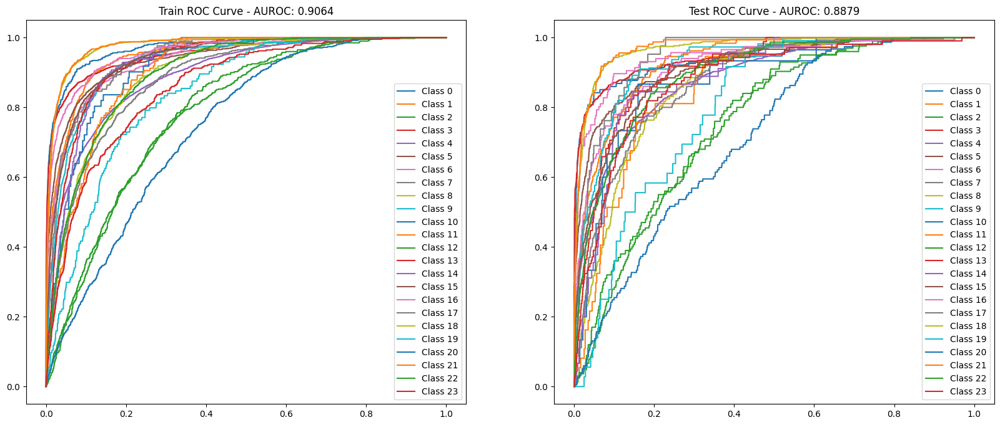

In [61]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

#### Liberación de memoria

In [ ]:
del classifier_model_2

with torch.no_grad():
    torch.cuda.empty_cache()

# Denoising autoencoder

## Entrenamiento del Denoising Autoencoder

In [27]:
denoising_autoencoder_model = Autoencoder().to(device)

denoising_autoencoder_loss_fn_1 = nn.MSELoss()
denoising_autoencoder_optimizer_1 = torch.optim.Adam(denoising_autoencoder_model.parameters(), lr=learning_rate, amsgrad=True)

denoising_autoencoder_dataloader_1 = DataLoader(
    encoder_dataset_1, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [28]:
train_loss = []

start_time = time.time()
for epoch in range(epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    epoch_loss = train(denoising_autoencoder_dataloader_1, denoising_autoencoder_model, denoising_autoencoder_loss_fn_1, denoising_autoencoder_optimizer_1, unsupervised=True, add_noise=True)
    train_loss.append(epoch_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 0.419188  [   32/44358]
Current Loss: 0.313639  [  352/44358]
Current Loss: 0.226902  [  672/44358]
Current Loss: 0.198979  [  992/44358]
Current Loss: 0.183199  [ 1312/44358]
Current Loss: 0.172905  [ 1632/44358]
Current Loss: 0.164406  [ 1952/44358]
Current Loss: 0.156699  [ 2272/44358]
Current Loss: 0.150150  [ 2592/44358]
Current Loss: 0.145419  [ 2912/44358]
Current Loss: 0.141196  [ 3232/44358]
Current Loss: 0.137585  [ 3552/44358]
Current Loss: 0.134500  [ 3872/44358]
Current Loss: 0.132024  [ 4192/44358]
Current Loss: 0.129768  [ 4512/44358]
Current Loss: 0.128296  [ 4832/44358]
Current Loss: 0.126503  [ 5152/44358]
Current Loss: 0.125256  [ 5472/44358]
Current Loss: 0.123956  [ 5792/44358]
Current Loss: 0.122911  [ 6112/44358]
Current Loss: 0.121885  [ 6432/44358]
Current Loss: 0.120783  [ 6752/44358]
Current Loss: 0.119793  [ 7072/443

### Evaluación del modelo

#### Curva de entrenamiento

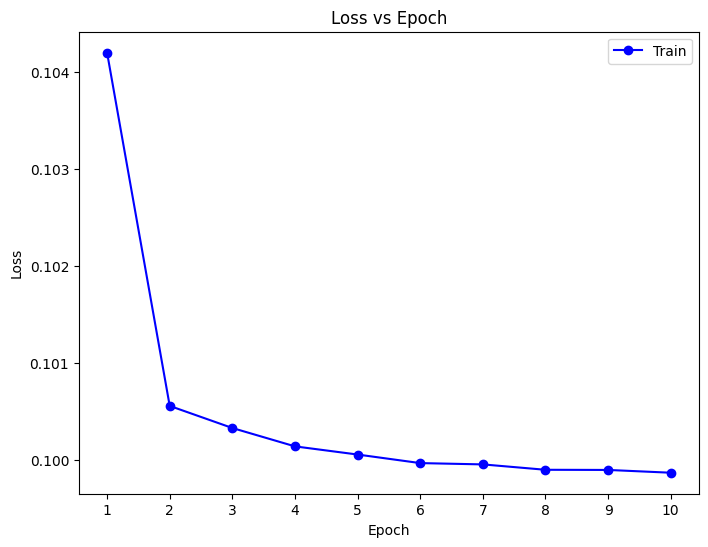

In [29]:
epoch_list = [epoch+1 for epoch in range(epochs)]
show_learning_curve(train_loss, epoch_list=epoch_list)

#### Reconstrucción de imágenes

In [ ]:
test_dataloader_1 = DataLoader(
    test_dataset_1, batch_size=batch_size, shuffle=True)

##### Con ruido

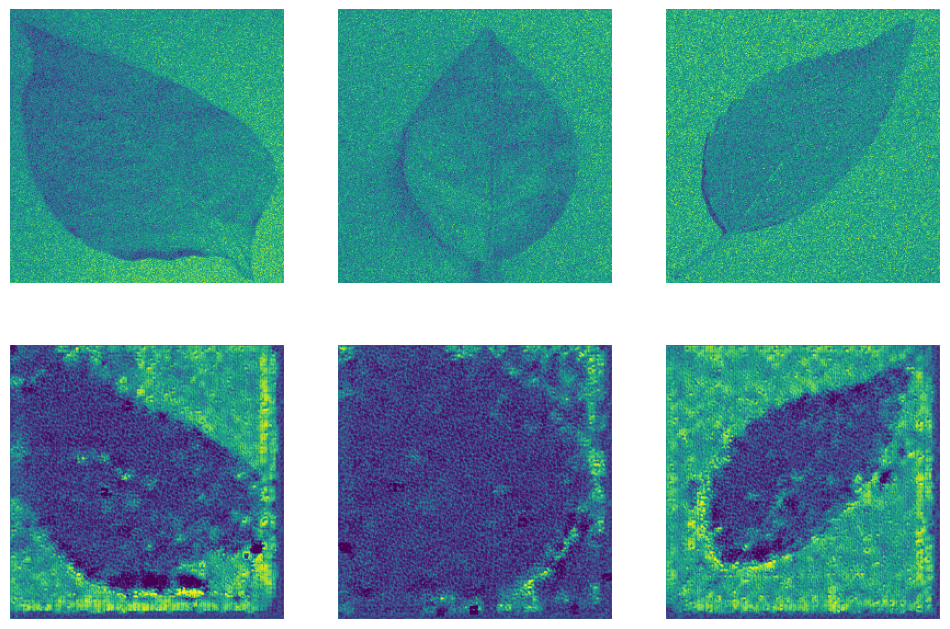

In [ ]:
reconstruct_image(autoencoder_model_1, test_dataloader_1, num_samples=3, add_noise=True)

##### Sin ruido

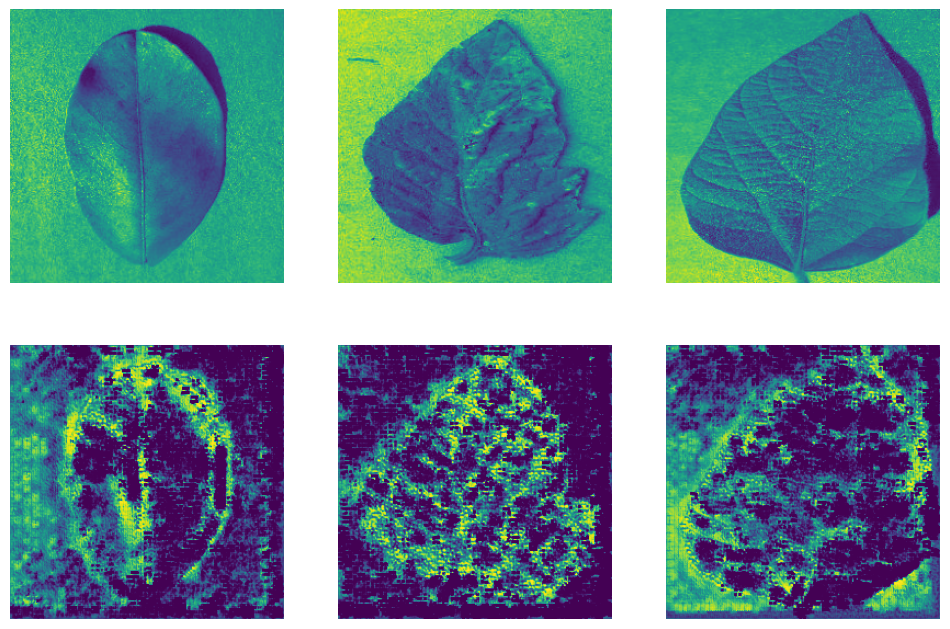

In [ ]:
reconstruct_image(autoencoder_model_1, test_dataloader_1, num_samples=3, add_noise=False)

## Entrenamiento del Clasificador con Denoising Autoencoder sin congelar

In [ ]:
classifier_model = Classifier(input_features=27, encoder_model=denoising_autoencoder_model, freeze_weights=False).to(device)

classifier_loss_fn = nn.CrossEntropyLoss()
classifier_optimizer = torch.optim.Adam(classifier_model.parameters(), lr=classifier_lr, amsgrad=True)

classifier_train_dataloader = DataLoader(
    train_dataset_1, batch_size=batch_size, shuffle=True)

classifier_test_dataloader = DataLoader(
    test_dataset_1, batch_size=batch_size, shuffle=True)

### Ciclo de entrenamiento

In [ ]:
train_metrics = []
test_metrics = []

start_time = time.time()
for epoch in range(classifier_epochs):
    print(f'--------------------------- Epoch {epoch+1} ---------------------------\n')
    train_loss = train(classifier_train_dataloader, classifier_model, classifier_loss_fn, classifier_optimizer)
    test_loss = test(classifier_test_dataloader, classifier_model, classifier_loss_fn)

    compute_metrics(train_metrics, test_metrics, train_loss, test_loss)

end_time = time.time()
print(f'Training time: {(end_time - start_time)/60:>0.3f} minutes')

--------------------------- Epoch 1 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.311964  [   32/ 6654]
Current Loss: 3.471231  [  352/ 6654]
Current Loss: 3.398965  [  672/ 6654]
Current Loss: 3.381278  [  992/ 6654]
Current Loss: 3.361850  [ 1312/ 6654]
Current Loss: 3.350742  [ 1632/ 6654]
Current Loss: 3.345426  [ 1952/ 6654]
Current Loss: 3.339250  [ 2272/ 6654]
Current Loss: 3.335474  [ 2592/ 6654]
Current Loss: 3.334164  [ 2912/ 6654]
Current Loss: 3.331006  [ 3232/ 6654]
Current Loss: 3.329693  [ 3552/ 6654]
Current Loss: 3.328319  [ 3872/ 6654]
Current Loss: 3.325070  [ 4192/ 6654]
Current Loss: 3.323069  [ 4512/ 6654]
Current Loss: 3.318765  [ 4832/ 6654]
Current Loss: 3.317614  [ 5152/ 6654]
Current Loss: 3.315513  [ 5472/ 6654]
Current Loss: 3.314045  [ 5792/ 6654]
Current Loss: 3.311821  [ 6112/ 6654]
Current Loss: 3.308874  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.0000,0.0,0.000000
1,squash-diseased,0.0,0.0000,0.0,0.000000
2,apple-healthy,0.0,0.0000,0.0,0.000000
3,orange-diseased,0.0,0.0000,0.0,0.000000
4,tomato-diseased,0.0,0.0000,0.0,0.000000
5,grape-diseased,1.0,0.0656,1.0,0.123122
6,blueberry-healthy,0.0,0.0000,0.0,0.000000
7,grape-healthy,0.0,0.0000,0.0,0.000000
8,pepper-healthy,0.0,0.0000,0.0,0.000000
9,strawberry-diseased,0.0,0.0000,0.0,0.000000


--------------------------- Epoch 2 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.293047  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.248181  [  352/ 6654]
Current Loss: 3.252008  [  672/ 6654]
Current Loss: 3.253921  [  992/ 6654]
Current Loss: 3.257349  [ 1312/ 6654]
Current Loss: 3.251254  [ 1632/ 6654]
Current Loss: 3.250179  [ 1952/ 6654]
Current Loss: 3.247644  [ 2272/ 6654]
Current Loss: 3.246787  [ 2592/ 6654]
Current Loss: 3.242551  [ 2912/ 6654]
Current Loss: 3.241715  [ 3232/ 6654]
Current Loss: 3.238766  [ 3552/ 6654]
Current Loss: 3.237796  [ 3872/ 6654]
Current Loss: 3.238439  [ 4192/ 6654]
Current Loss: 3.235660  [ 4512/ 6654]
Current Loss: 3.233835  [ 4832/ 6654]
Current Loss: 3.232122  [ 5152/ 6654]
Current Loss: 3.232045  [ 5472/ 6654]
Current Loss: 3.230576  [ 5792/ 6654]
Current Loss: 3.229091  [ 6112/ 6654]
Current Loss: 3.228377  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.0000,0.0,0.000000
1,squash-diseased,0.0,0.0000,0.0,0.000000
2,apple-healthy,0.0,0.0000,0.0,0.000000
3,orange-diseased,0.0,0.0000,0.0,0.000000
4,tomato-diseased,0.0,0.0000,0.0,0.000000
5,grape-diseased,1.0,0.0656,1.0,0.123122
6,blueberry-healthy,0.0,0.0000,0.0,0.000000
7,grape-healthy,0.0,0.0000,0.0,0.000000
8,pepper-healthy,0.0,0.0000,0.0,0.000000
9,strawberry-diseased,0.0,0.0000,0.0,0.000000


--------------------------- Epoch 3 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.210893  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.194333  [  352/ 6654]
Current Loss: 3.206108  [  672/ 6654]
Current Loss: 3.197681  [  992/ 6654]
Current Loss: 3.192973  [ 1312/ 6654]
Current Loss: 3.193256  [ 1632/ 6654]
Current Loss: 3.189843  [ 1952/ 6654]
Current Loss: 3.187553  [ 2272/ 6654]
Current Loss: 3.186412  [ 2592/ 6654]
Current Loss: 3.185181  [ 2912/ 6654]
Current Loss: 3.183613  [ 3232/ 6654]
Current Loss: 3.181812  [ 3552/ 6654]
Current Loss: 3.179160  [ 3872/ 6654]
Current Loss: 3.176200  [ 4192/ 6654]
Current Loss: 3.175010  [ 4512/ 6654]
Current Loss: 3.174968  [ 4832/ 6654]
Current Loss: 3.172126  [ 5152/ 6654]
Current Loss: 3.168975  [ 5472/ 6654]
Current Loss: 3.167452  [ 5792/ 6654]
Current Loss: 3.164721  [ 6112/ 6654]
Current Loss: 3.162872  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.0000,0.0,0.000000
1,squash-diseased,0.0,0.0000,0.0,0.000000
2,apple-healthy,0.0,0.0000,0.0,0.000000
3,orange-diseased,0.0,0.0000,0.0,0.000000
4,tomato-diseased,0.0,0.0000,0.0,0.000000
5,grape-diseased,1.0,0.0656,1.0,0.123122
6,blueberry-healthy,0.0,0.0000,0.0,0.000000
7,grape-healthy,0.0,0.0000,0.0,0.000000
8,pepper-healthy,0.0,0.0000,0.0,0.000000
9,strawberry-diseased,0.0,0.0000,0.0,0.000000


--------------------------- Epoch 4 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.172252  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.124705  [  352/ 6654]
Current Loss: 3.123495  [  672/ 6654]
Current Loss: 3.122762  [  992/ 6654]
Current Loss: 3.122781  [ 1312/ 6654]
Current Loss: 3.122586  [ 1632/ 6654]
Current Loss: 3.121963  [ 1952/ 6654]
Current Loss: 3.121063  [ 2272/ 6654]
Current Loss: 3.119795  [ 2592/ 6654]
Current Loss: 3.118512  [ 2912/ 6654]
Current Loss: 3.118588  [ 3232/ 6654]
Current Loss: 3.115210  [ 3552/ 6654]
Current Loss: 3.112936  [ 3872/ 6654]
Current Loss: 3.109308  [ 4192/ 6654]
Current Loss: 3.107789  [ 4512/ 6654]
Current Loss: 3.107603  [ 4832/ 6654]
Current Loss: 3.106269  [ 5152/ 6654]
Current Loss: 3.105813  [ 5472/ 6654]
Current Loss: 3.104721  [ 5792/ 6654]
Current Loss: 3.104252  [ 6112/ 6654]
Current Loss: 3.102663  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.0000,0.0,0.000000
1,squash-diseased,0.0,0.0000,0.0,0.000000
2,apple-healthy,0.0,0.0000,0.0,0.000000
3,orange-diseased,0.0,0.0000,0.0,0.000000
4,tomato-diseased,0.0,0.0000,0.0,0.000000
5,grape-diseased,1.0,0.0656,1.0,0.123122
6,blueberry-healthy,0.0,0.0000,0.0,0.000000
7,grape-healthy,0.0,0.0000,0.0,0.000000
8,pepper-healthy,0.0,0.0000,0.0,0.000000
9,strawberry-diseased,0.0,0.0000,0.0,0.000000


--------------------------- Epoch 5 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.086726  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.078559  [  352/ 6654]
Current Loss: 3.077011  [  672/ 6654]
Current Loss: 3.073680  [  992/ 6654]
Current Loss: 3.068676  [ 1312/ 6654]
Current Loss: 3.064827  [ 1632/ 6654]
Current Loss: 3.061468  [ 1952/ 6654]
Current Loss: 3.059110  [ 2272/ 6654]
Current Loss: 3.056046  [ 2592/ 6654]
Current Loss: 3.056347  [ 2912/ 6654]
Current Loss: 3.056307  [ 3232/ 6654]
Current Loss: 3.053012  [ 3552/ 6654]
Current Loss: 3.052223  [ 3872/ 6654]
Current Loss: 3.051439  [ 4192/ 6654]
Current Loss: 3.049653  [ 4512/ 6654]
Current Loss: 3.048558  [ 4832/ 6654]
Current Loss: 3.047801  [ 5152/ 6654]
Current Loss: 3.046624  [ 5472/ 6654]
Current Loss: 3.046010  [ 5792/ 6654]
Current Loss: 3.046138  [ 6112/ 6654]
Current Loss: 3.046256  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.0000,0.0,0.000000
1,squash-diseased,0.0,0.0000,0.0,0.000000
2,apple-healthy,0.0,0.0000,0.0,0.000000
3,orange-diseased,0.0,0.0000,0.0,0.000000
4,tomato-diseased,0.0,0.0000,0.0,0.000000
5,grape-diseased,1.0,0.0656,1.0,0.123122
6,blueberry-healthy,0.0,0.0000,0.0,0.000000
7,grape-healthy,0.0,0.0000,0.0,0.000000
8,pepper-healthy,0.0,0.0000,0.0,0.000000
9,strawberry-diseased,0.0,0.0000,0.0,0.000000


--------------------------- Epoch 6 ---------------------------

--------------------------- Training --------------------------

Current Loss: 3.020686  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 3.018868  [  352/ 6654]
Current Loss: 3.017230  [  672/ 6654]
Current Loss: 3.017717  [  992/ 6654]
Current Loss: 3.011251  [ 1312/ 6654]
Current Loss: 3.009442  [ 1632/ 6654]
Current Loss: 3.009421  [ 1952/ 6654]
Current Loss: 3.012168  [ 2272/ 6654]
Current Loss: 3.009689  [ 2592/ 6654]
Current Loss: 3.008466  [ 2912/ 6654]
Current Loss: 3.008774  [ 3232/ 6654]
Current Loss: 3.006946  [ 3552/ 6654]
Current Loss: 3.004918  [ 3872/ 6654]
Current Loss: 3.003439  [ 4192/ 6654]
Current Loss: 3.003876  [ 4512/ 6654]
Current Loss: 3.002008  [ 4832/ 6654]
Current Loss: 3.001826  [ 5152/ 6654]
Current Loss: 2.999179  [ 5472/ 6654]
Current Loss: 2.997640  [ 5792/ 6654]
Current Loss: 2.996344  [ 6112/ 6654]
Current Loss: 2.995173  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 7 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.900681  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.963382  [  352/ 6654]
Current Loss: 2.966883  [  672/ 6654]
Current Loss: 2.971712  [  992/ 6654]
Current Loss: 2.970108  [ 1312/ 6654]
Current Loss: 2.969357  [ 1632/ 6654]
Current Loss: 2.968107  [ 1952/ 6654]
Current Loss: 2.962914  [ 2272/ 6654]
Current Loss: 2.963535  [ 2592/ 6654]
Current Loss: 2.961841  [ 2912/ 6654]
Current Loss: 2.963197  [ 3232/ 6654]
Current Loss: 2.962243  [ 3552/ 6654]
Current Loss: 2.961373  [ 3872/ 6654]
Current Loss: 2.958658  [ 4192/ 6654]
Current Loss: 2.956838  [ 4512/ 6654]
Current Loss: 2.956555  [ 4832/ 6654]
Current Loss: 2.954757  [ 5152/ 6654]
Current Loss: 2.953239  [ 5472/ 6654]
Current Loss: 2.952300  [ 5792/ 6654]
Current Loss: 2.949103  [ 6112/ 6654]
Current Loss: 2.948207  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 8 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.897886  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.944195  [  352/ 6654]
Current Loss: 2.930574  [  672/ 6654]
Current Loss: 2.930766  [  992/ 6654]
Current Loss: 2.932267  [ 1312/ 6654]
Current Loss: 2.923618  [ 1632/ 6654]
Current Loss: 2.922553  [ 1952/ 6654]
Current Loss: 2.921771  [ 2272/ 6654]
Current Loss: 2.920877  [ 2592/ 6654]
Current Loss: 2.919343  [ 2912/ 6654]
Current Loss: 2.919682  [ 3232/ 6654]
Current Loss: 2.916106  [ 3552/ 6654]
Current Loss: 2.915892  [ 3872/ 6654]
Current Loss: 2.914669  [ 4192/ 6654]
Current Loss: 2.912129  [ 4512/ 6654]
Current Loss: 2.911861  [ 4832/ 6654]
Current Loss: 2.910500  [ 5152/ 6654]
Current Loss: 2.908175  [ 5472/ 6654]
Current Loss: 2.908537  [ 5792/ 6654]
Current Loss: 2.906298  [ 6112/ 6654]
Current Loss: 2.904324  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,0.0,0.000000,0.0,0.000000
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 9 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.901037  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.864297  [  352/ 6654]
Current Loss: 2.883320  [  672/ 6654]
Current Loss: 2.874692  [  992/ 6654]
Current Loss: 2.871634  [ 1312/ 6654]
Current Loss: 2.863151  [ 1632/ 6654]
Current Loss: 2.864357  [ 1952/ 6654]
Current Loss: 2.868906  [ 2272/ 6654]
Current Loss: 2.873214  [ 2592/ 6654]
Current Loss: 2.869279  [ 2912/ 6654]
Current Loss: 2.868826  [ 3232/ 6654]
Current Loss: 2.865095  [ 3552/ 6654]
Current Loss: 2.867219  [ 3872/ 6654]
Current Loss: 2.866441  [ 4192/ 6654]
Current Loss: 2.865522  [ 4512/ 6654]
Current Loss: 2.867639  [ 4832/ 6654]
Current Loss: 2.867875  [ 5152/ 6654]
Current Loss: 2.868663  [ 5472/ 6654]
Current Loss: 2.867823  [ 5792/ 6654]
Current Loss: 2.865387  [ 6112/ 6654]
Current Loss: 2.865281  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 10 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.932905  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.861088  [  352/ 6654]
Current Loss: 2.856150  [  672/ 6654]
Current Loss: 2.852187  [  992/ 6654]
Current Loss: 2.856214  [ 1312/ 6654]
Current Loss: 2.851787  [ 1632/ 6654]
Current Loss: 2.842788  [ 1952/ 6654]
Current Loss: 2.844836  [ 2272/ 6654]
Current Loss: 2.843850  [ 2592/ 6654]
Current Loss: 2.841641  [ 2912/ 6654]
Current Loss: 2.836683  [ 3232/ 6654]
Current Loss: 2.837872  [ 3552/ 6654]
Current Loss: 2.838804  [ 3872/ 6654]
Current Loss: 2.835255  [ 4192/ 6654]
Current Loss: 2.833214  [ 4512/ 6654]
Current Loss: 2.833980  [ 4832/ 6654]
Current Loss: 2.833868  [ 5152/ 6654]
Current Loss: 2.835329  [ 5472/ 6654]
Current Loss: 2.833897  [ 5792/ 6654]
Current Loss: 2.833112  [ 6112/ 6654]
Current Loss: 2.833298  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 11 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.702019  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.809535  [  352/ 6654]
Current Loss: 2.807704  [  672/ 6654]
Current Loss: 2.813960  [  992/ 6654]
Current Loss: 2.814472  [ 1312/ 6654]
Current Loss: 2.806595  [ 1632/ 6654]
Current Loss: 2.804818  [ 1952/ 6654]
Current Loss: 2.801270  [ 2272/ 6654]
Current Loss: 2.798821  [ 2592/ 6654]
Current Loss: 2.796618  [ 2912/ 6654]
Current Loss: 2.797407  [ 3232/ 6654]
Current Loss: 2.794428  [ 3552/ 6654]
Current Loss: 2.794456  [ 3872/ 6654]
Current Loss: 2.792265  [ 4192/ 6654]
Current Loss: 2.791371  [ 4512/ 6654]
Current Loss: 2.791920  [ 4832/ 6654]
Current Loss: 2.793517  [ 5152/ 6654]
Current Loss: 2.794848  [ 5472/ 6654]
Current Loss: 2.795078  [ 5792/ 6654]
Current Loss: 2.796203  [ 6112/ 6654]
Current Loss: 2.796658  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 12 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.741709  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.775253  [  352/ 6654]
Current Loss: 2.767663  [  672/ 6654]
Current Loss: 2.762345  [  992/ 6654]
Current Loss: 2.759842  [ 1312/ 6654]
Current Loss: 2.769060  [ 1632/ 6654]
Current Loss: 2.762869  [ 1952/ 6654]
Current Loss: 2.768160  [ 2272/ 6654]
Current Loss: 2.772775  [ 2592/ 6654]
Current Loss: 2.774416  [ 2912/ 6654]
Current Loss: 2.770209  [ 3232/ 6654]
Current Loss: 2.769598  [ 3552/ 6654]
Current Loss: 2.769250  [ 3872/ 6654]
Current Loss: 2.770358  [ 4192/ 6654]
Current Loss: 2.768235  [ 4512/ 6654]
Current Loss: 2.769506  [ 4832/ 6654]
Current Loss: 2.773884  [ 5152/ 6654]
Current Loss: 2.773237  [ 5472/ 6654]
Current Loss: 2.771973  [ 5792/ 6654]
Current Loss: 2.772259  [ 6112/ 6654]
Current Loss: 2.772329  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 13 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.856662  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.848369  [  352/ 6654]
Current Loss: 2.793086  [  672/ 6654]
Current Loss: 2.759721  [  992/ 6654]
Current Loss: 2.765941  [ 1312/ 6654]
Current Loss: 2.767416  [ 1632/ 6654]
Current Loss: 2.759376  [ 1952/ 6654]
Current Loss: 2.761077  [ 2272/ 6654]
Current Loss: 2.760807  [ 2592/ 6654]
Current Loss: 2.765512  [ 2912/ 6654]
Current Loss: 2.762006  [ 3232/ 6654]
Current Loss: 2.760201  [ 3552/ 6654]
Current Loss: 2.757192  [ 3872/ 6654]
Current Loss: 2.753271  [ 4192/ 6654]
Current Loss: 2.752626  [ 4512/ 6654]
Current Loss: 2.752313  [ 4832/ 6654]
Current Loss: 2.753812  [ 5152/ 6654]
Current Loss: 2.752901  [ 5472/ 6654]
Current Loss: 2.752657  [ 5792/ 6654]
Current Loss: 2.749805  [ 6112/ 6654]
Current Loss: 2.747518  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 14 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.782612  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.713049  [  352/ 6654]
Current Loss: 2.726807  [  672/ 6654]
Current Loss: 2.721393  [  992/ 6654]
Current Loss: 2.738475  [ 1312/ 6654]
Current Loss: 2.729371  [ 1632/ 6654]
Current Loss: 2.727089  [ 1952/ 6654]
Current Loss: 2.726549  [ 2272/ 6654]
Current Loss: 2.733883  [ 2592/ 6654]
Current Loss: 2.733998  [ 2912/ 6654]
Current Loss: 2.738693  [ 3232/ 6654]
Current Loss: 2.733356  [ 3552/ 6654]
Current Loss: 2.736742  [ 3872/ 6654]
Current Loss: 2.730642  [ 4192/ 6654]
Current Loss: 2.729245  [ 4512/ 6654]
Current Loss: 2.726869  [ 4832/ 6654]
Current Loss: 2.727039  [ 5152/ 6654]
Current Loss: 2.728050  [ 5472/ 6654]
Current Loss: 2.724120  [ 5792/ 6654]
Current Loss: 2.725584  [ 6112/ 6654]
Current Loss: 2.724723  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 15 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.486558  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.675721  [  352/ 6654]
Current Loss: 2.667745  [  672/ 6654]
Current Loss: 2.663721  [  992/ 6654]
Current Loss: 2.682594  [ 1312/ 6654]
Current Loss: 2.705786  [ 1632/ 6654]
Current Loss: 2.717102  [ 1952/ 6654]
Current Loss: 2.723852  [ 2272/ 6654]
Current Loss: 2.720974  [ 2592/ 6654]
Current Loss: 2.714351  [ 2912/ 6654]
Current Loss: 2.709603  [ 3232/ 6654]
Current Loss: 2.708488  [ 3552/ 6654]
Current Loss: 2.712036  [ 3872/ 6654]
Current Loss: 2.711840  [ 4192/ 6654]
Current Loss: 2.714896  [ 4512/ 6654]
Current Loss: 2.711438  [ 4832/ 6654]
Current Loss: 2.709393  [ 5152/ 6654]
Current Loss: 2.705885  [ 5472/ 6654]
Current Loss: 2.706851  [ 5792/ 6654]
Current Loss: 2.702855  [ 6112/ 6654]
Current Loss: 2.706837  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 16 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.623466  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.758218  [  352/ 6654]
Current Loss: 2.687161  [  672/ 6654]
Current Loss: 2.701716  [  992/ 6654]
Current Loss: 2.703737  [ 1312/ 6654]
Current Loss: 2.705004  [ 1632/ 6654]
Current Loss: 2.695934  [ 1952/ 6654]
Current Loss: 2.694712  [ 2272/ 6654]
Current Loss: 2.696591  [ 2592/ 6654]
Current Loss: 2.690246  [ 2912/ 6654]
Current Loss: 2.690827  [ 3232/ 6654]
Current Loss: 2.691001  [ 3552/ 6654]
Current Loss: 2.688350  [ 3872/ 6654]
Current Loss: 2.685392  [ 4192/ 6654]
Current Loss: 2.687822  [ 4512/ 6654]
Current Loss: 2.687782  [ 4832/ 6654]
Current Loss: 2.687898  [ 5152/ 6654]
Current Loss: 2.689375  [ 5472/ 6654]
Current Loss: 2.689139  [ 5792/ 6654]
Current Loss: 2.690160  [ 6112/ 6654]
Current Loss: 2.689437  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 17 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.645141  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.677599  [  352/ 6654]
Current Loss: 2.698078  [  672/ 6654]
Current Loss: 2.685517  [  992/ 6654]
Current Loss: 2.685717  [ 1312/ 6654]
Current Loss: 2.675170  [ 1632/ 6654]
Current Loss: 2.686601  [ 1952/ 6654]
Current Loss: 2.689002  [ 2272/ 6654]
Current Loss: 2.688965  [ 2592/ 6654]
Current Loss: 2.687023  [ 2912/ 6654]
Current Loss: 2.682025  [ 3232/ 6654]
Current Loss: 2.679447  [ 3552/ 6654]
Current Loss: 2.680527  [ 3872/ 6654]
Current Loss: 2.679276  [ 4192/ 6654]
Current Loss: 2.675891  [ 4512/ 6654]
Current Loss: 2.678124  [ 4832/ 6654]
Current Loss: 2.676621  [ 5152/ 6654]
Current Loss: 2.676147  [ 5472/ 6654]
Current Loss: 2.678065  [ 5792/ 6654]
Current Loss: 2.679948  [ 6112/ 6654]
Current Loss: 2.679793  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 18 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.493000  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.752471  [  352/ 6654]
Current Loss: 2.685861  [  672/ 6654]
Current Loss: 2.672243  [  992/ 6654]
Current Loss: 2.680190  [ 1312/ 6654]
Current Loss: 2.679336  [ 1632/ 6654]
Current Loss: 2.675357  [ 1952/ 6654]
Current Loss: 2.677410  [ 2272/ 6654]
Current Loss: 2.675017  [ 2592/ 6654]
Current Loss: 2.672961  [ 2912/ 6654]
Current Loss: 2.676437  [ 3232/ 6654]
Current Loss: 2.677420  [ 3552/ 6654]
Current Loss: 2.672220  [ 3872/ 6654]
Current Loss: 2.665757  [ 4192/ 6654]
Current Loss: 2.666093  [ 4512/ 6654]
Current Loss: 2.667577  [ 4832/ 6654]
Current Loss: 2.668103  [ 5152/ 6654]
Current Loss: 2.664009  [ 5472/ 6654]
Current Loss: 2.660992  [ 5792/ 6654]
Current Loss: 2.664247  [ 6112/ 6654]
Current Loss: 2.666862  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 19 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.990722  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.676551  [  352/ 6654]
Current Loss: 2.669595  [  672/ 6654]
Current Loss: 2.640777  [  992/ 6654]
Current Loss: 2.639458  [ 1312/ 6654]
Current Loss: 2.647822  [ 1632/ 6654]
Current Loss: 2.648425  [ 1952/ 6654]
Current Loss: 2.649750  [ 2272/ 6654]
Current Loss: 2.658014  [ 2592/ 6654]
Current Loss: 2.663173  [ 2912/ 6654]
Current Loss: 2.666998  [ 3232/ 6654]
Current Loss: 2.670286  [ 3552/ 6654]
Current Loss: 2.666917  [ 3872/ 6654]
Current Loss: 2.664072  [ 4192/ 6654]
Current Loss: 2.663777  [ 4512/ 6654]
Current Loss: 2.660753  [ 4832/ 6654]
Current Loss: 2.658243  [ 5152/ 6654]
Current Loss: 2.657593  [ 5472/ 6654]
Current Loss: 2.655568  [ 5792/ 6654]
Current Loss: 2.657067  [ 6112/ 6654]
Current Loss: 2.655394  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 20 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.591612  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.659051  [  352/ 6654]
Current Loss: 2.682938  [  672/ 6654]
Current Loss: 2.647476  [  992/ 6654]
Current Loss: 2.650687  [ 1312/ 6654]
Current Loss: 2.652086  [ 1632/ 6654]
Current Loss: 2.650006  [ 1952/ 6654]
Current Loss: 2.651164  [ 2272/ 6654]
Current Loss: 2.645856  [ 2592/ 6654]
Current Loss: 2.641966  [ 2912/ 6654]
Current Loss: 2.642135  [ 3232/ 6654]
Current Loss: 2.640429  [ 3552/ 6654]
Current Loss: 2.637402  [ 3872/ 6654]
Current Loss: 2.641543  [ 4192/ 6654]
Current Loss: 2.647021  [ 4512/ 6654]
Current Loss: 2.649157  [ 4832/ 6654]
Current Loss: 2.651534  [ 5152/ 6654]
Current Loss: 2.652843  [ 5472/ 6654]
Current Loss: 2.652272  [ 5792/ 6654]
Current Loss: 2.653171  [ 6112/ 6654]
Current Loss: 2.653575  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 21 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.230736  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.629443  [  352/ 6654]
Current Loss: 2.638648  [  672/ 6654]
Current Loss: 2.622722  [  992/ 6654]
Current Loss: 2.626890  [ 1312/ 6654]
Current Loss: 2.614474  [ 1632/ 6654]
Current Loss: 2.613288  [ 1952/ 6654]
Current Loss: 2.616701  [ 2272/ 6654]
Current Loss: 2.616625  [ 2592/ 6654]
Current Loss: 2.626411  [ 2912/ 6654]
Current Loss: 2.627193  [ 3232/ 6654]
Current Loss: 2.627576  [ 3552/ 6654]
Current Loss: 2.628142  [ 3872/ 6654]
Current Loss: 2.632427  [ 4192/ 6654]
Current Loss: 2.632241  [ 4512/ 6654]
Current Loss: 2.631244  [ 4832/ 6654]
Current Loss: 2.632994  [ 5152/ 6654]
Current Loss: 2.635845  [ 5472/ 6654]
Current Loss: 2.635947  [ 5792/ 6654]
Current Loss: 2.638457  [ 6112/ 6654]
Current Loss: 2.637864  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 22 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.703394  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.682185  [  352/ 6654]
Current Loss: 2.652081  [  672/ 6654]
Current Loss: 2.632331  [  992/ 6654]
Current Loss: 2.640644  [ 1312/ 6654]
Current Loss: 2.637868  [ 1632/ 6654]
Current Loss: 2.652956  [ 1952/ 6654]
Current Loss: 2.638952  [ 2272/ 6654]
Current Loss: 2.640215  [ 2592/ 6654]
Current Loss: 2.639331  [ 2912/ 6654]
Current Loss: 2.641134  [ 3232/ 6654]
Current Loss: 2.632193  [ 3552/ 6654]
Current Loss: 2.627298  [ 3872/ 6654]
Current Loss: 2.624780  [ 4192/ 6654]
Current Loss: 2.627465  [ 4512/ 6654]
Current Loss: 2.629569  [ 4832/ 6654]
Current Loss: 2.628153  [ 5152/ 6654]
Current Loss: 2.626640  [ 5472/ 6654]
Current Loss: 2.632330  [ 5792/ 6654]
Current Loss: 2.632931  [ 6112/ 6654]
Current Loss: 2.632678  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 23 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.684442  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.625194  [  352/ 6654]
Current Loss: 2.641803  [  672/ 6654]
Current Loss: 2.649691  [  992/ 6654]
Current Loss: 2.655647  [ 1312/ 6654]
Current Loss: 2.642509  [ 1632/ 6654]
Current Loss: 2.629047  [ 1952/ 6654]
Current Loss: 2.624759  [ 2272/ 6654]
Current Loss: 2.635639  [ 2592/ 6654]
Current Loss: 2.647435  [ 2912/ 6654]
Current Loss: 2.636269  [ 3232/ 6654]
Current Loss: 2.637727  [ 3552/ 6654]
Current Loss: 2.632123  [ 3872/ 6654]
Current Loss: 2.631401  [ 4192/ 6654]
Current Loss: 2.637144  [ 4512/ 6654]
Current Loss: 2.641224  [ 4832/ 6654]
Current Loss: 2.638358  [ 5152/ 6654]
Current Loss: 2.636909  [ 5472/ 6654]
Current Loss: 2.638591  [ 5792/ 6654]
Current Loss: 2.635290  [ 6112/ 6654]
Current Loss: 2.637436  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 24 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.512109  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.631514  [  352/ 6654]
Current Loss: 2.654874  [  672/ 6654]
Current Loss: 2.638594  [  992/ 6654]
Current Loss: 2.625732  [ 1312/ 6654]
Current Loss: 2.630697  [ 1632/ 6654]
Current Loss: 2.632861  [ 1952/ 6654]
Current Loss: 2.624721  [ 2272/ 6654]
Current Loss: 2.615403  [ 2592/ 6654]
Current Loss: 2.612175  [ 2912/ 6654]
Current Loss: 2.619883  [ 3232/ 6654]
Current Loss: 2.627859  [ 3552/ 6654]
Current Loss: 2.629872  [ 3872/ 6654]
Current Loss: 2.632747  [ 4192/ 6654]
Current Loss: 2.631518  [ 4512/ 6654]
Current Loss: 2.633533  [ 4832/ 6654]
Current Loss: 2.639481  [ 5152/ 6654]
Current Loss: 2.637481  [ 5472/ 6654]
Current Loss: 2.633751  [ 5792/ 6654]
Current Loss: 2.631067  [ 6112/ 6654]
Current Loss: 2.629402  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


--------------------------- Epoch 25 ---------------------------

--------------------------- Training --------------------------

Current Loss: 2.854458  [   32/ 6654]


/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Current Loss: 2.665651  [  352/ 6654]
Current Loss: 2.621775  [  672/ 6654]
Current Loss: 2.591604  [  992/ 6654]
Current Loss: 2.593932  [ 1312/ 6654]
Current Loss: 2.610659  [ 1632/ 6654]
Current Loss: 2.621843  [ 1952/ 6654]
Current Loss: 2.619635  [ 2272/ 6654]
Current Loss: 2.621314  [ 2592/ 6654]
Current Loss: 2.626164  [ 2912/ 6654]
Current Loss: 2.626145  [ 3232/ 6654]
Current Loss: 2.618950  [ 3552/ 6654]
Current Loss: 2.616500  [ 3872/ 6654]
Current Loss: 2.617086  [ 4192/ 6654]
Current Loss: 2.617300  [ 4512/ 6654]
Current Loss: 2.619148  [ 4832/ 6654]
Current Loss: 2.626797  [ 5152/ 6654]
Current Loss: 2.626489  [ 5472/ 6654]
Current Loss: 2.623602  [ 5792/ 6654]
Current Loss: 2.626559  [ 6112/ 6654]
Current Loss: 2.629261  [ 6432/ 6654]
--------------------------- Testing ---------------------------



,Class,Test Accuracy,Test Precision,Test Recall,Test F1-Score
0,no-leaf,0.0,0.000000,0.0,0.000000
1,squash-diseased,0.0,0.000000,0.0,0.000000
2,apple-healthy,0.0,0.000000,0.0,0.000000
3,orange-diseased,0.0,0.000000,0.0,0.000000
4,tomato-diseased,1.0,0.298918,1.0,0.460257
5,grape-diseased,0.0,0.000000,0.0,0.000000
6,blueberry-healthy,0.0,0.000000,0.0,0.000000
7,grape-healthy,0.0,0.000000,0.0,0.000000
8,pepper-healthy,0.0,0.000000,0.0,0.000000
9,strawberry-diseased,0.0,0.000000,0.0,0.000000


Training time: 13.267 minutes


### Evaluación del modelo

#### Curva de entrenamiento

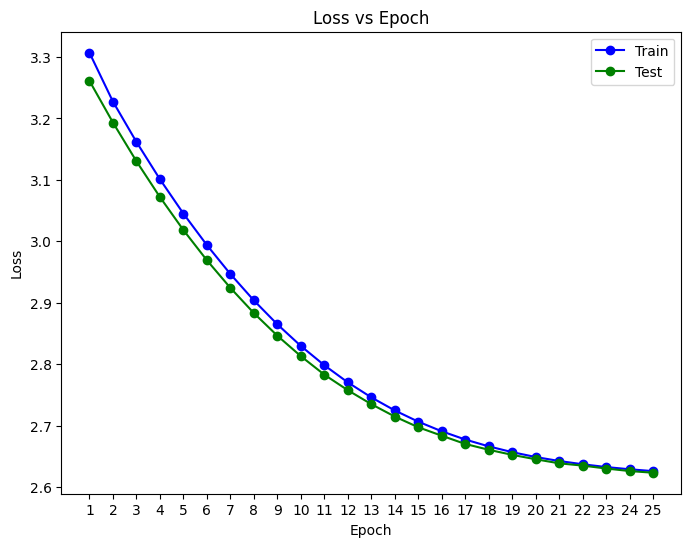

In [ ]:
epoch_list = [epoch+1 for epoch in range(classifier_epochs)]
train_losses = [train_metrics[i]['loss'] for i in range(classifier_epochs)]
test_losses = [test_metrics[i]['loss'] for i in range(classifier_epochs)]

show_learning_curve(train_losses, test_losses, epoch_list)

#### Métricas

In [ ]:
show_metrics_table(train_metrics, test_metrics, classifier_epochs)

------------------------------------------------------- Epoch #1 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
1,squash-diseased,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
2,apple-healthy,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
3,orange-diseased,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
4,tomato-diseased,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
5,grape-diseased,0.025172,1.0,0.054187,0.0656,0.025172,1.0,0.034375,0.123122
6,blueberry-healthy,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
7,grape-healthy,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
8,pepper-healthy,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000
9,strawberry-diseased,0.000000,0.0,0.000000,0.0000,0.000000,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #2 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
5,grape-diseased,1.0,1.0,0.065675,0.0656,1.0,1.0,0.123255,0.123122
6,blueberry-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #3 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
5,grape-diseased,1.0,1.0,0.065675,0.0656,1.0,1.0,0.123255,0.123122
6,blueberry-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #4 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
5,grape-diseased,1.0,1.0,0.065675,0.0656,1.0,1.0,0.123255,0.123122
6,blueberry-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #5 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
5,grape-diseased,1.0,1.0,0.065675,0.0656,1.0,1.0,0.123255,0.123122
6,blueberry-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.0000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #6 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
1,squash-diseased,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
2,apple-healthy,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
3,orange-diseased,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
4,tomato-diseased,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
5,grape-diseased,0.05492,0.0,0.075000,0.000000,0.05492,0.0,0.063408,0.000000
6,blueberry-healthy,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
7,grape-healthy,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
8,pepper-healthy,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000
9,strawberry-diseased,0.00000,0.0,0.000000,0.000000,0.00000,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #7 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #8 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #9 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
1,squash-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
2,apple-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
3,orange-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
4,tomato-diseased,0.202213,1.0,0.299553,0.298918,0.202213,1.0,0.241441,0.460257
5,grape-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
6,blueberry-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
7,grape-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
8,pepper-healthy,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000
9,strawberry-diseased,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #10 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #11 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #12 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #13 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #14 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #15 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #16 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #17 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #18 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #19 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #20 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #21 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #22 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #23 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #24 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


------------------------------------------------------- Epoch #25 -------------------------------------------------------


,Class,Train Accuracy,Test Accuracy,Train Precision,Test Precision,Train Recall,Test Recall,Train F1-Score,Test F1-Score
0,no-leaf,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
1,squash-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
2,apple-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
3,orange-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
4,tomato-diseased,1.0,1.0,0.298768,0.298918,1.0,1.0,0.460079,0.460257
5,grape-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
6,blueberry-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
7,grape-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
8,pepper-healthy,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000
9,strawberry-diseased,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000


#### AUROC

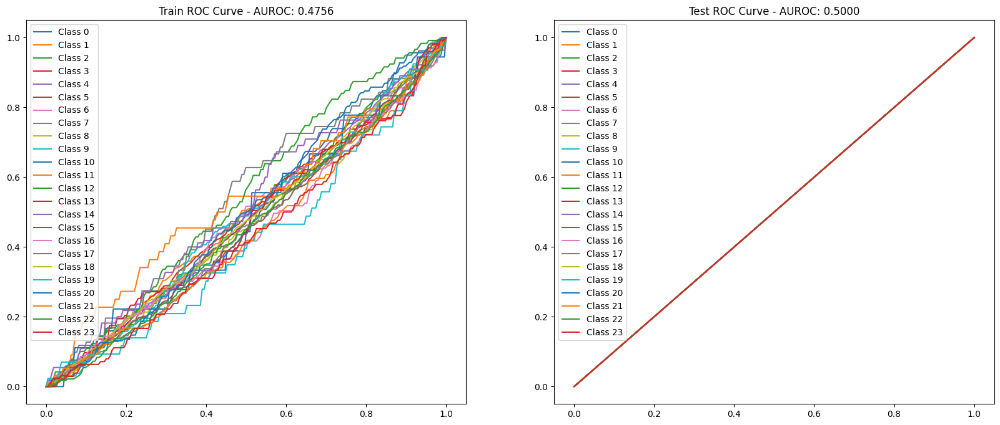

In [ ]:
train_roc_fpr = train_metrics[-1]['roc'][0]
train_roc_tpr = train_metrics[-1]['roc'][1]
train_auroc_value = train_metrics[-1]['auroc'].item()

test_roc_fpr = test_metrics[-1]['roc'][0]
test_roc_tpr = test_metrics[-1]['roc'][1]
test_auroc_value = test_metrics[-1]['auroc'].item()

show_auroc_plot(train_roc_fpr, train_roc_tpr, train_auroc_value, test_roc_fpr, test_roc_tpr, test_auroc_value)

# Visualización de vectores latentes

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

In [39]:
test_dataloader_1 = DataLoader(test_dataset_1, batch_size=1, shuffle=True)

## Autoencoder

In [50]:
# Obtener características de todas las imágenes
image_features = []
image_labels = []

for (image, label) in test_dataloader_1:
  with torch.no_grad():
    image = image.to(device)
    features = autoencoder_model_1.encode(image)
    features = features.flatten()
    features = Tensor.cpu(features).detach().numpy()

    image_features.append(features)
    image_labels.append(label.item())

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [51]:
image_features = np.array(image_features)
image_labels = np.array(image_labels)

# Aplicar t-SNE para reducir la dimensionalidad a 2D
tsne = TSNE(n_components=2, random_state=42)
latent_tsne = tsne.fit_transform(image_features)

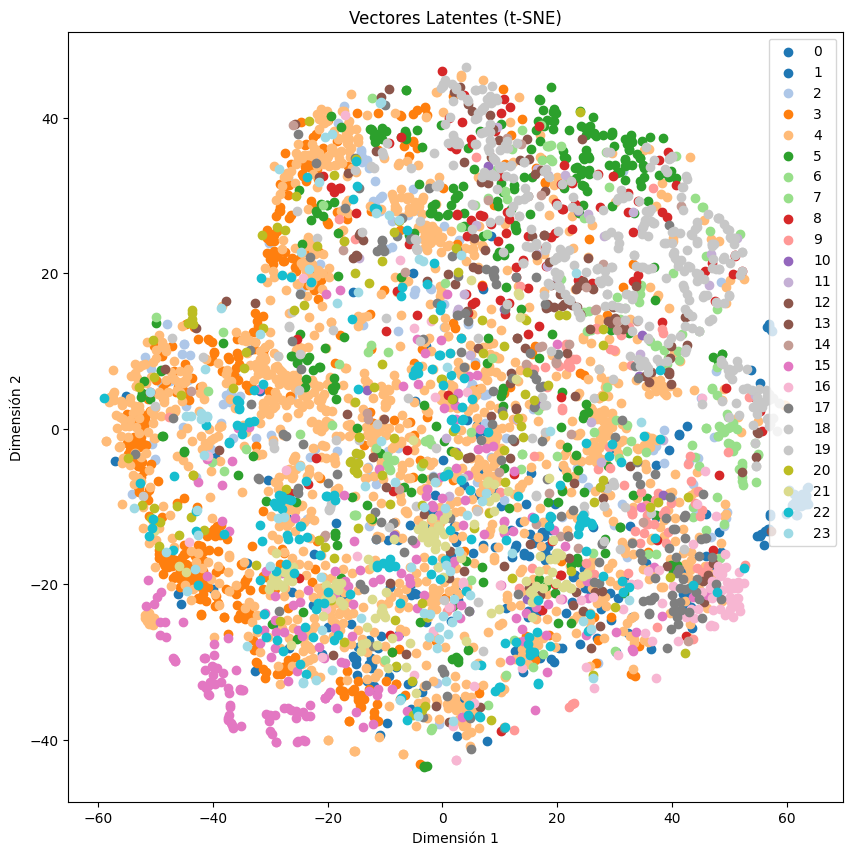

In [52]:
# Obtener clases únicas
unique_labels = np.unique(image_labels)
num_classes = len(unique_labels)

# Generar un color para cada clase
color_map = plt.get_cmap('tab20')

# Visualizar los vectores latentes en un gráfico 2D con colores por clase
plt.figure(figsize=(10, 10))

for i, label in enumerate(unique_labels):
    class_indices = np.where(image_labels == label)[0]
    plt.scatter(latent_tsne[class_indices, 0], latent_tsne[class_indices, 1], color=color_map(i / num_classes), label=label)

plt.title('Vectores Latentes (t-SNE)')
plt.xlabel('Dimensión 1')
plt.ylabel('Dimensión 2')
plt.legend()
plt.show()

## Denoising Autoencoder

In [54]:
# Obtener características de todas las imágenes
image_features = []
image_labels = []

for (image, label) in test_dataloader_1:
  with torch.no_grad():
    image = image.to(device)
    features = denoising_autoencoder_model.encode(image)
    features = features.flatten()
    features = Tensor.cpu(features).detach().numpy()

    image_features.append(features)
    image_labels.append(label.item())

/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [55]:
image_features = np.array(image_features)
image_labels = np.array(image_labels)

# Aplicar t-SNE para reducir la dimensionalidad a 2D
tsne = TSNE(n_components=2, random_state=42)
latent_tsne = tsne.fit_transform(image_features)

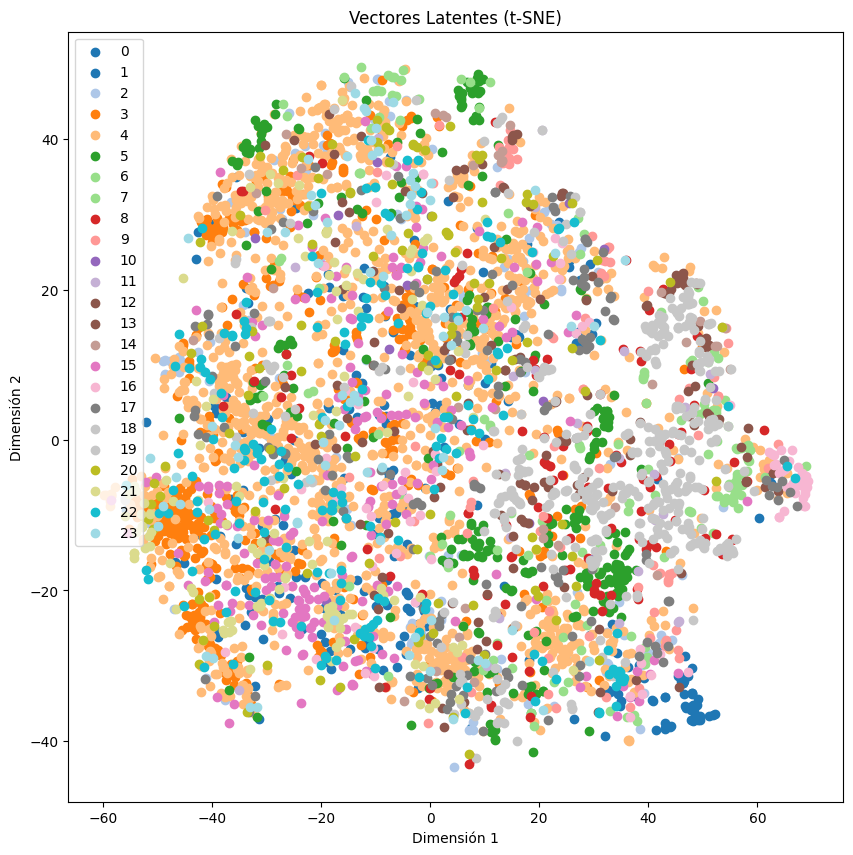

In [56]:
# Obtener clases únicas
unique_labels = np.unique(image_labels)
num_classes = len(unique_labels)

# Generar un color para cada clase
color_map = plt.get_cmap('tab20')

# Visualizar los vectores latentes en un gráfico 2D con colores por clase
plt.figure(figsize=(10, 10))

for i, label in enumerate(unique_labels):
    class_indices = np.where(image_labels == label)[0]
    plt.scatter(latent_tsne[class_indices, 0], latent_tsne[class_indices, 1], color=color_map(i / num_classes), label=label)

plt.title('Vectores Latentes (t-SNE)')
plt.xlabel('Dimensión 1')
plt.ylabel('Dimensión 2')
plt.legend()
plt.show()